# CMPINF 2100 Final Project 
## Priyadarshini Behera - PITT Athletics

## *Section A - Introduction*

I am working on the Pitt Athletics Off-Field Analytics project because it uses interdisciplinary skills of sports, analytics, and business management- all of which I think is very crucial to learn and apply in this field. I solved this as a `classification problem` because there are only 2 categories in this project, customers that will purchase a season ticket next and those that will not be purchasing tickets next year. 

Based on the analysis that I have completed, it seems that certain binned ages (specifically middle aged like 36-45, 46-55, and 56-65) and genders (male) played a large role in influencing whether or not they were coming back to renew their season ticket next year. The price type and puchase month also had an impact because we could see that when IA tickets were purchased or when tickets were purchased in "other" months vs. Jan-Feb(highest return), they were least likely to return next season. 

I used a combination of predcitive models and cross validation to support my conclusions. The Logistic regression models, Ridge, Lasso, and ElasticNet all helped me identify predictors with the most significance. The cross validation proved to me that model 4(which included all the inputs) performed the best , which gave m more confidence in my results.

EDA definitely provided a lot of insight into the trends and helped me identify certain relationships to look out for. When I used box plots, it had showed me the likelihood of certain ages and genders returning. 

Clustering was consistent with the predictive models as it showed certain age and gender conbinations had higher return rates. The cluster distributions also had matched what the regression models had thought were significant influencers. 

Throughout this project, I gained a lot of skills on data preprocessing, utilizing various exploratory data analysis plots, clustering, cross validation, making logistic regression models, and various types of predictive modeling. 

I learned how to analyze data and find trends/predictors, which can help me in my field of analyzing health data. It taught me how to use critical thinking to develop models, clean data, and also use my statistics knowledge. Hopefully I can expand on this even more and develop some real world applications that can help identify patterns for our wellbeing. 

## *Section B - EDA*

In [518]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='seaborn')

In [519]:
df_athletics = pd.read_csv('pitt_athletics_cmpinf2100_project.csv')

In [520]:
# Rows and columns of the data
df_athletics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3360 entries, 0 to 3359
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   accountid           3360 non-null   int64  
 1   age                 1567 non-null   float64
 2   gender              582 non-null    object 
 3   distancemiles       3360 non-null   float64
 4   direction           3360 non-null   object 
 5   peak_drivetime      2958 non-null   float64
 6   offpeak_drivetime   2996 non-null   float64
 7   season              3360 non-null   int64  
 8   purchase_month      3360 non-null   object 
 9   purchase_dow        3360 non-null   object 
 10  price_type          3360 non-null   object 
 11  price_level         3360 non-null   object 
 12  ticket_count        3360 non-null   int64  
 13  price_per_ticket    3360 non-null   float64
 14  return_next_season  3360 non-null   object 
dtypes: float64(5), int64(3), object(7)
memory usage: 393.9+

## Variables

### Categorical Variables:
* gender 
* direction
* purchase_month
* purchase_dow
* price_type
* price_level
* age (since this variable was binned)

### Continuous Variables:

* distancemiles
* ticket_count
* price_per_ticket

### Response Variables:
The outcome variable will be the `return_next_season`, which will be defined in a `0` and `1` format which will clarify if they are purchasing tickets again or if they are not purchasing tickets again for the next season.

### Which variables will not be used: 

The identifier is `accountid`, so it should not be used.

`peak_drivetime` and `offpeak_drivetime` will also NOT be considered as they have many missing values. They can be accounted for with the distancemiles and direction variables as they show the behavior of the peak_drivetime and offpeak_driveteam variables well, allowing us to ignore them.

The `season` variable will also not be used as it only has 1 value.

In [521]:
# Missing values per variable
df_athletics.isna().sum()

accountid                0
age                   1793
gender                2778
distancemiles            0
direction                0
peak_drivetime         402
offpeak_drivetime      364
season                   0
purchase_month           0
purchase_dow             0
price_type               0
price_level              0
ticket_count             0
price_per_ticket         0
return_next_season       0
dtype: int64

In [522]:
# Number of unique values per variable
df_athletics.nunique()

accountid             3360
age                     70
gender                   4
distancemiles         3300
direction                8
peak_drivetime        2311
offpeak_drivetime     2333
season                   1
purchase_month           3
purchase_dow             6
price_type               4
price_level              8
ticket_count            20
price_per_ticket       113
return_next_season       2
dtype: int64

## Categorical Variables 

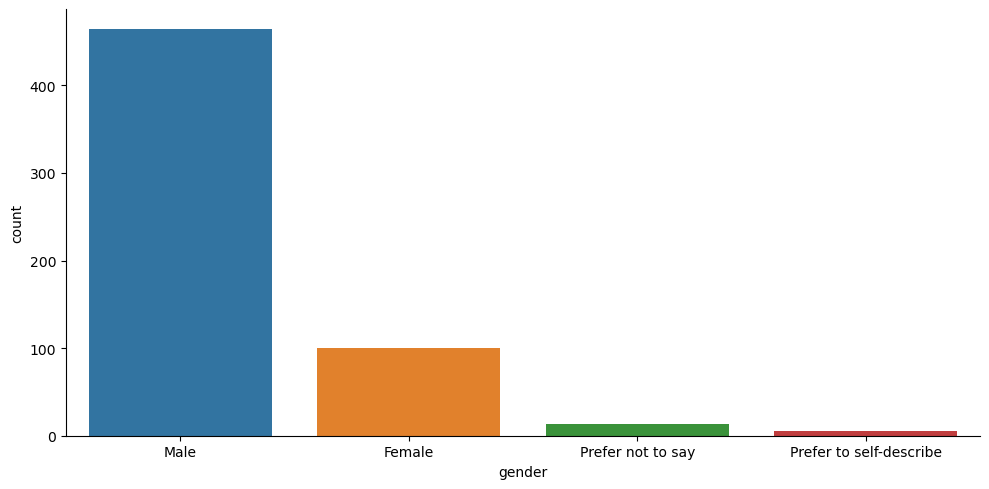

In [523]:
# Gender (Male, Female, Prefer not to say, Prefer to self-describe)
sns.catplot(data = df_athletics, x = 'gender', kind = 'count', aspect = 2)
plt.show()

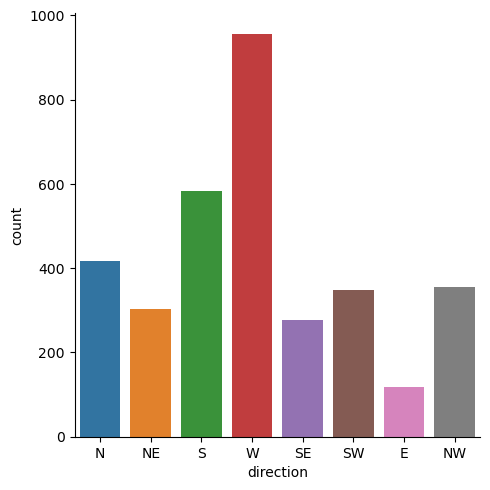

In [524]:
# Direction 
sns.catplot(data = df_athletics, x = 'direction', kind = 'count')
plt.show()

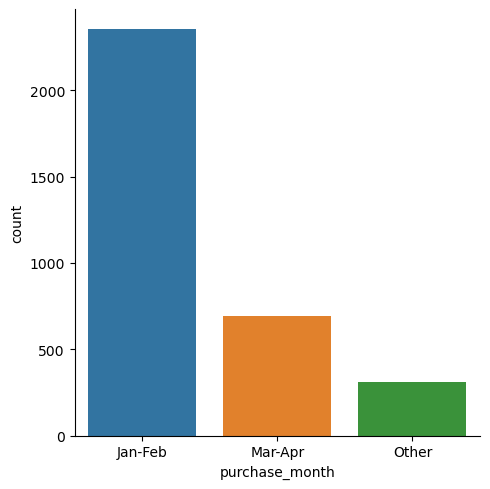

In [525]:
# Month ticket was purchased
sns.catplot(data = df_athletics, x = 'purchase_month', kind= 'count')
plt.show()

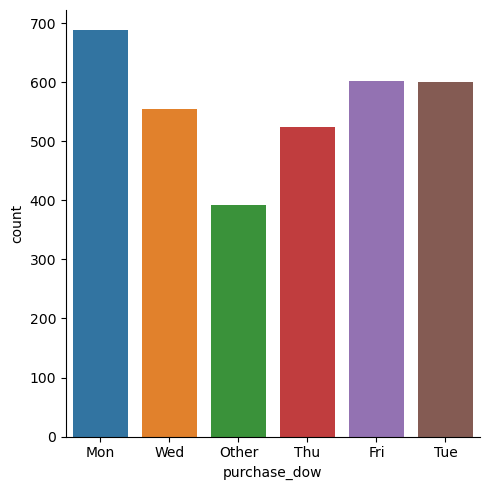

In [526]:
# What day of the week was the ticket purchased 
sns.catplot(data = df_athletics, x = 'purchase_dow', kind= 'count')
plt.show()

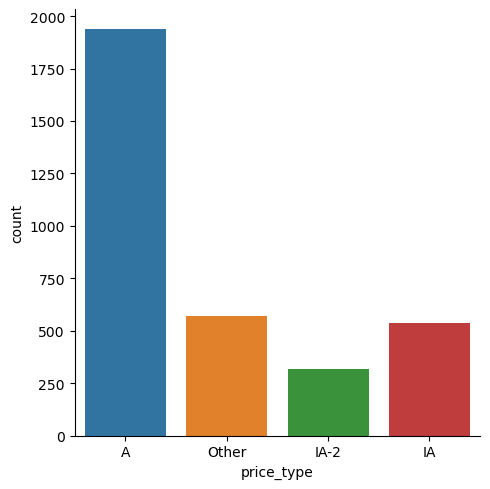

In [527]:
#Price type of the ticket
sns.catplot(data = df_athletics, x = 'price_type', kind= 'count')
plt.show()

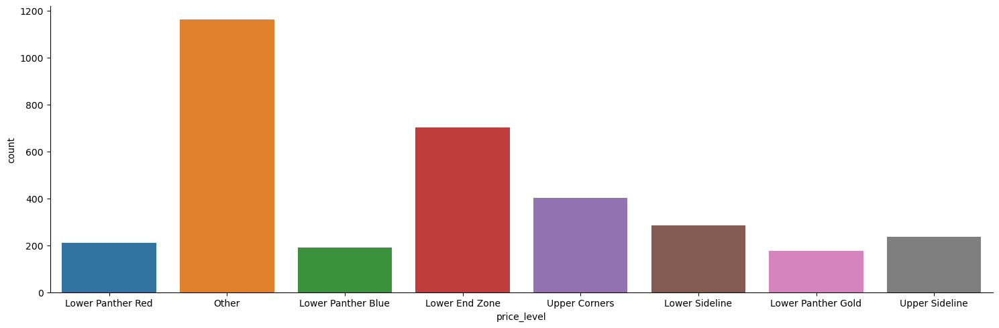

In [528]:
# Price level of the ticket
sns.catplot(data = df_athletics, x = 'price_level', kind= 'count', aspect = 3)
plt.show()

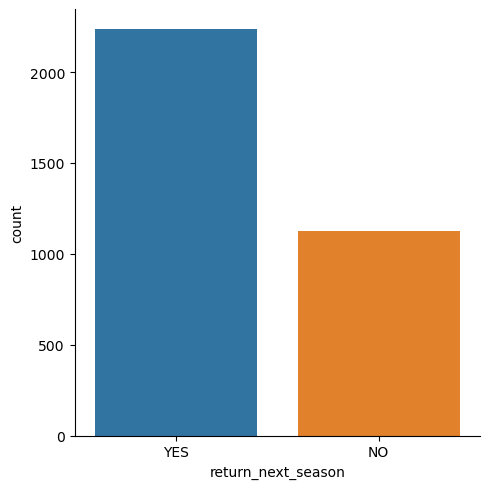

In [529]:
# Do they return the next season
sns.catplot(data = df_athletics, x = 'return_next_season', kind= 'count')
plt.show()

## Continuous Variables

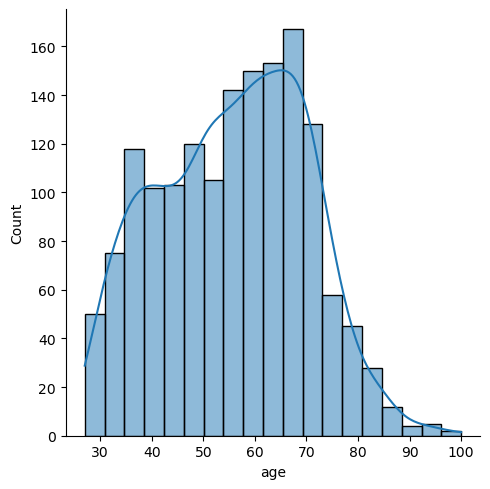

In [530]:
# Age of the person purchasing the ticket
sns.displot(data = df_athletics, x ='age', kind = 'hist', kde =True)
plt.show()

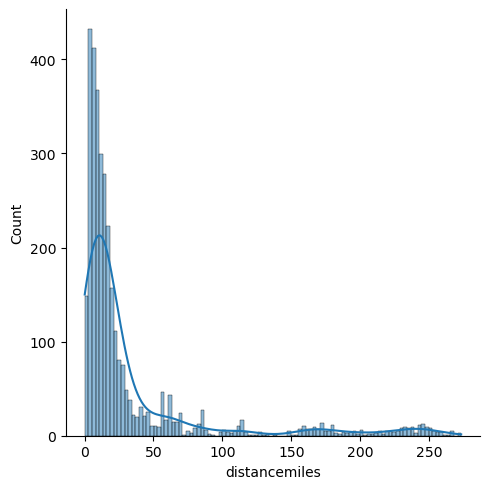

In [531]:
# Distance(miles) from the stadium
sns.displot(data = df_athletics, x = 'distancemiles', kind = 'hist', kde = True)
plt.show()

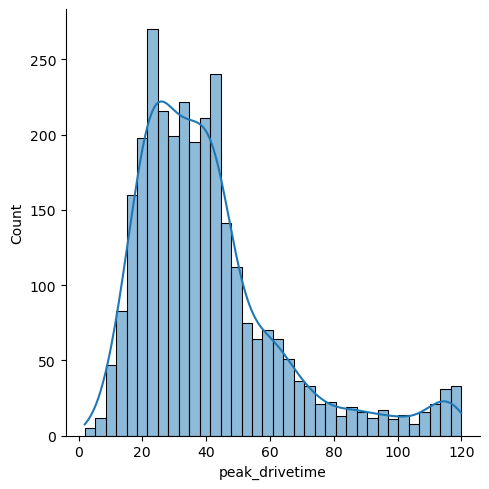

In [532]:
# Drive time in peak hours
sns.displot(data = df_athletics, x = 'peak_drivetime', kind = 'hist', kde = True)
plt.show()

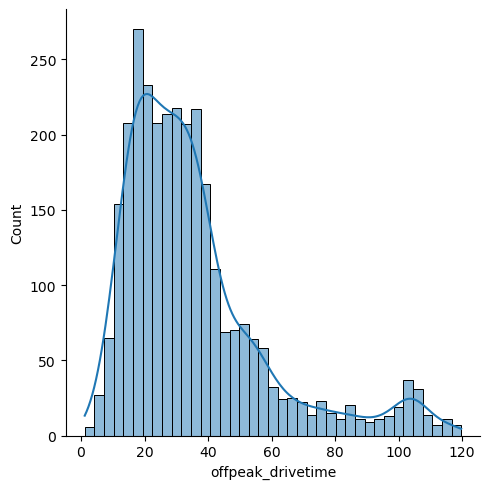

In [533]:
# Drive time in off-peak hours
sns.displot(data = df_athletics, x = 'offpeak_drivetime', kind = 'hist', kde = True)
plt.show()

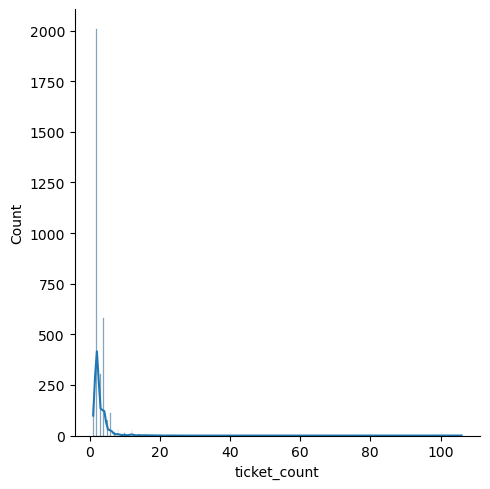

In [534]:
# Number of tickets that were purchased 
sns.displot(data = df_athletics, x = 'ticket_count', kind = 'hist', kde = True)
plt.show()

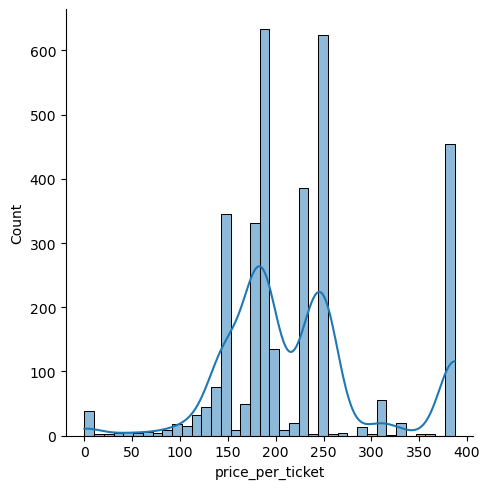

In [535]:
# Price per ticket 
sns.displot(data = df_athletics, x = 'price_per_ticket', kind = 'hist', kde = True)
plt.show()

## Relationships between continous variables

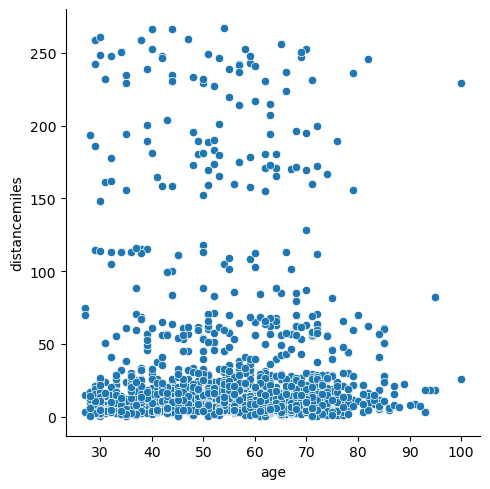

In [536]:
sns.relplot(data = df_athletics, x='age', y='distancemiles')
plt.show()

This scatterplot shows that even though there are plenty of ticket holders in most age ranges, there seems to be majority in the 30 to 70 year old range. There is no significant trend to show that younger or older people travel more to come to the game, but it seems that majority people travel within a shorter distance. 

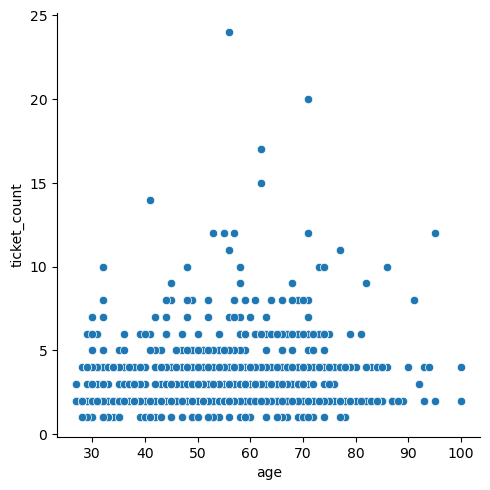

In [537]:
sns.relplot(data = df_athletics, x='age', y='ticket_count')
plt.show()

This shows that majority of the tickethodlers purchase somewhere between 1 to 5 tickets, regardless of what their age may be. There is no signifcant trend between age and the number of tickets they purchased as it seems relatively even other than some outliers.

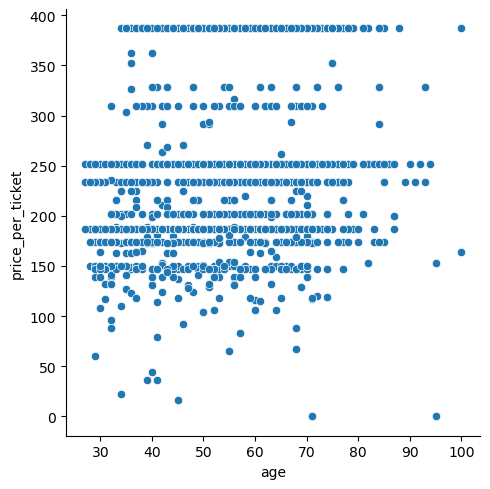

In [538]:
sns.relplot(data = df_athletics, x='age', y='price_per_ticket')
plt.show()

It seems that ticket purchases are more influenced by price rather than age of the purchaser. There seems to be common purchased price levels around 150 to 250 regardless of age, and the 400 price tickets seem to be purchased by 35+ aged people. 

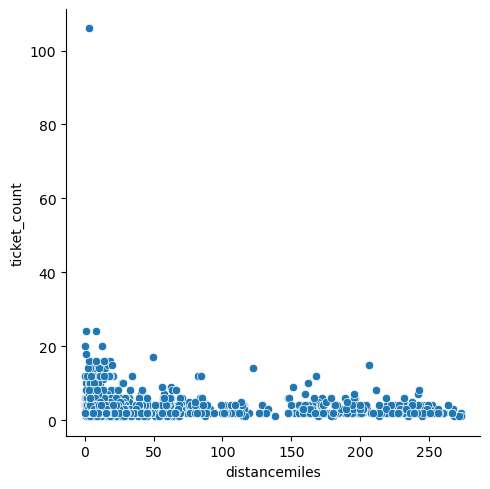

In [539]:
sns.relplot(data = df_athletics, x='distancemiles', y='ticket_count')
plt.show()

Most ticket holders travel shorter distances, under 50 miles, to purchase a smaller amount of tickets (under 10). There are some people who traveled more and bought a larger amount of tickets, but it is not significant. But therer are some outliers, like the person that bought over a 100 tickets within a shorter distance, which could be for a special event where they needed bulk tickets.

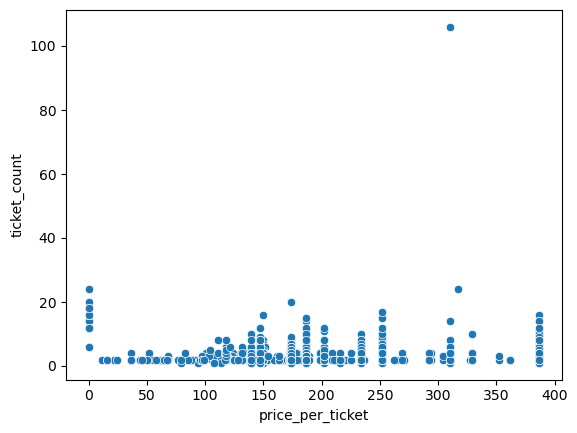

In [540]:
fig, ax = plt.subplots()
sns.scatterplot(data=df_athletics, x='price_per_ticket', y='ticket_count', ax=ax)
plt.show()

Majority of tickets are purchased within the 150 to 250 range, where ticket purchasers are also purchasing up to 20 tickets ( but majority seems to be within 5 tickets). 

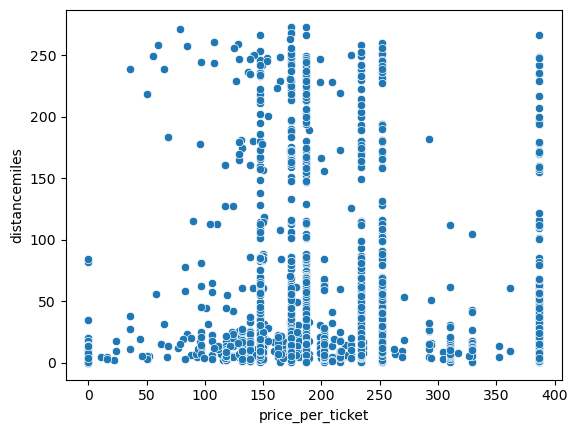

In [541]:
fig, ax = plt.subplots()
sns.scatterplot(data=df_athletics, x='price_per_ticket', y='distancemiles', ax=ax)
plt.show()

Most of tickets were purchased under 50 miles and when the tickets were priced around the 150-250 range. There isn't a significant trend which show that people travel any distance regardless of price. 

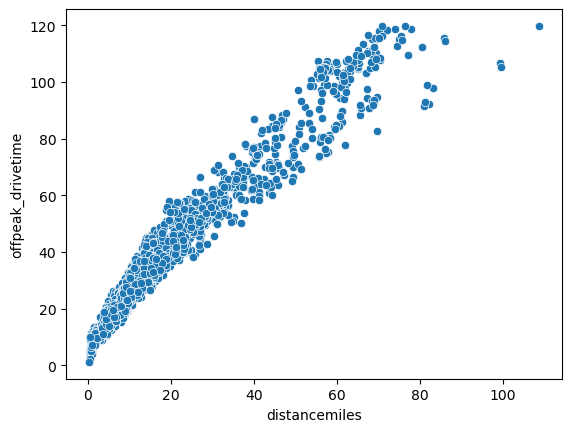

In [542]:
fig, ax = plt.subplots()
sns.scatterplot(data=df_athletics, x='distancemiles', y='offpeak_drivetime', ax=ax)
plt.show()

The dense clustering and strong linear relationship show a positive relationship between distance miles and offpeak drive time, which tells us that as distnace increases so does the off peak drive time (which makes sense given the variables).

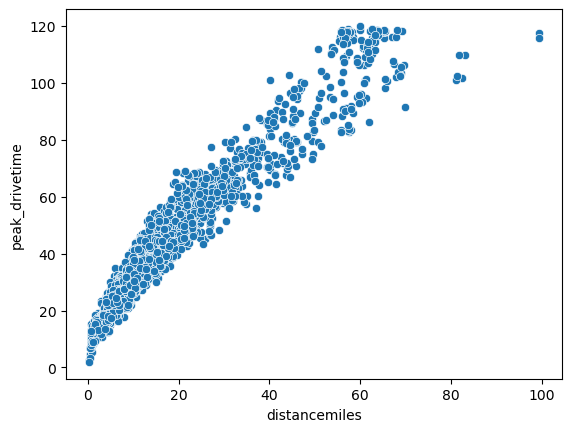

In [543]:
fig, ax = plt.subplots()
sns.scatterplot(data=df_athletics, x='distancemiles', y='peak_drivetime', ax=ax)
plt.show()

Similar to the previous off peak drive time plot, there is a positive correlation between these variables. The slope of the scatterplot could be slightly steeper due to traffic conditions during peak time compared to the offpeak time plot. 

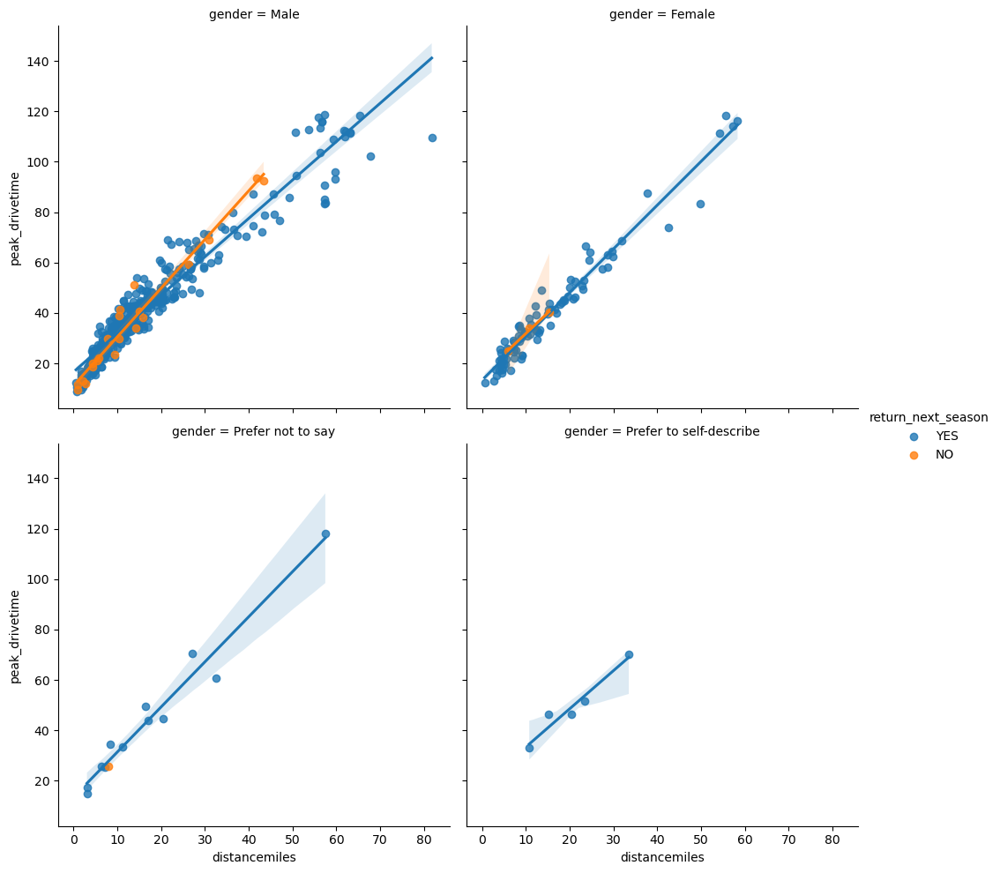

In [544]:
sns.lmplot(data = df_athletics, x = 'distancemiles', y = 'peak_drivetime', hue = 'return_next_season',  
           col = 'gender',
           col_wrap = 2)
plt.show()

The variability in drive time seems to be slighlty more for males, especially when driving longer distances, but with females, it seems to be more consistent. The return next season does not seem to have a significant impact on travel for each gender. 

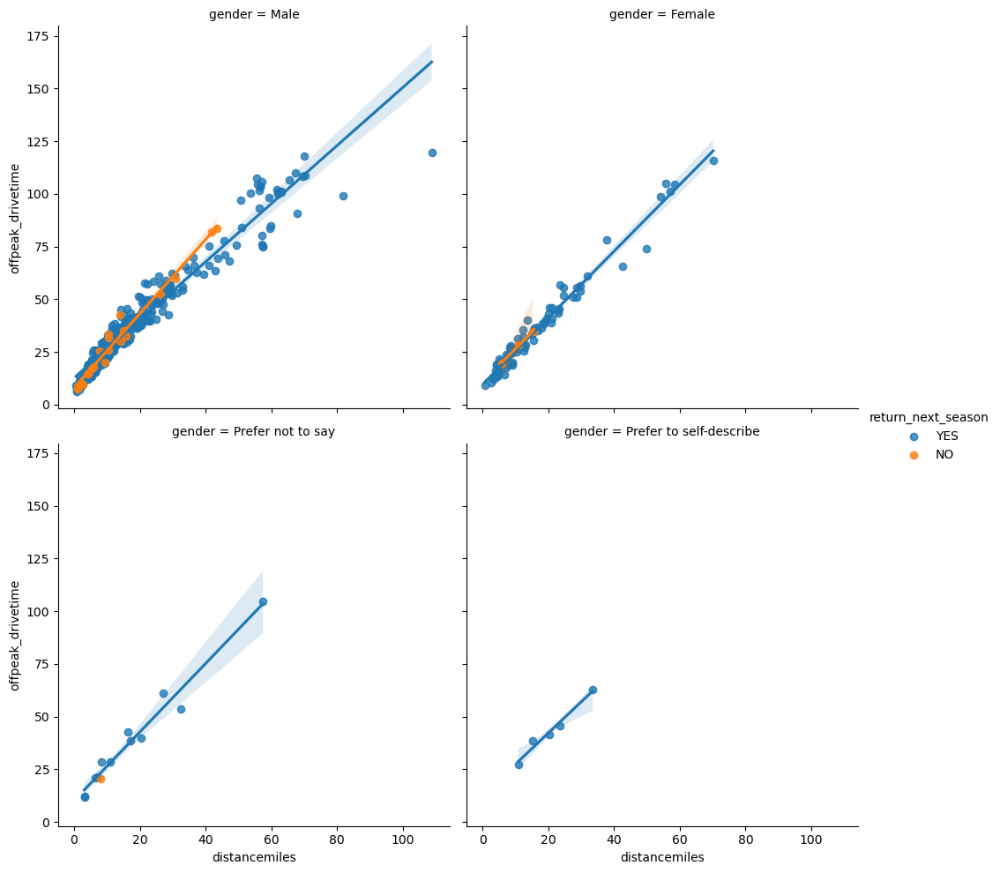

In [545]:
sns.lmplot(data = df_athletics, x = 'distancemiles', y = 'offpeak_drivetime', hue = 'return_next_season',  
           col = 'gender',
           col_wrap = 2)
plt.show()

This plot is similar to the peak drive time plot above, in terms of significance. 

## Continuous variables grouped by Categorical variables 

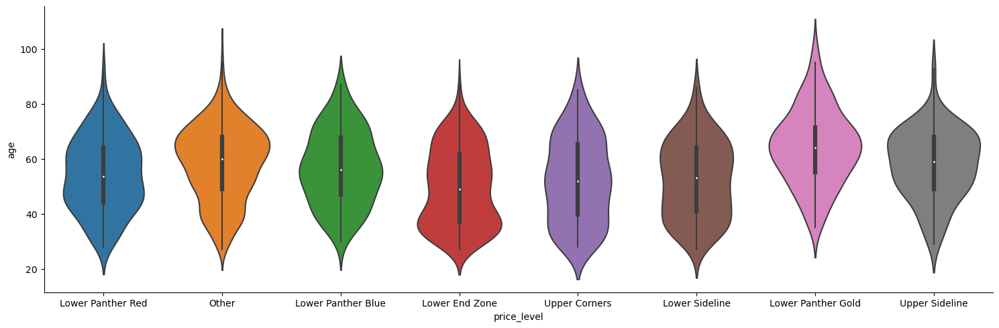

In [546]:
sns.catplot(data = df_athletics, x = 'price_level', y = 'age', kind = 'violin', aspect = 3 )
plt.show()

This shows that there is variability of age across different price levels but it seems the majority of ticketholders are middle aged (40 to 60 years). The sections with more variability in age may be famiy sections or priced in a way that attracts people of various ages. 

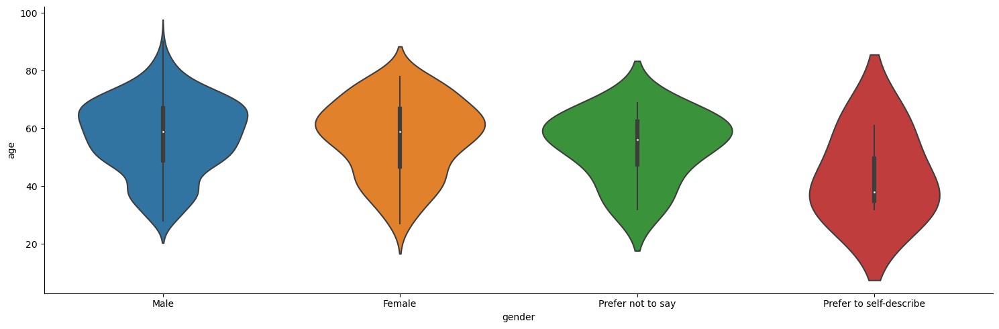

In [547]:
sns.catplot(data = df_athletics, x = 'gender', y = 'age', kind = 'violin', aspect = 3 )
plt.show()

The distribution is still relatively consistent as most seem to be middle aged, but the prefer not say/self describe seems to show more variability possibly because the sample sizes for those sections are smaller.  

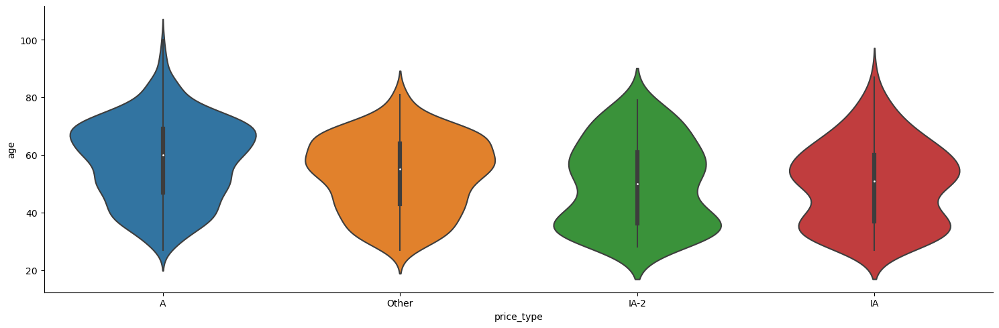

In [548]:
sns.catplot(data = df_athletics, x = 'price_type', y = 'age', kind = 'violin', aspect = 3 )
plt.show()

The IA-2 and IA categories have more variability, which shows there is more various age ranges purchasing those types of tickets.

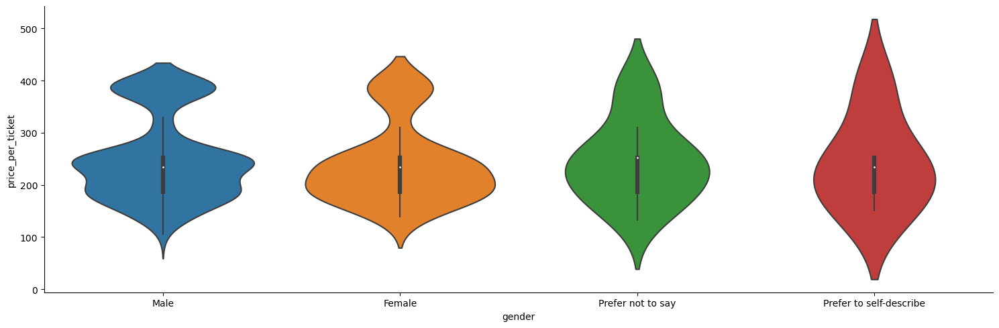

In [549]:
sns.catplot(data = df_athletics, x = 'gender', y = 'price_per_ticket', kind = 'violin', aspect = 3 )
plt.show()

Majority of ticket prices are around 150 to 300 but the prefer not to say/self describe seem to purchase a more broad spectrum of tickets.

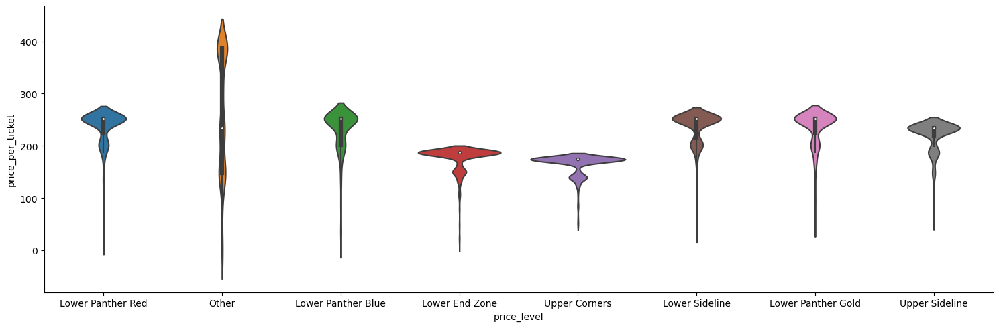

In [550]:
sns.catplot(data = df_athletics, x = 'price_level', y = 'price_per_ticket', kind = 'violin', aspect = 3 )
plt.show()

The categories with narrower distributions might mean that there is more consistent pricng per ticket. 

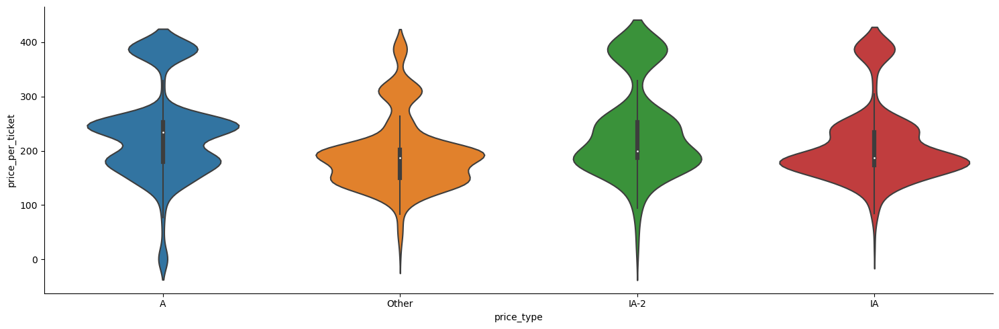

In [551]:
sns.catplot(data = df_athletics, x = 'price_type', y = 'price_per_ticket', kind = 'violin', aspect = 3 )
plt.show()

The ticket prices seem consistent with the price type, but the other seems to have more variability. 

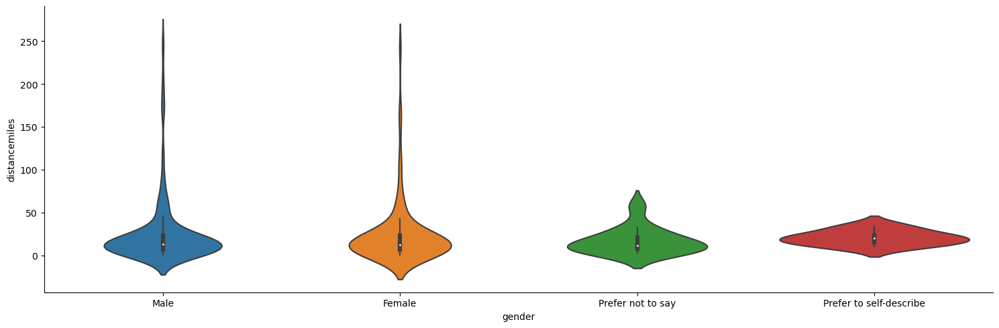

In [552]:
sns.catplot(data = df_athletics, x = 'gender', y = 'distancemiles', kind = 'violin', aspect = 3 )
plt.show()

This shows that most ticket holders, regardless of what they identify as, seem to travel within 0-50 miles. 

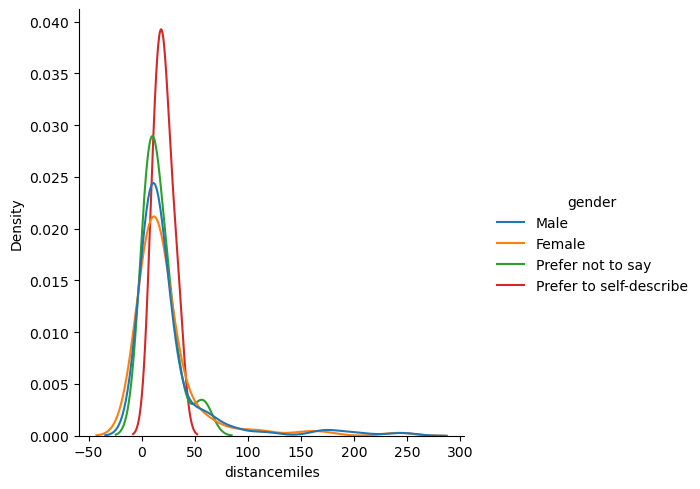

In [553]:
sns.displot(data=df_athletics, x='distancemiles', 
            hue='gender', 
            kind='kde',
           common_norm=False,)
plt.show()

Most ticket holders, regardless of gender, will travel within 0 to 50 miles.For the plots below, we will also see that regardless of other variables, most people will travel 0 to 50 miles. 

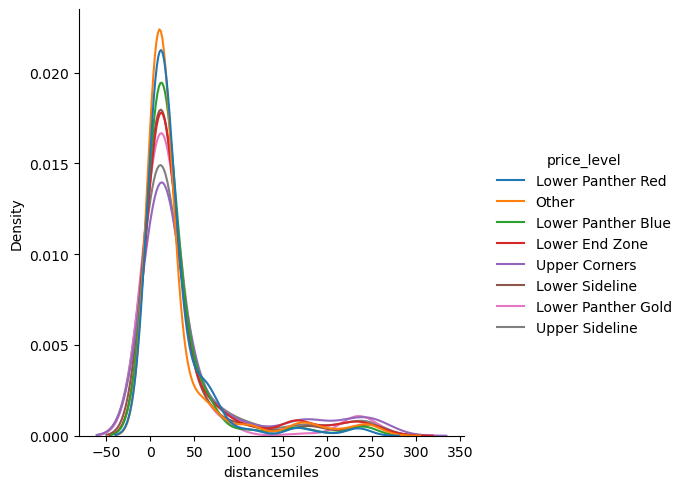

In [554]:
sns.displot(data=df_athletics, x='distancemiles', 
            hue='price_level', 
            kind='kde',
           common_norm=False,)
plt.show()

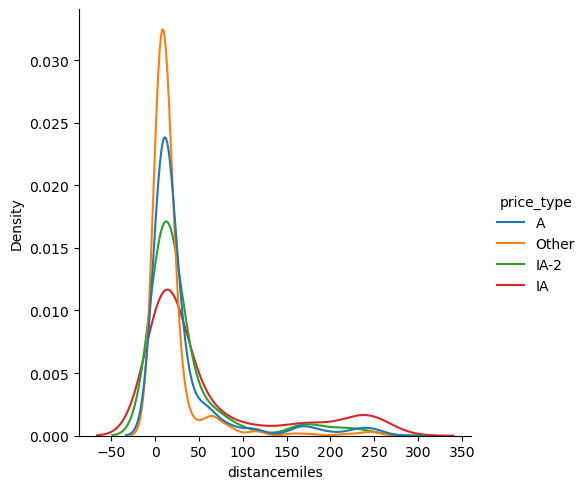

In [555]:
sns.displot(data=df_athletics, x='distancemiles', 
            hue='price_type', 
            kind='kde',
           common_norm=False,)
plt.show()

/var/folders/0s/1gm6wwmn4qv90l94w2tk8fwh0000gn/T/ipykernel_40875/1862966374.py:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(data=df_athletics, x='price_per_ticket',


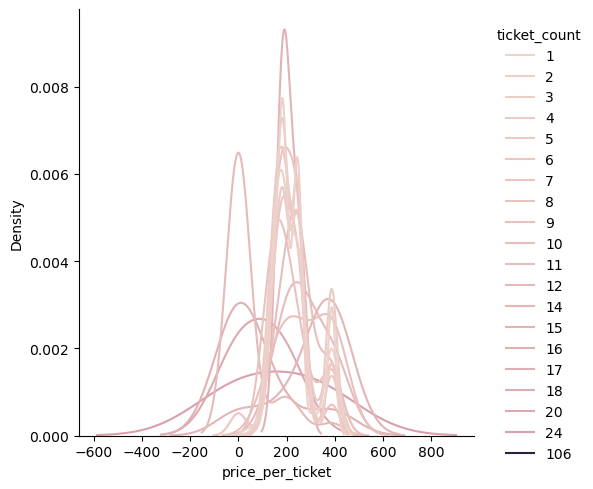

In [556]:
sns.displot(data=df_athletics, x='price_per_ticket', 
            hue='ticket_count', 
            kind='kde',
           common_norm=False,)
plt.show()

Most ticket purchases, regardless of how many tickets are being bought, seem to be bought around the $200 range, as will also be shown in some plots below. 

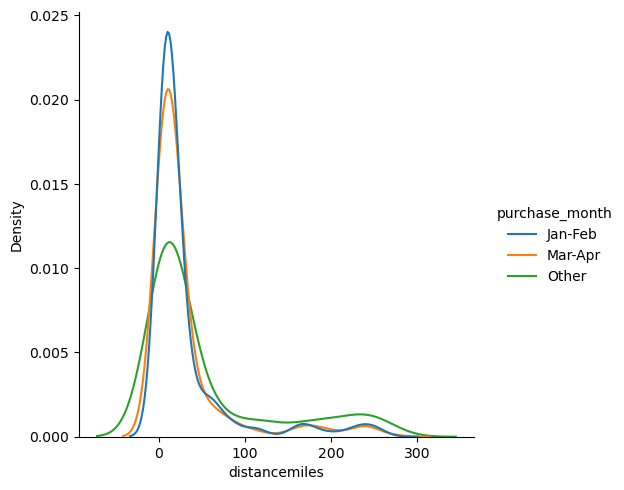

In [557]:
sns.displot(data=df_athletics, x='distancemiles', 
            hue='purchase_month', 
            kind='kde',
           common_norm=False,)
plt.show()

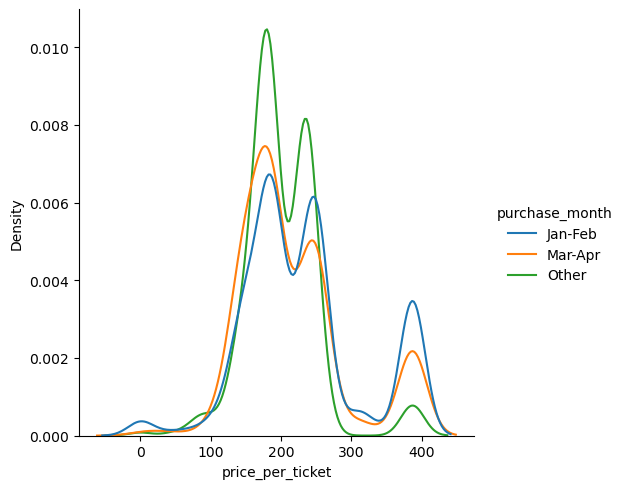

In [558]:
sns.displot(data=df_athletics, x='price_per_ticket', 
            hue='purchase_month', 
            kind='kde',
           common_norm=False,)
plt.show()

I will also use `boxplots` to look at how the continuous variable is distributed and it can good a good indication to the variablity of the data.

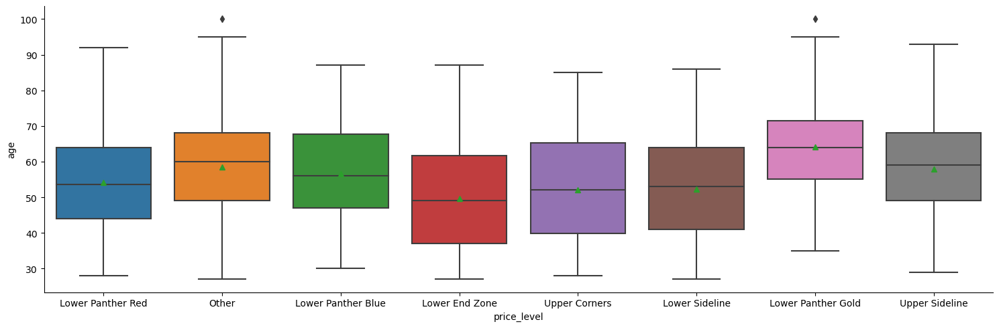

In [559]:
sns.catplot(data=df_athletics, x='price_level', y='age', kind='box',
           showmeans=True, aspect=3)
plt.show()

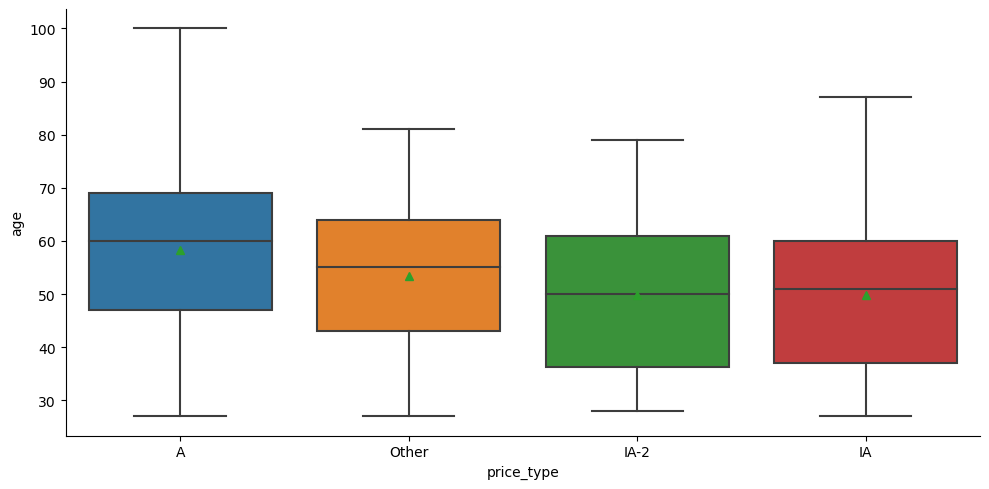

In [560]:
sns.catplot(data=df_athletics, x='price_type', y='age', kind='box',
           showmeans=True, aspect=2)
plt.show()

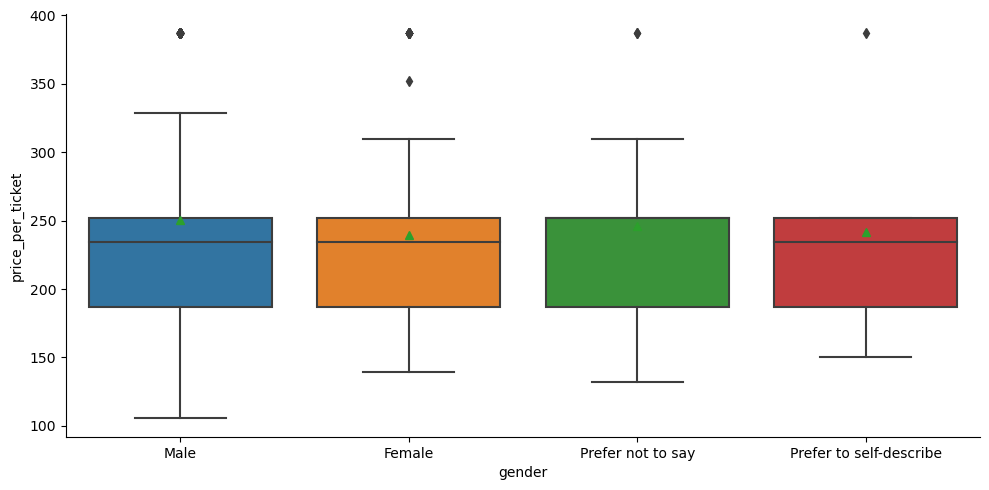

In [561]:
sns.catplot(data=df_athletics, x='gender', y='price_per_ticket', kind='box',
           showmeans=True, aspect=2)
plt.show()

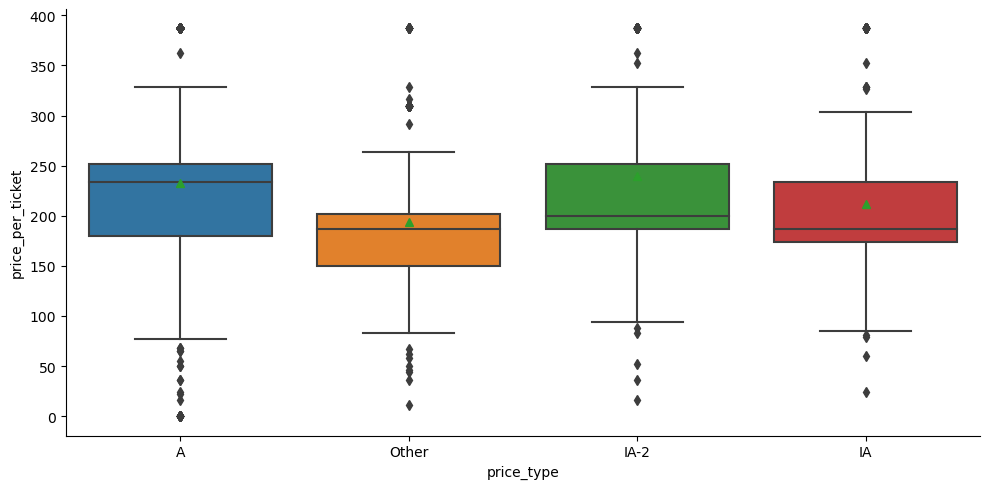

In [562]:
sns.catplot(data=df_athletics, x='price_type', y='price_per_ticket', kind='box',
           showmeans=True, aspect=2)
plt.show()

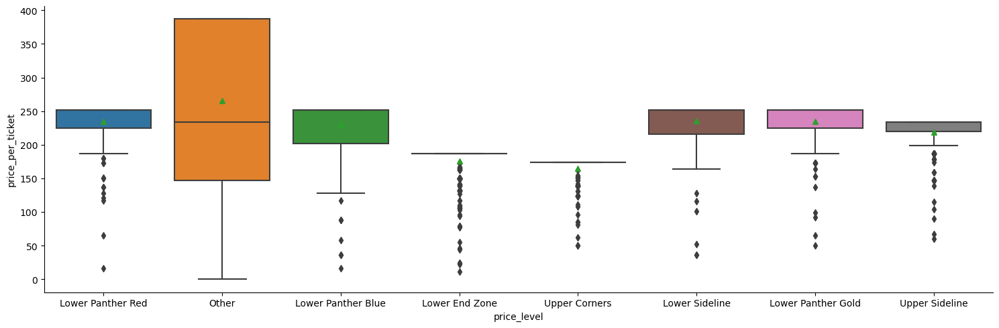

In [563]:
sns.catplot(data=df_athletics, x='price_level', y='price_per_ticket', kind='box',
           showmeans=True, aspect=3)
plt.show()

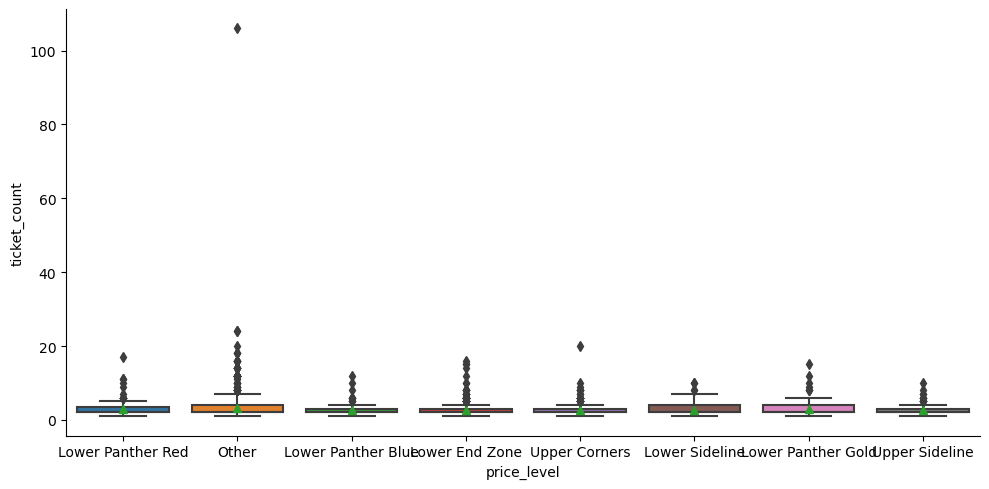

In [564]:
sns.catplot(data=df_athletics, x='price_level', y='ticket_count', kind='box',
           showmeans=True, aspect=2)
plt.show()

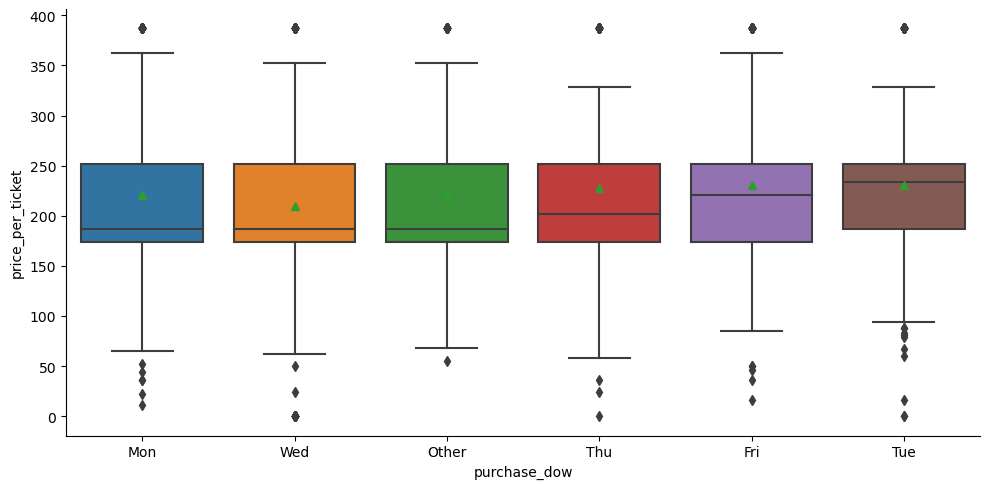

In [565]:
sns.catplot(data=df_athletics, x='purchase_dow', y='price_per_ticket', kind='box',
           showmeans=True, aspect=2)
plt.show()

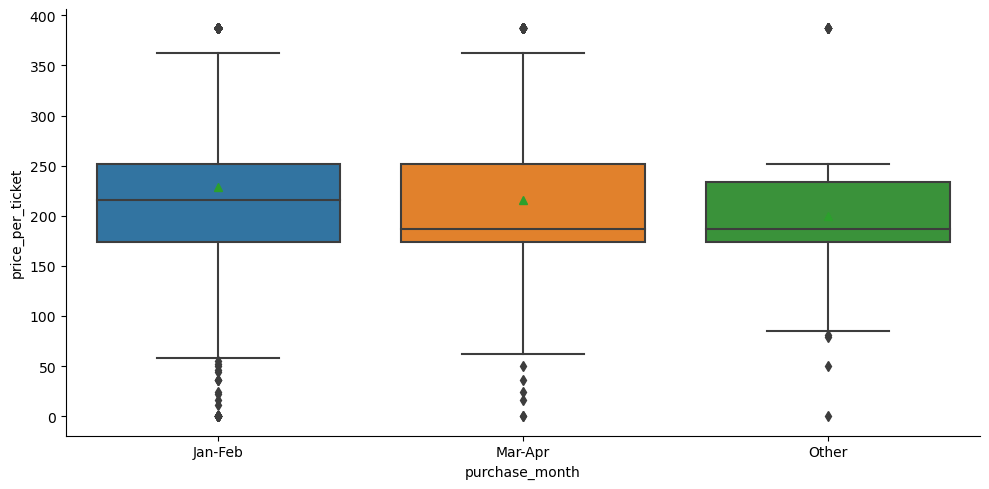

In [566]:
sns.catplot(data=df_athletics, x='purchase_month', y='price_per_ticket', kind='box',
           showmeans=True, aspect=2)
plt.show()

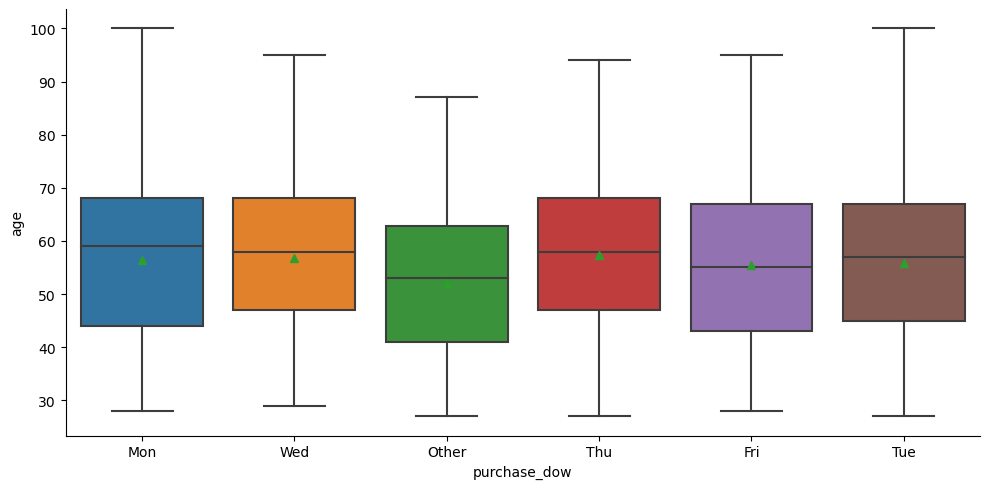

In [567]:
sns.catplot(data=df_athletics, x='purchase_dow', y='age', kind='box',
           showmeans=True, aspect=2)
plt.show()

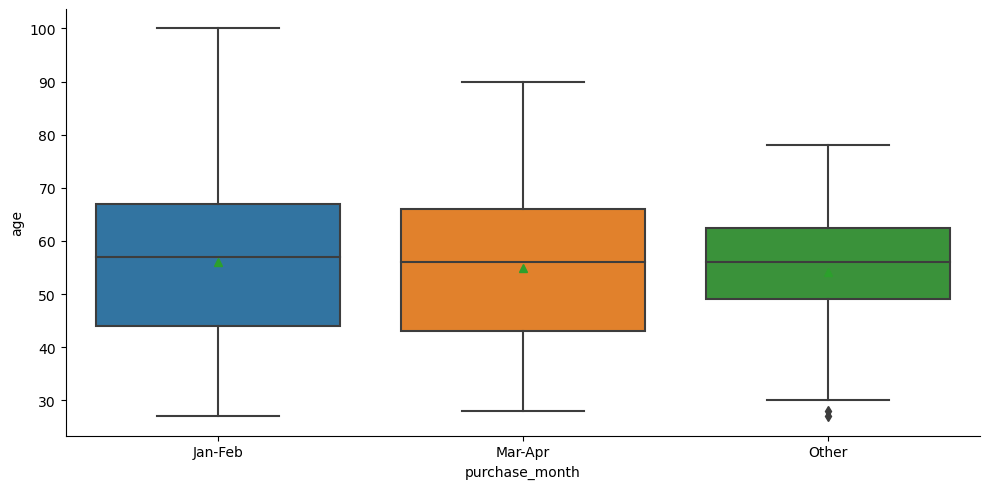

In [568]:
sns.catplot(data=df_athletics, x='purchase_month', y='age', kind='box',
           showmeans=True, aspect=2)
plt.show()

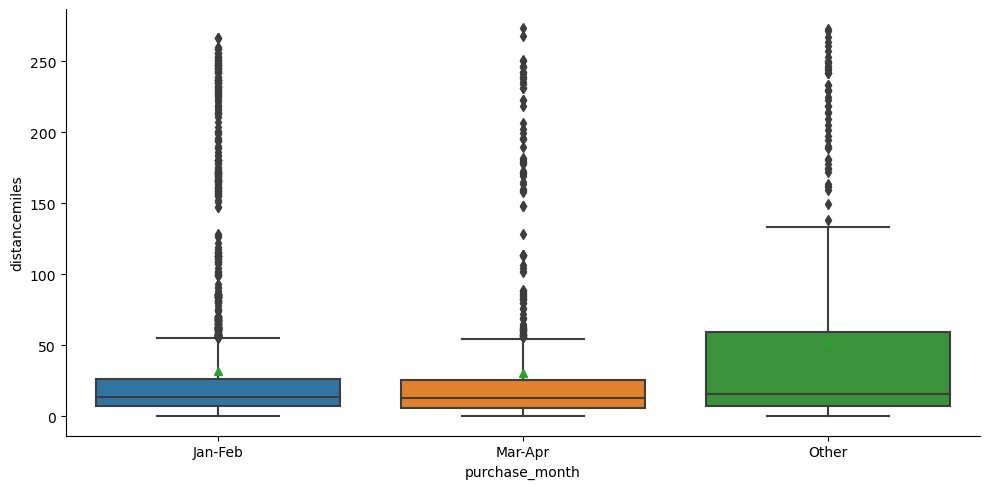

In [569]:
sns.catplot(data=df_athletics, x='purchase_month', y='distancemiles', kind='box',
           showmeans=True, aspect=2)
plt.show()

## We can also visualize categorical variables impact
### How variables like gender & return_next_season, direction & return_next_season, price_level & return_next_season, price_type & return_next_season affect each other

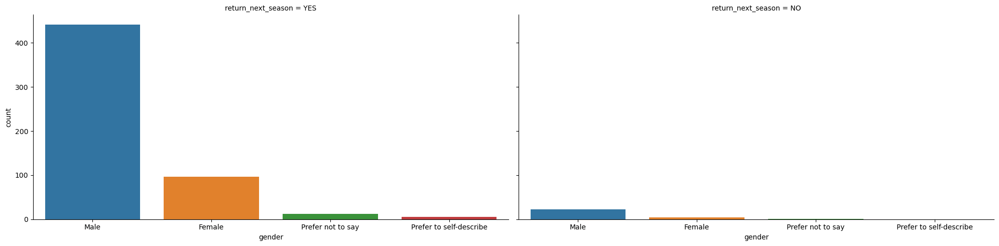

In [570]:
# Looking at how gender affects buying next year's season tickets
sns.catplot(data = df_athletics, x= 'gender', col= 'return_next_season', kind='count', aspect = 2)
plt.show()

There is a much higher proprotion of males over other genders that are returning next season.

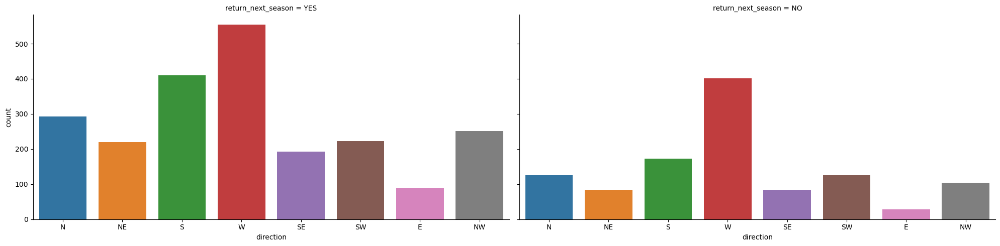

In [571]:
# Looking at how direction away from stadium affects buying next year's season tickets
sns.catplot(data = df_athletics, x= 'direction', col= 'return_next_season', kind='count', aspect = 2)
plt.show()

People that are coming in from the West are buying more tickets for next season. But there are also a lot of people coming in from the WEst that are not buying tickets ,so maybe more people live West of the stadium. 

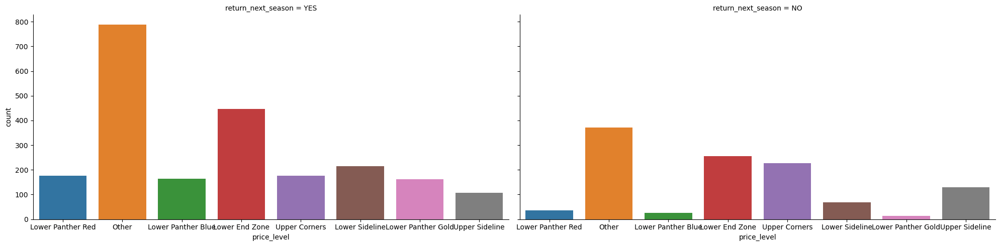

In [572]:
# Looking at how price level of the ticket affects buying next year's season tickets
sns.catplot(data = df_athletics, x= 'price_level', col= 'return_next_season', kind='count', aspect = 2)
plt.show()

The other on the price levels seem to be high for both people that are returning next season and not returning. The upper corners that are not returning next season are a bit higher when compared to other price levels vs the upper corners that are returning next season. Maybe the upper corners were not preferential when choosing to repurchase a ticket. 

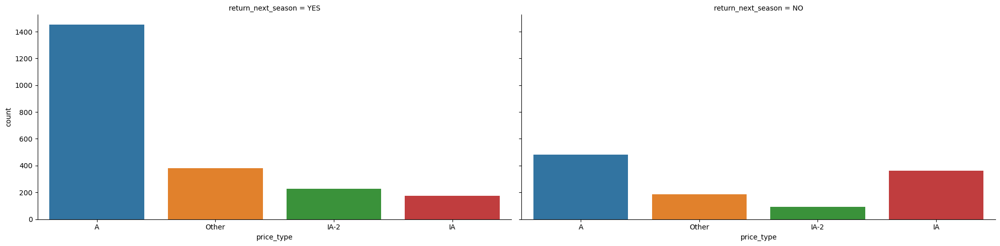

In [573]:
# Looking at how price type of the tickets affects buying next year's season tickets
sns.catplot(data = df_athletics, x= 'price_type', col= 'return_next_season', kind='count', aspect = 2)
plt.show()

The price type A is mostly returning next season. But more of the IA is not returning next season compared to those that are returning- maybe the IA price type is not preferential when choosing to buy another seasons ticket pass.

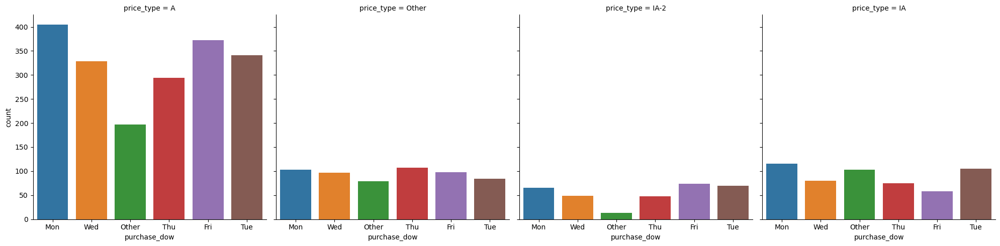

In [574]:
# Looking at how the day of the week the ticket was purchased affects buying next year's season tickets
sns.catplot(data = df_athletics, x = 'purchase_dow', col = 'price_type', kind = 'count')
plt.show()

In general, it seems that Monday seems to be a popular day to buy tickets, but there is no other significant trend that shows us anything.

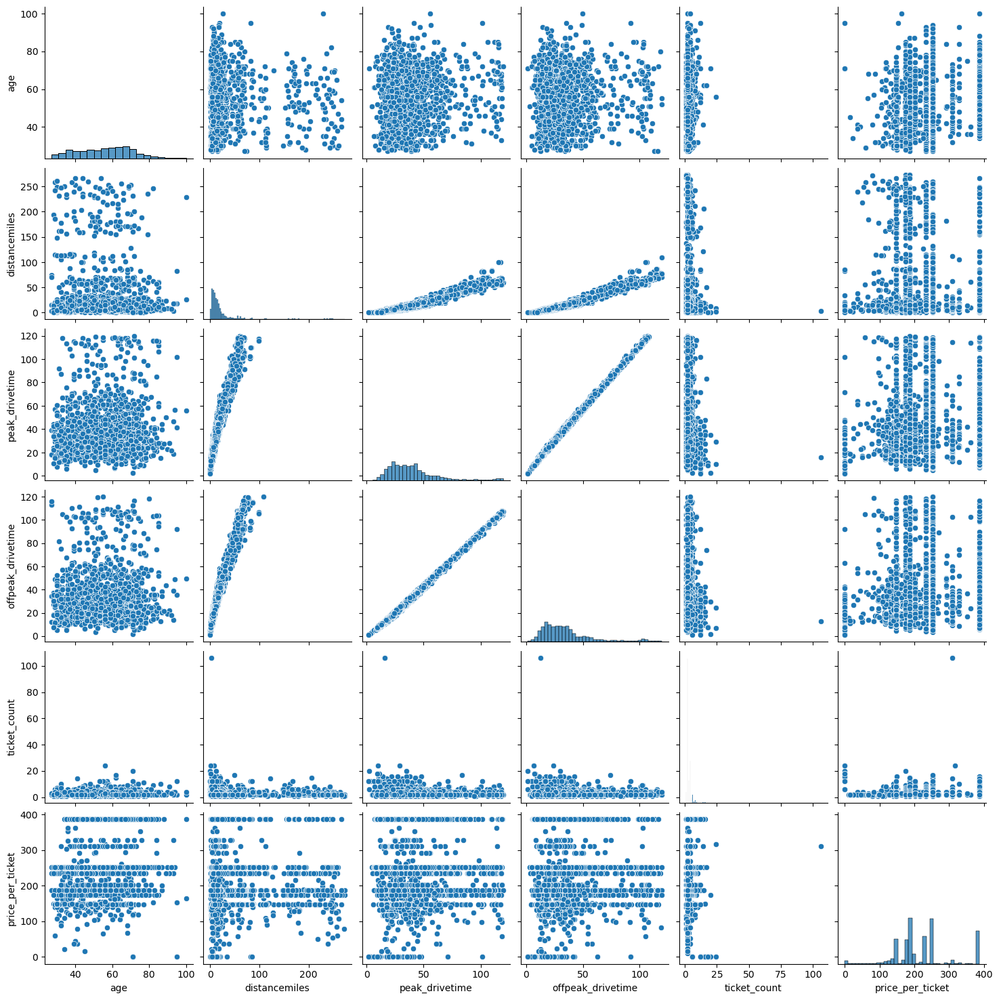

In [575]:
# We can also compare between the categorical variables using a pair plot to get a better pattern understanding
sns.pairplot(data= df_athletics, vars=['age', 'distancemiles', 'peak_drivetime', 'offpeak_drivetime', 'ticket_count', 'price_per_ticket'])
plt.show()

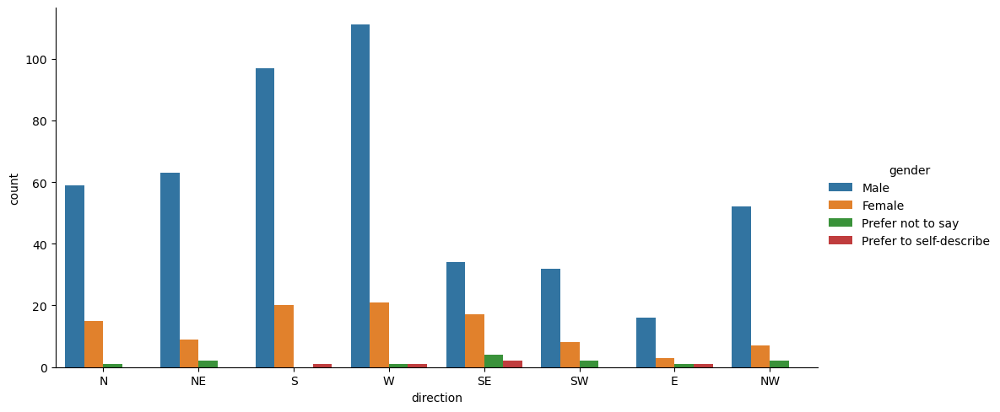

In [576]:
sns.catplot(data = df_athletics, x = 'direction', hue = 'gender', kind = 'count', aspect=2)
plt.show()

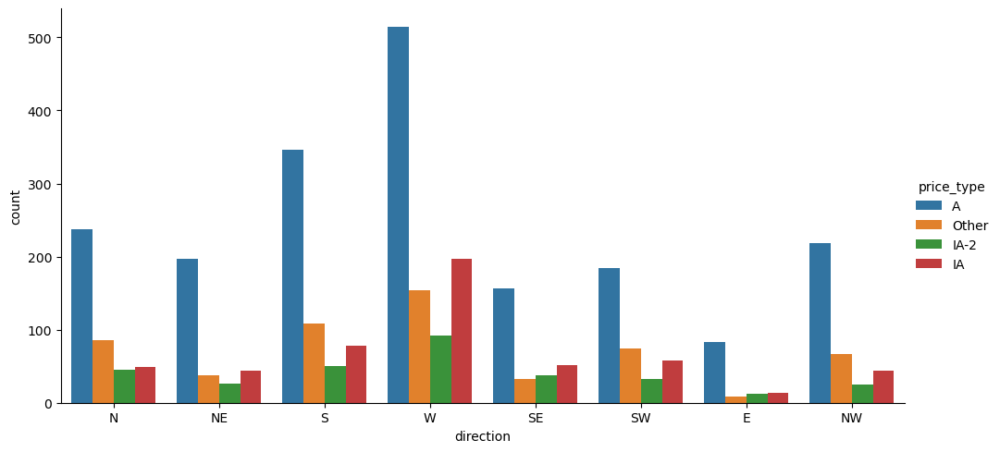

In [577]:
sns.catplot(data = df_athletics, x = 'direction', hue = 'price_type', kind = 'count', aspect=2)
plt.show()

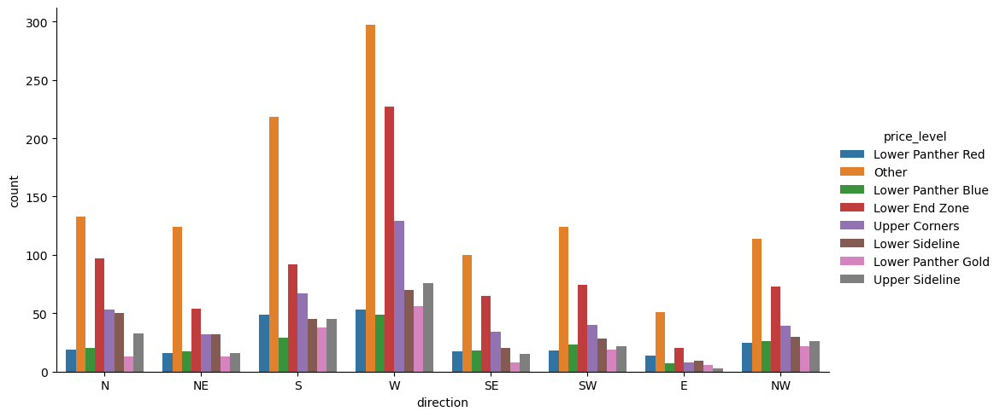

In [578]:
sns.catplot( data = df_athletics, x='direction', hue='price_level', kind='count', aspect = 2 )
plt.show()

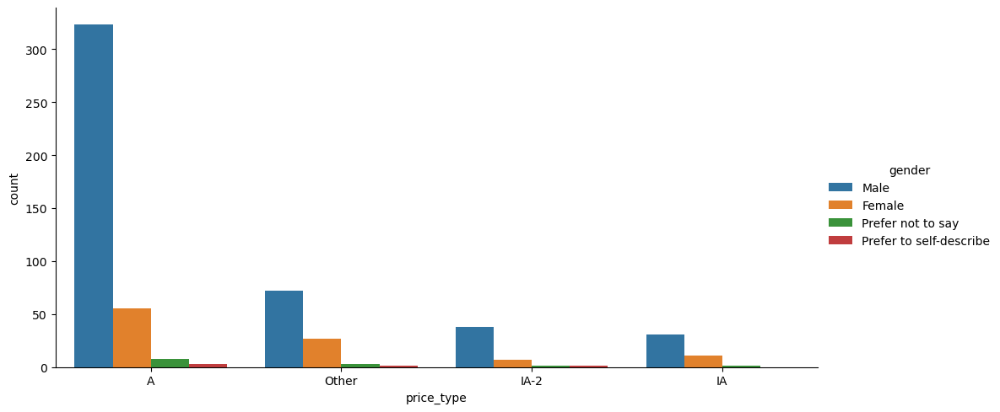

In [579]:
sns.catplot( data = df_athletics, x='price_type', hue='gender', kind='count', aspect=2 )
plt.show()

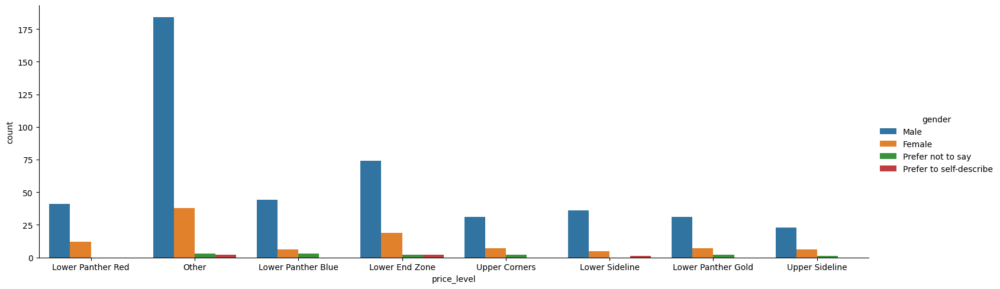

In [580]:
sns.catplot( data = df_athletics, x='price_level', hue='gender', kind='count',aspect=3 )
plt.show()

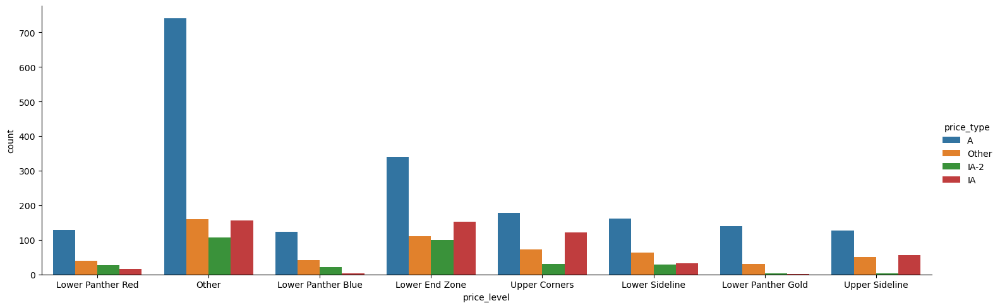

In [581]:
sns.catplot( data = df_athletics, x='price_level', hue='price_type', kind='count' , aspect = 3)
plt.show()

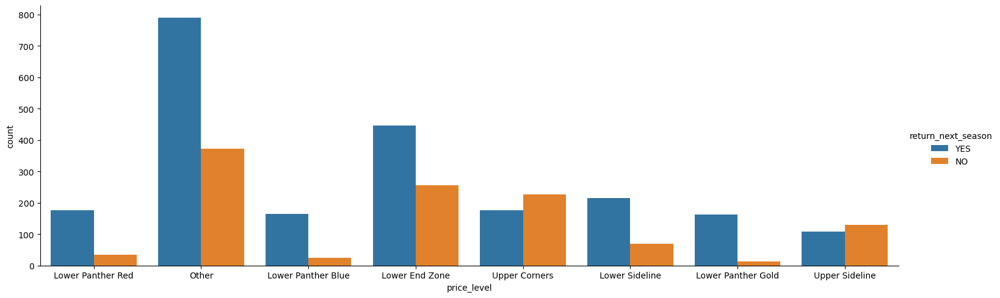

In [582]:
sns.catplot( data = df_athletics, x='price_level', hue='return_next_season', kind='count' , aspect =3)
plt.show()

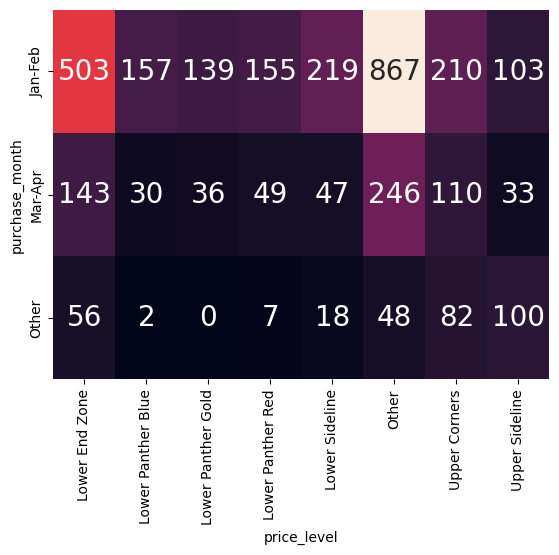

In [583]:
fig, ax = plt.subplots()
sns.heatmap( pd.crosstab( df_athletics.purchase_month, df_athletics.price_level ), ax = ax,
             annot=True, annot_kws={'fontsize': 20}, fmt='d',
             cbar=False)
plt.show()

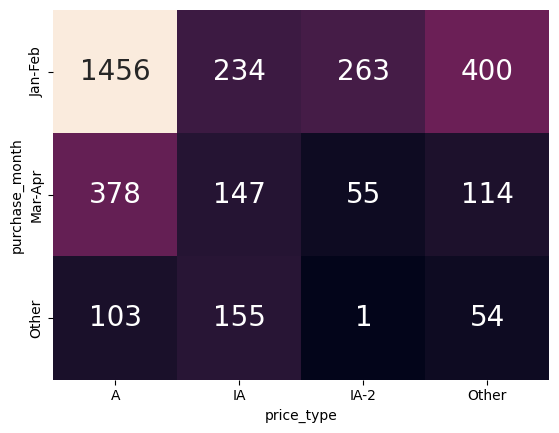

In [584]:
fig, ax = plt.subplots()
sns.heatmap( pd.crosstab( df_athletics.purchase_month, df_athletics.price_type), ax = ax,
             annot=True, annot_kws={'fontsize': 20}, fmt='d',
             cbar=False)
plt.show()

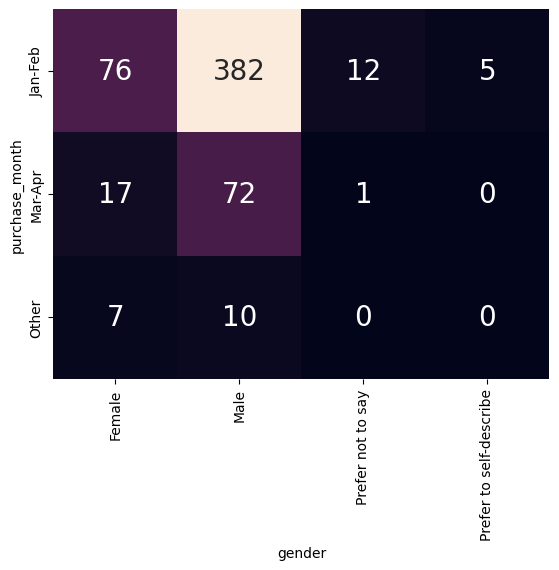

In [585]:
fig, ax = plt.subplots()
sns.heatmap( pd.crosstab( df_athletics.purchase_month, df_athletics.gender), ax = ax,
             annot=True, annot_kws={'fontsize': 20}, fmt='d',
             cbar=False)
plt.show()

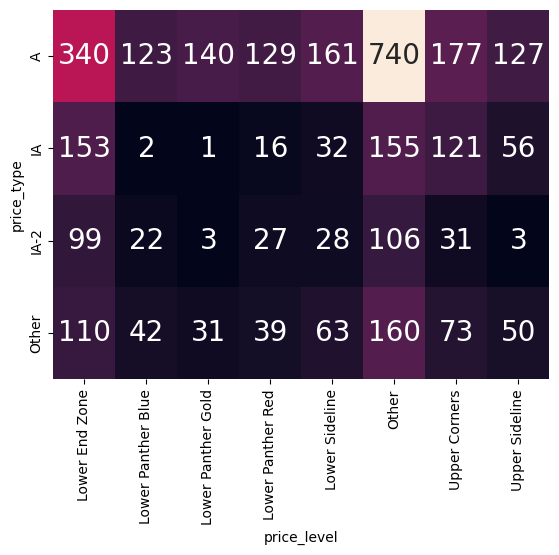

In [586]:
fig, ax = plt.subplots()
sns.heatmap( pd.crosstab( df_athletics.price_type, df_athletics.price_level), ax = ax,
             annot=True, annot_kws={'fontsize': 20}, fmt='d',
             cbar=False)
plt.show()

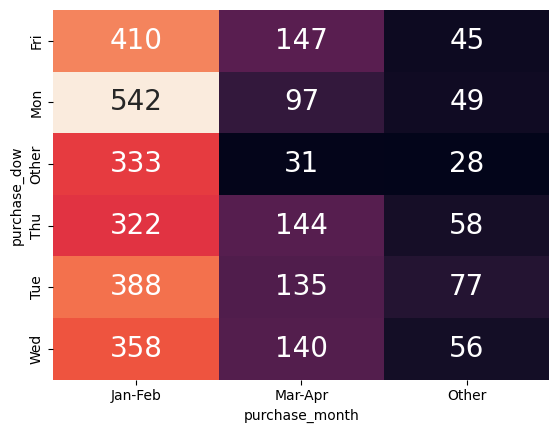

In [587]:
fig, ax = plt.subplots()
sns.heatmap( pd.crosstab( df_athletics.purchase_dow, df_athletics.purchase_month), ax = ax,
             annot=True, annot_kws={'fontsize': 20}, fmt='d',
             cbar=False)
plt.show()

## Visualizing relationships between continuous inputs broken up by outcome unique values
#### We need to transform the DataFrame from a wide plot to a long plot to plot multiple variables

In [588]:
df_long = df_athletics.melt(id_vars=['return_next_season'], 
                            value_vars=['distancemiles', 'age', 'price_per_ticket', 'ticket_count'], 
                            var_name='variable', 
                            value_name='value')

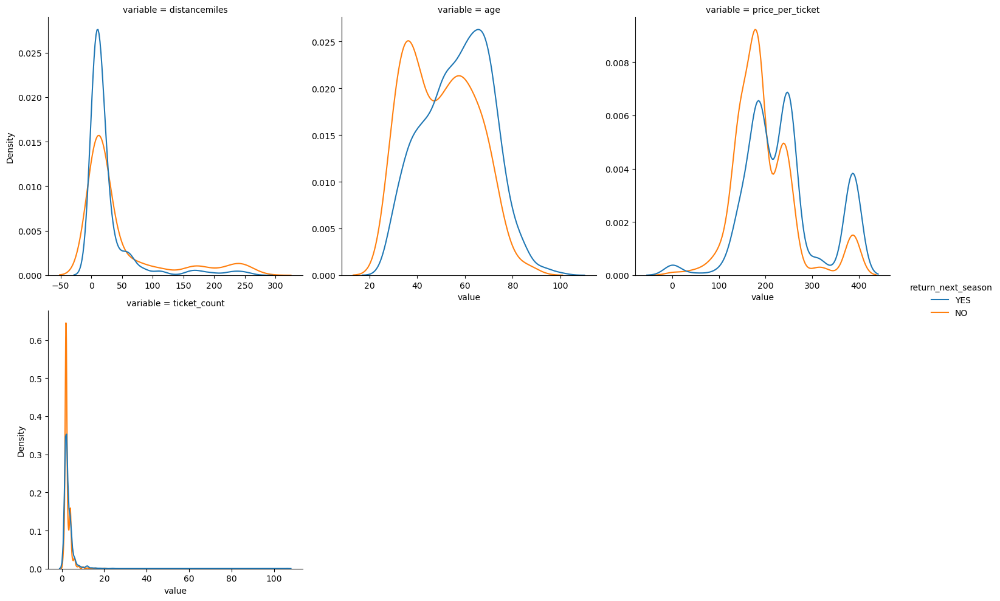

In [589]:
sns.displot(data=df_long, x='value', col='variable', kind='kde', hue='return_next_season', col_wrap=3,
           facet_kws={'sharex': False, 'sharey': False}, common_norm=False)
plt.show()

This shows us more information on our variables - most people drivie within 0-50 miles regardless of renewing season tickets or not, more of the people aged 20 - 60 did not renew their season ticket versus people around 50 - 80 who did, most people bought tickets around 200 regardless of renewing or not, and majority people bought under 10 tickets.

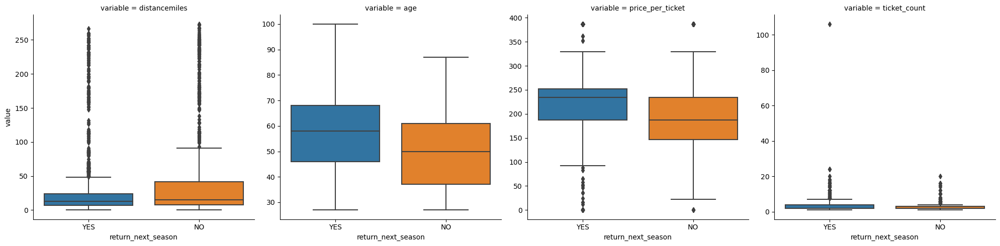

In [590]:
sns.catplot(data=df_long, x='return_next_season', y='value', col='variable', col_wrap=4,
            kind='box',
           sharey=False)

plt.show()

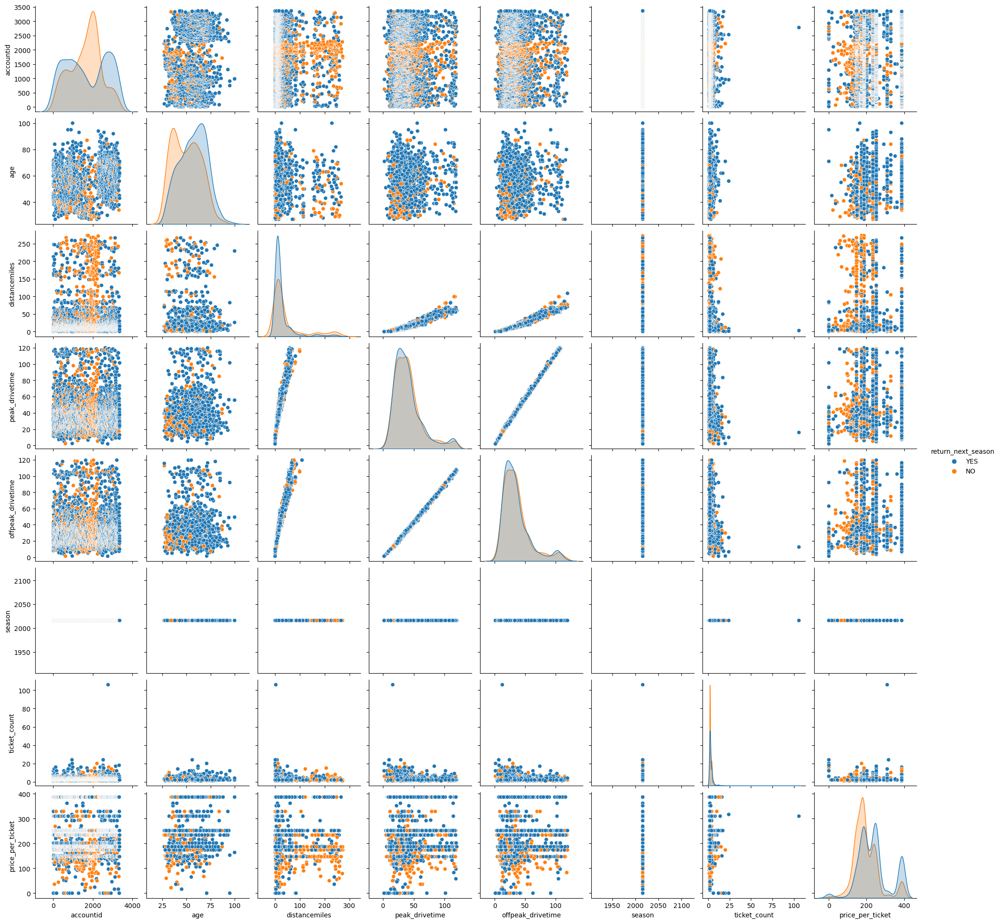

In [591]:
sns.pairplot(data = df_athletics, hue='return_next_season', diag_kws={'common_norm': False})

plt.show()

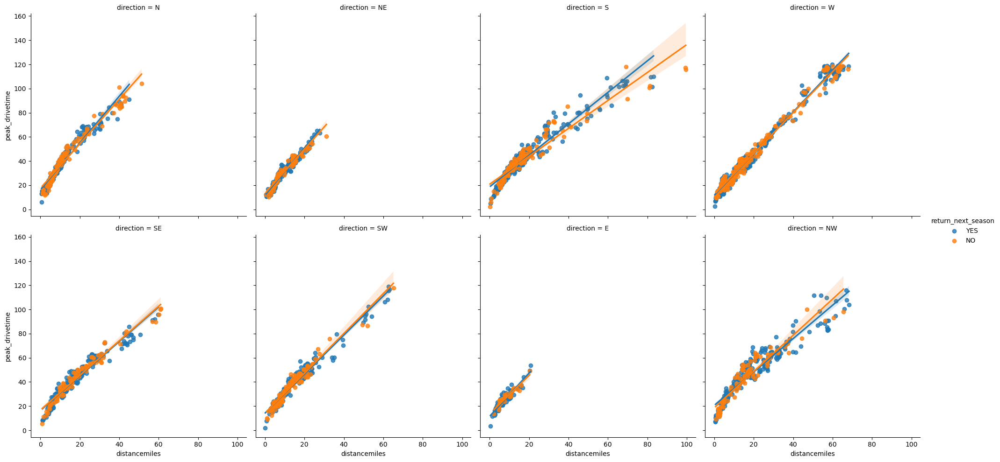

In [592]:
sns.lmplot(data = df_athletics, x='distancemiles', y='peak_drivetime', col='direction', hue='return_next_season', col_wrap=4)

plt.show()

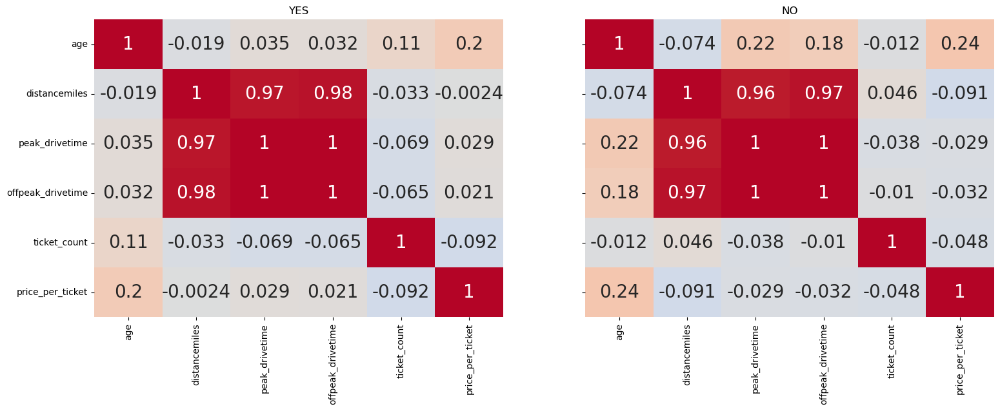

In [593]:
ath_groups= df_athletics.return_next_season.unique().tolist().copy()
corr_per_group = df_athletics.loc[:, ['age', 'distancemiles', 'peak_drivetime', 'offpeak_drivetime', 'ticket_count', 'price_per_ticket', 'return_next_season']].groupby(['return_next_season']).corr()
fig, axs = plt.subplots(1, len(ath_groups), figsize=(18, 6), sharex=True, sharey=True )

for ix in range(len(ath_groups)):
    sns.heatmap( data = corr_per_group.loc[ ath_groups[ ix ] ],
                 vmin=-1, vmax=1, center = 0,
                 cmap='coolwarm', cbar=False,
                 annot=True, annot_kws={'size': 20},
                 ax=axs[ix] )
    
    axs[ ix ].set_title( ath_groups[ ix ] )

plt.show()

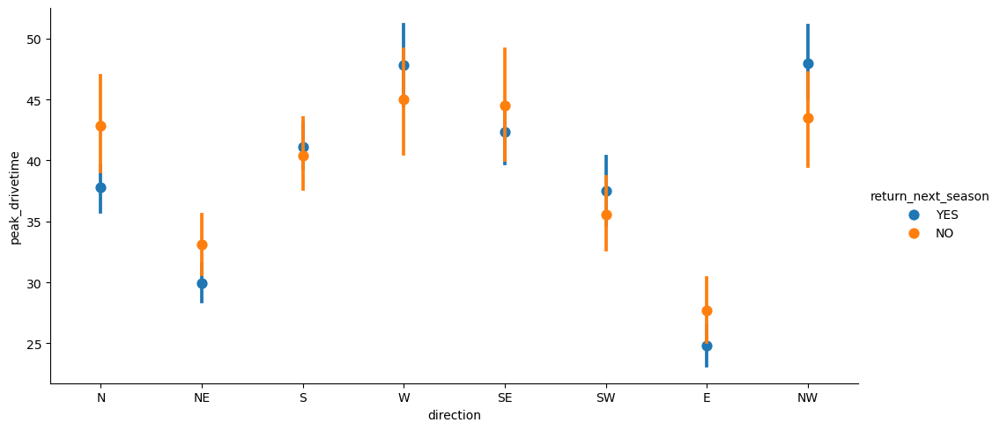

In [594]:
sns.catplot(data = df_athletics, x='direction', y='peak_drivetime', hue='return_next_season', kind='point', aspect=2, join=False)

plt.show()

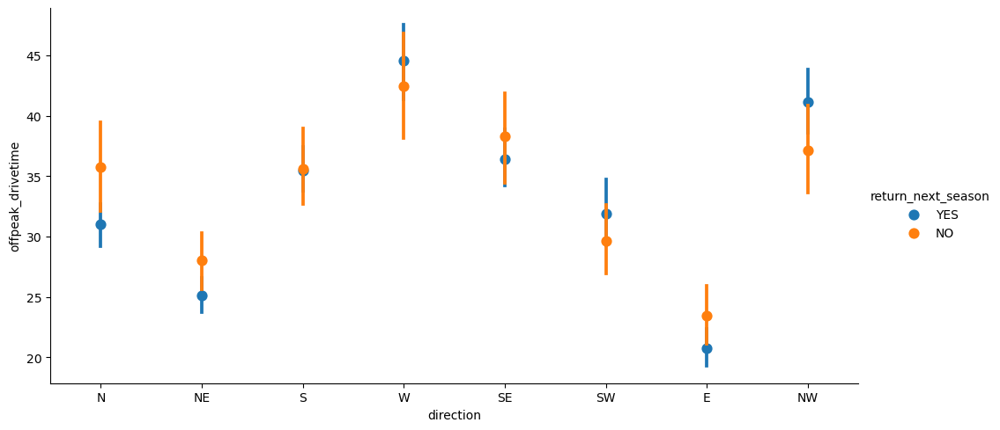

In [595]:
sns.catplot(data = df_athletics, x='direction', y='offpeak_drivetime', hue='return_next_season', kind='point', aspect=2, join=False)

plt.show()

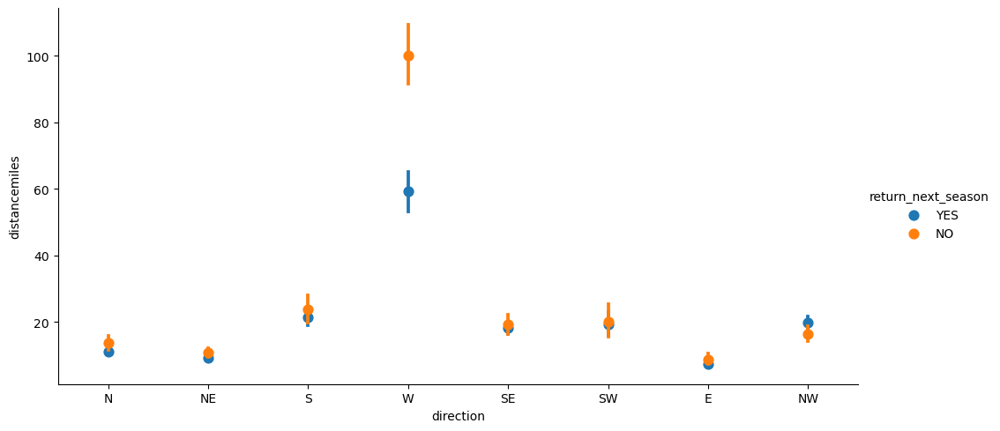

In [596]:
sns.catplot(data = df_athletics, x='direction', y='distancemiles', hue='return_next_season', kind='point', aspect=2, join=False)

plt.show()

## Visualize the counts of combinations between outcome unique value and categorical input unique values

In [597]:
# This shows the counts of observations for each combination of return_next_season and the categorical variables
categorical_columns = ['gender', 'direction', 'purchase_month', 'purchase_dow', 'price_type', 'price_level']
outcome_column = 'return_next_season'

observation_counts = df_athletics.groupby([outcome_column] + categorical_columns).size().reset_index(name='count')

observation_counts

,return_next_season,gender,direction,purchase_month,purchase_dow,price_type,price_level,count
0,NO,Female,N,Jan-Feb,Tue,A,Lower End Zone,1
1,NO,Female,S,Jan-Feb,Thu,Other,Other,1
2,NO,Female,SW,Other,Fri,A,Upper Corners,1
3,NO,Female,W,Mar-Apr,Mon,IA,Upper Corners,1
4,NO,Male,E,Other,Thu,A,Other,1
...,...,...,...,...,...,...,...,...
441,YES,Prefer to self-describe,E,Jan-Feb,Wed,IA-2,Other,1
442,YES,Prefer to self-describe,S,Jan-Feb,Tue,Other,Lower End Zone,1
443,YES,Prefer to self-describe,SE,Jan-Feb,Tue,A,Lower End Zone,1
444,YES,Prefer to self-describe,SE,Jan-Feb,Tue,A,Other,1


### I will visualize these counts using heatmaps pivot tables because they appropriately show the frequency of different combinations of categorical variables 

These heatmaps depicted below are showing us what we saw in the plots shown previously, but they do a good job at showing us high frequency combinations and make it easier to find patterns in the data that we can use to understnad what makes people want to renew next season (especially for marketing techniques). For example, we see that it's mostly males who renew and most renewals happen on Momdays or in January-February. This could be due to the fact that the football season is ending around January, so people wait to see if their team did well at the end of the season before deciding to buy the next season's tickets. 

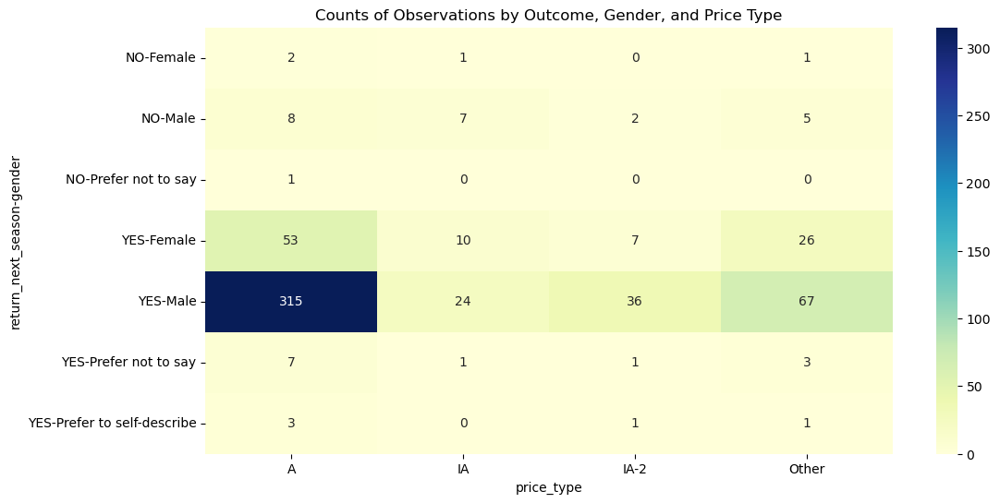

In [598]:
ath_counts = df_athletics.groupby([outcome_column, 'gender', 'price_type']).size().reset_index(name='count')

compact_pivot_table = ath_counts.pivot_table(index=[outcome_column, 'gender'], columns='price_type', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(compact_pivot_table, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Gender, and Price Type')
plt.show()

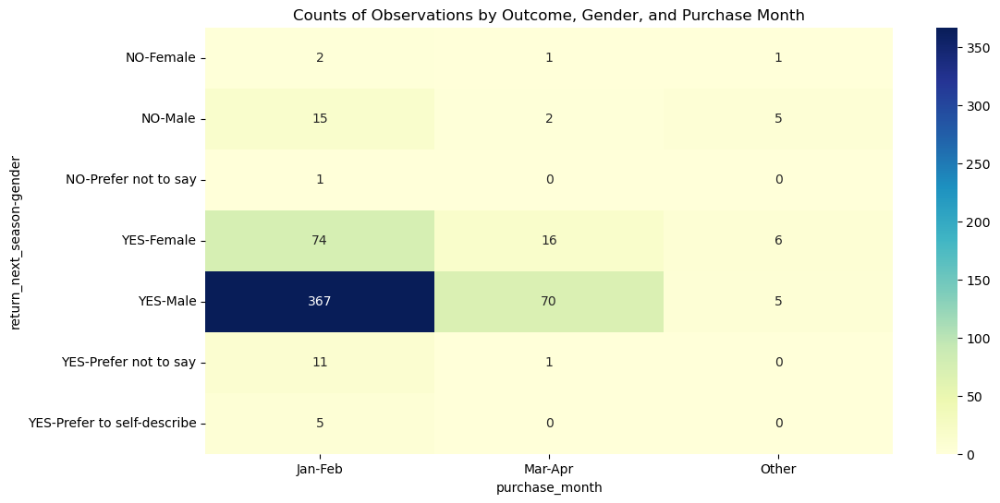

In [599]:
counts_gender_purchase_month = df_athletics.groupby([outcome_column, 'gender', 'purchase_month']).size().reset_index(name='count')

pivot_gender_purchase_month = counts_gender_purchase_month.pivot_table(index=[outcome_column, 'gender'], columns='purchase_month', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_gender_purchase_month, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Gender, and Purchase Month')
plt.show()

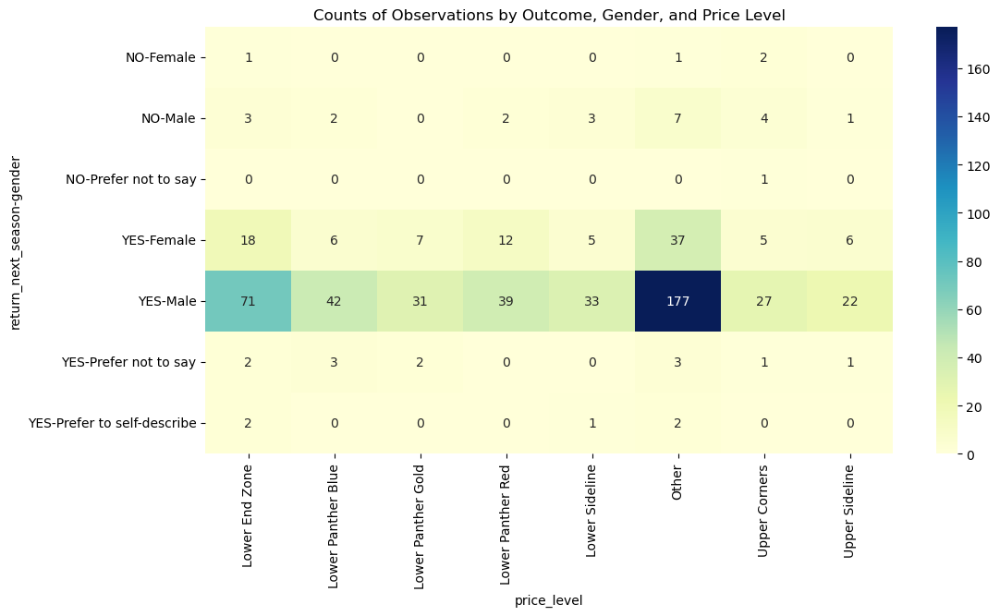

In [600]:
counts_gender_price_level = df_athletics.groupby([outcome_column, 'gender', 'price_level']).size().reset_index(name='count')

pivot_gender_price_level = counts_gender_price_level.pivot_table(index=[outcome_column, 'gender'], columns='price_level', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_gender_price_level, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Gender, and Price Level')
plt.show()

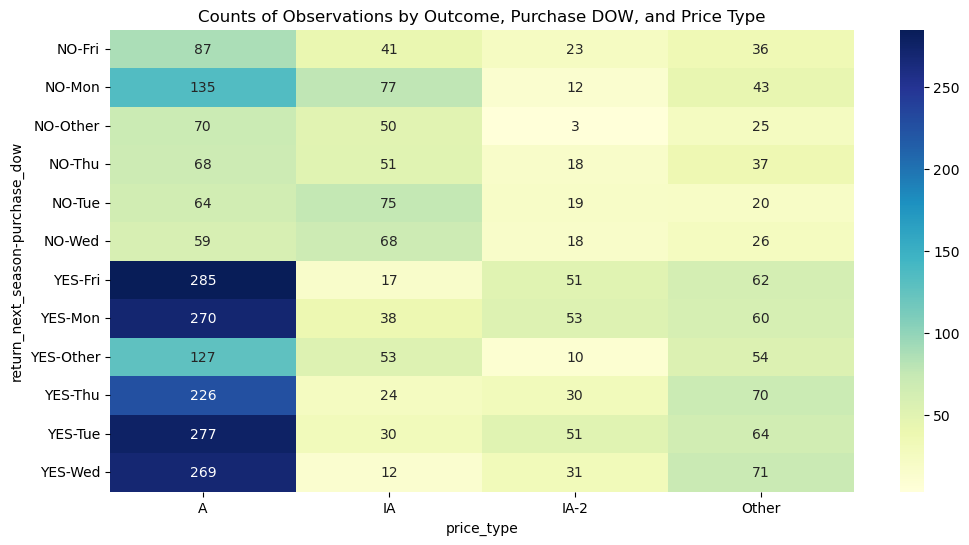

In [601]:
counts_purchase_dow_price_type = df_athletics.groupby([outcome_column, 'purchase_dow', 'price_type']).size().reset_index(name='count')

pivot_purchase_dow_price_type = counts_purchase_dow_price_type.pivot_table(index=[outcome_column, 'purchase_dow'], columns='price_type', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_purchase_dow_price_type, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Purchase DOW, and Price Type')
plt.show()

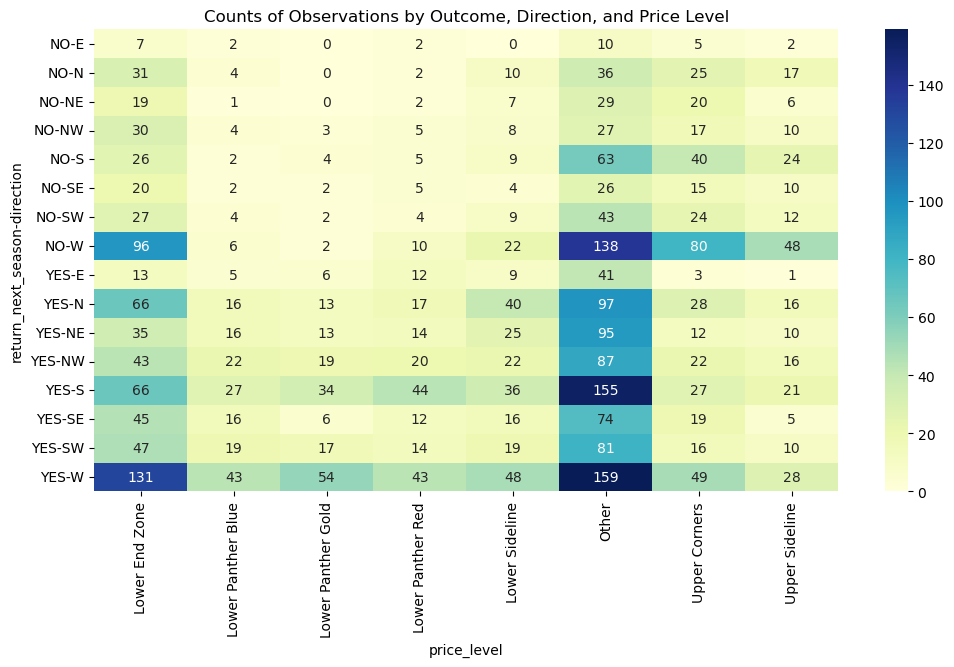

In [602]:
counts_direction_price_level = df_athletics.groupby([outcome_column, 'direction', 'price_level']).size().reset_index(name='count')

pivot_direction_price_level = counts_direction_price_level.pivot_table(index=[outcome_column, 'direction'], columns='price_level', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_direction_price_level, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Direction, and Price Level')
plt.show()

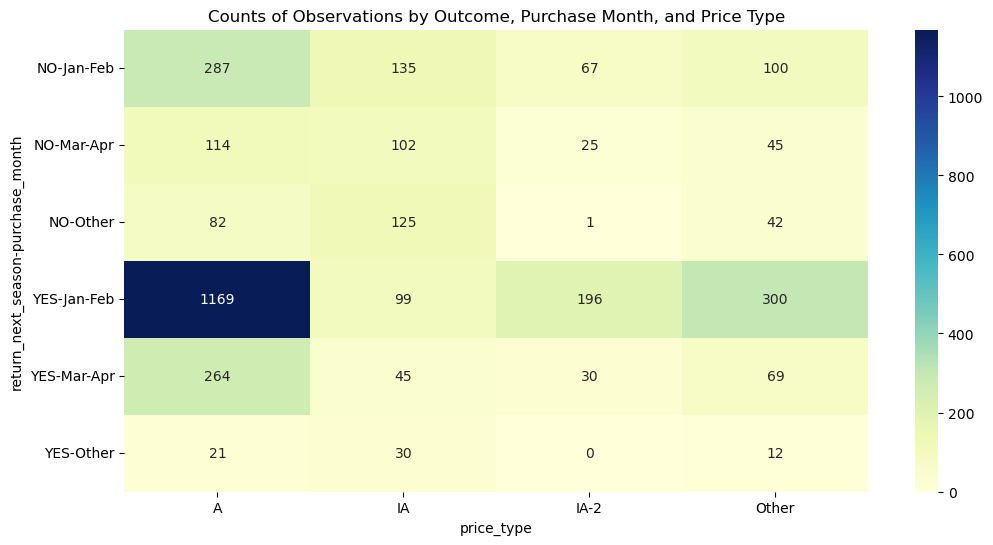

In [603]:
counts_purchase_month_price_type = df_athletics.groupby([outcome_column, 'purchase_month', 'price_type']).size().reset_index(name='count')

pivot_purchase_month_price_type = counts_purchase_month_price_type.pivot_table(index=[outcome_column, 'purchase_month'], columns='price_type', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_purchase_month_price_type, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Purchase Month, and Price Type')
plt.show()

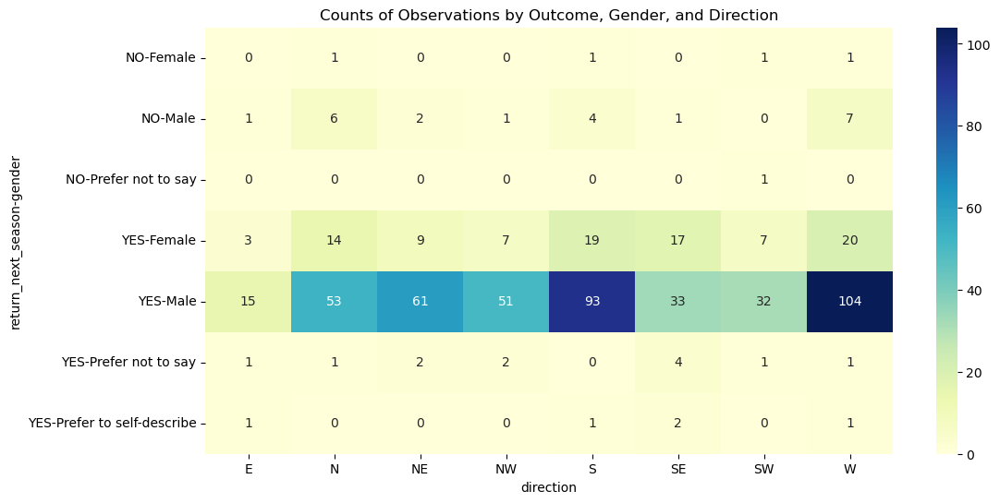

In [604]:
counts_gender_direction = df_athletics.groupby([outcome_column, 'gender', 'direction']).size().reset_index(name='count')

pivot_gender_direction = counts_gender_direction.pivot_table(index=[outcome_column, 'gender'], columns='direction', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_gender_direction, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Gender, and Direction')
plt.show()

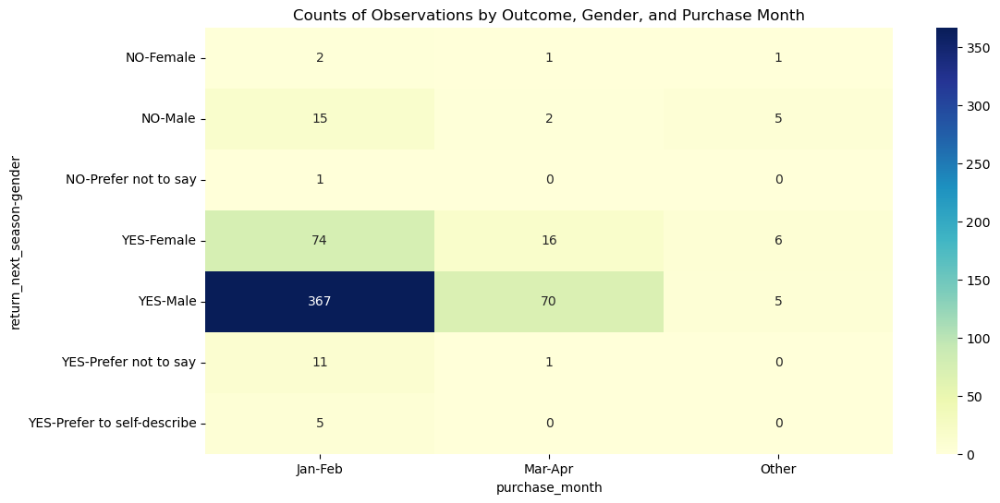

In [605]:
counts_gender_purchase_month = df_athletics.groupby([outcome_column, 'gender', 'purchase_month']).size().reset_index(name='count')

pivot_gender_purchase_month = counts_gender_purchase_month.pivot_table(index=[outcome_column, 'gender'], columns='purchase_month', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_gender_purchase_month, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Gender, and Purchase Month')
plt.show()


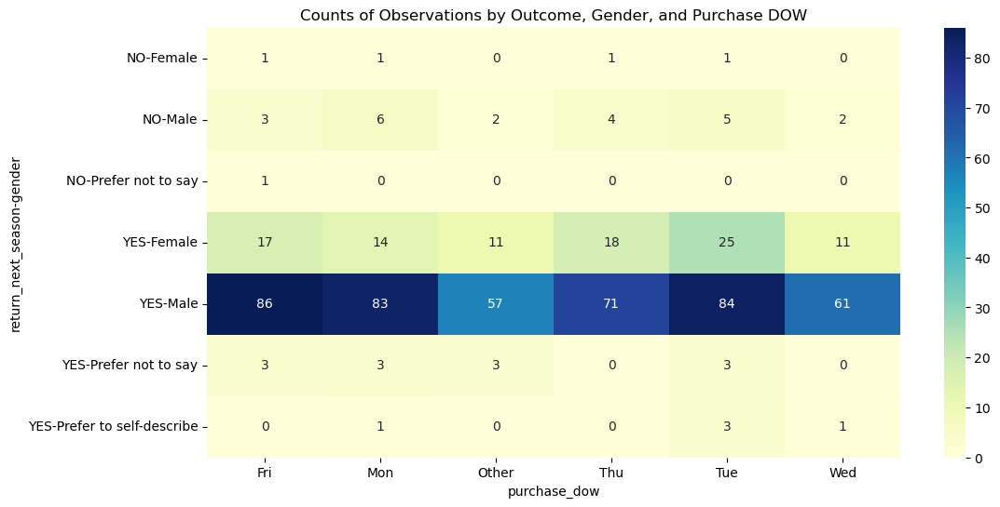

In [606]:
counts_gender_purchase_dow = df_athletics.groupby([outcome_column, 'gender', 'purchase_dow']).size().reset_index(name='count')

pivot_gender_purchase_dow = counts_gender_purchase_dow.pivot_table(index=[outcome_column, 'gender'], columns='purchase_dow', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_gender_purchase_dow, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Gender, and Purchase DOW')
plt.show()

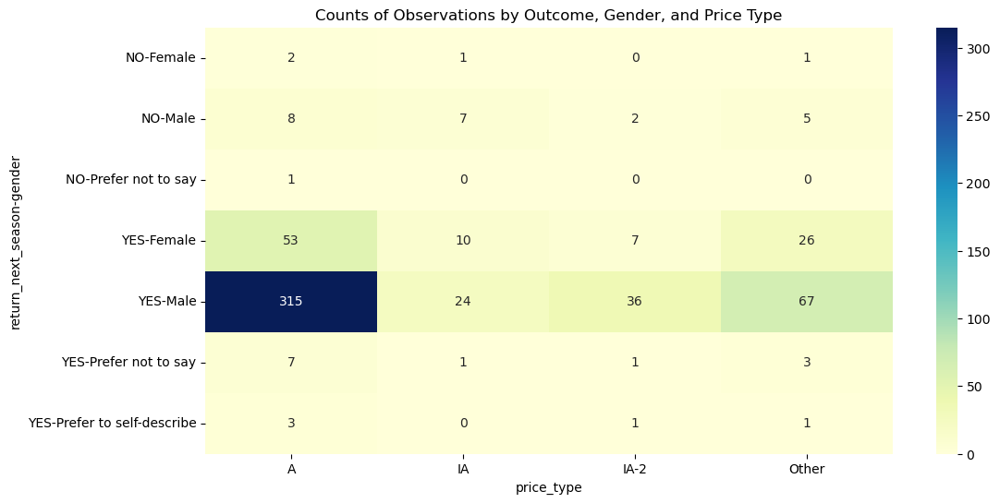

In [607]:
counts_gender_price_type = df_athletics.groupby([outcome_column, 'gender', 'price_type']).size().reset_index(name='count')

pivot_gender_price_type = counts_gender_price_type.pivot_table(index=[outcome_column, 'gender'], columns='price_type', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_gender_price_type, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Gender, and Price Type')
plt.show()

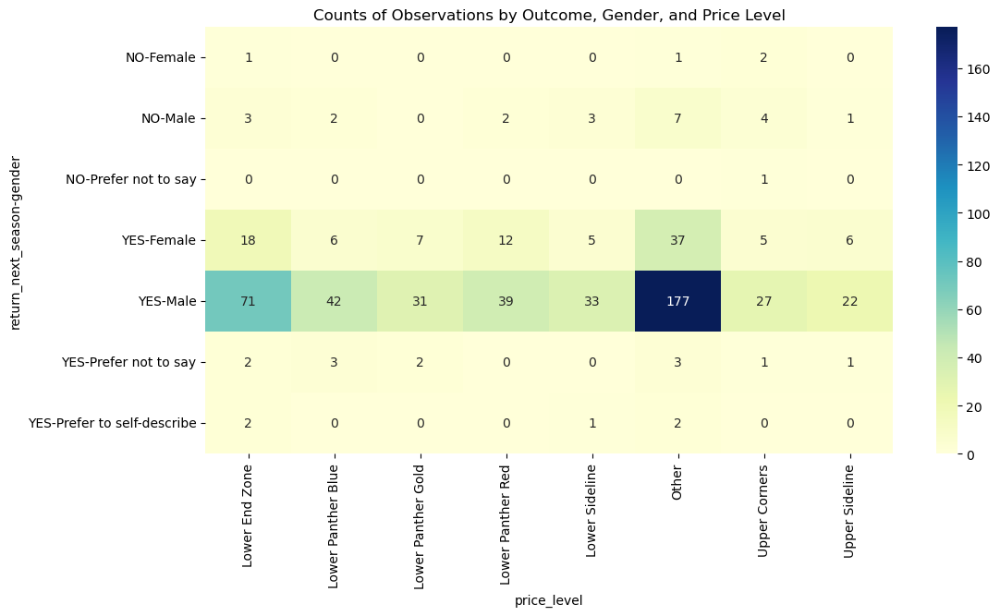

In [608]:
counts_gender_price_level = df_athletics.groupby([outcome_column, 'gender', 'price_level']).size().reset_index(name='count')

pivot_gender_price_level = counts_gender_price_level.pivot_table(index=[outcome_column, 'gender'], columns='price_level', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_gender_price_level, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Gender, and Price Level')
plt.show()

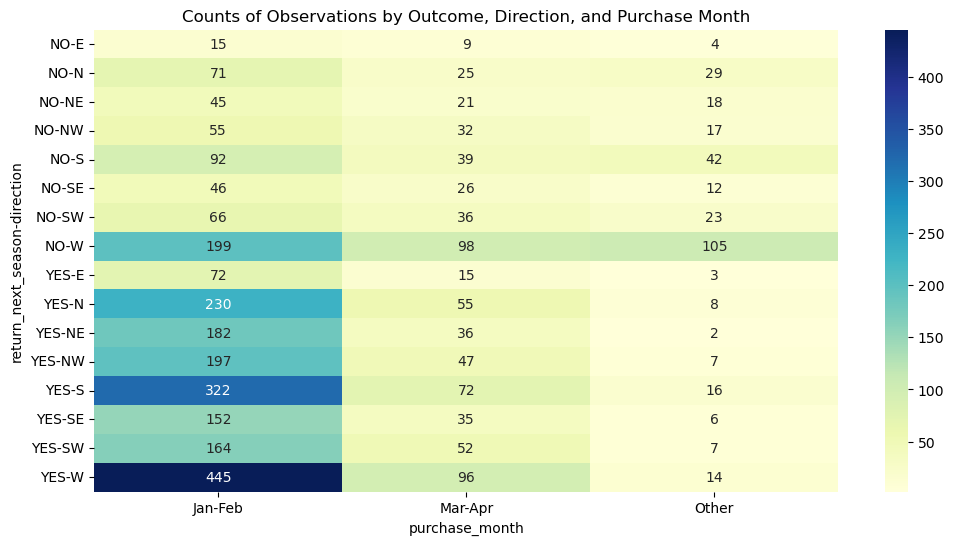

In [609]:
counts_direction_purchase_month = df_athletics.groupby([outcome_column, 'direction', 'purchase_month']).size().reset_index(name='count')

pivot_direction_purchase_month = counts_direction_purchase_month.pivot_table(index=[outcome_column, 'direction'], columns='purchase_month', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_direction_purchase_month, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Direction, and Purchase Month')
plt.show()

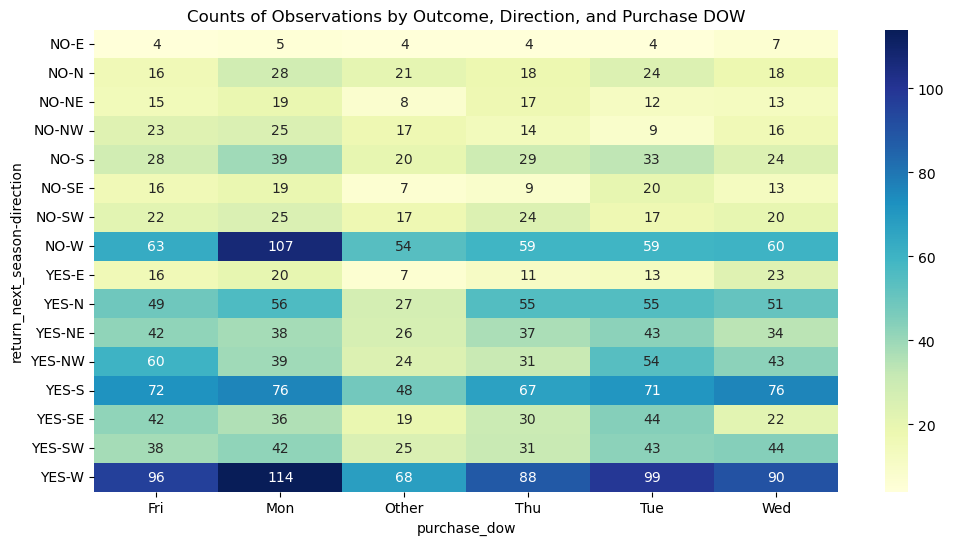

In [610]:
counts_direction_purchase_dow = df_athletics.groupby([outcome_column, 'direction', 'purchase_dow']).size().reset_index(name='count')

pivot_direction_purchase_dow = counts_direction_purchase_dow.pivot_table(index=[outcome_column, 'direction'], columns='purchase_dow', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_direction_purchase_dow, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Direction, and Purchase DOW')
plt.show()

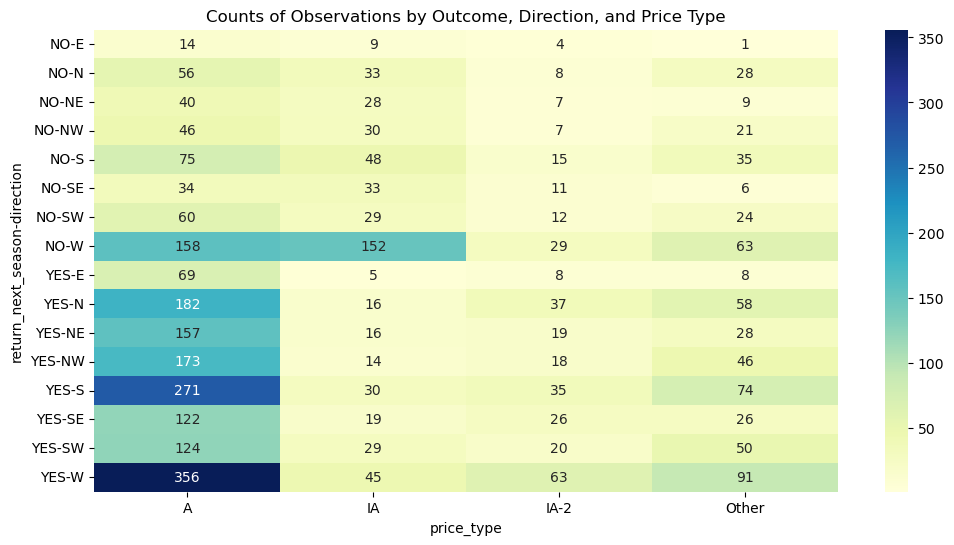

In [611]:
counts_direction_price_type = df_athletics.groupby([outcome_column, 'direction', 'price_type']).size().reset_index(name='count')

pivot_direction_price_type = counts_direction_price_type.pivot_table(index=[outcome_column, 'direction'], columns='price_type', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_direction_price_type, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Direction, and Price Type')
plt.show()

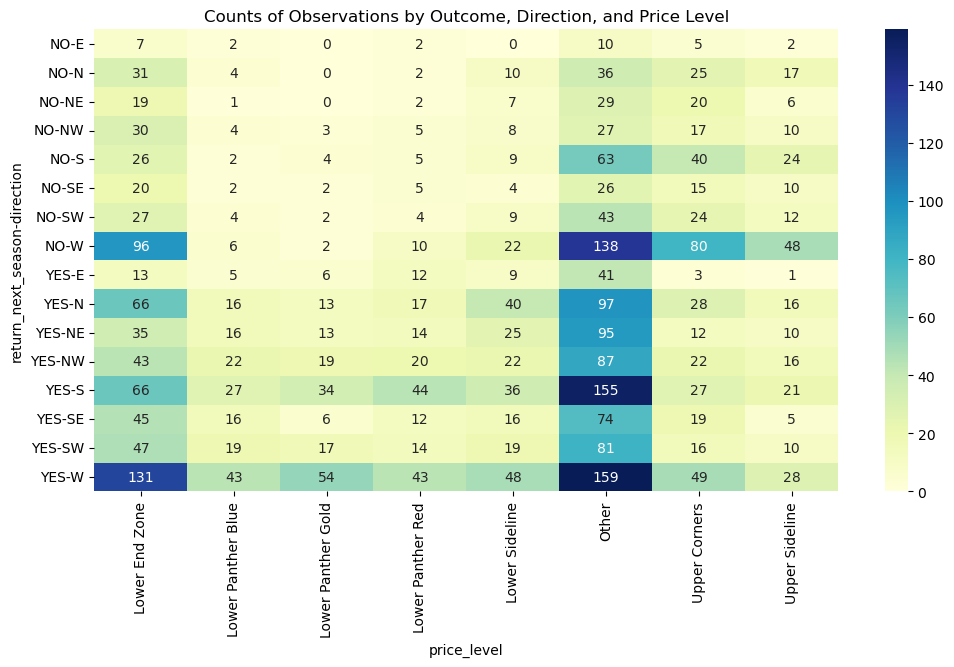

In [612]:
counts_direction_price_level = df_athletics.groupby([outcome_column, 'direction', 'price_level']).size().reset_index(name='count')

pivot_direction_price_level = counts_direction_price_level.pivot_table(index=[outcome_column, 'direction'], columns='price_level', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_direction_price_level, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Direction, and Price Level')
plt.show()

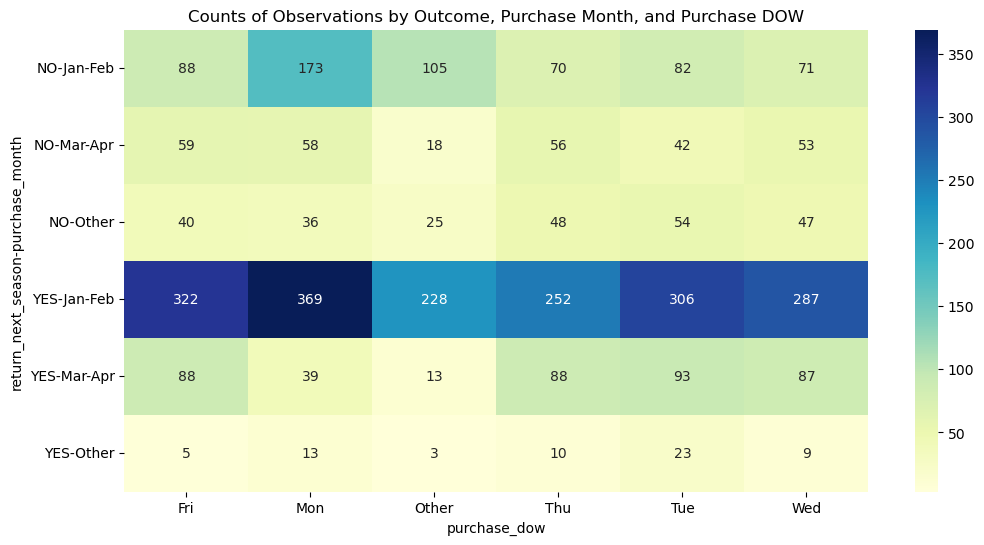

In [613]:
counts_purchase_month_purchase_dow = df_athletics.groupby([outcome_column, 'purchase_month', 'purchase_dow']).size().reset_index(name='count')

pivot_purchase_month_purchase_dow = counts_purchase_month_purchase_dow.pivot_table(index=[outcome_column, 'purchase_month'], columns='purchase_dow', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_purchase_month_purchase_dow, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Purchase Month, and Purchase DOW')
plt.show()

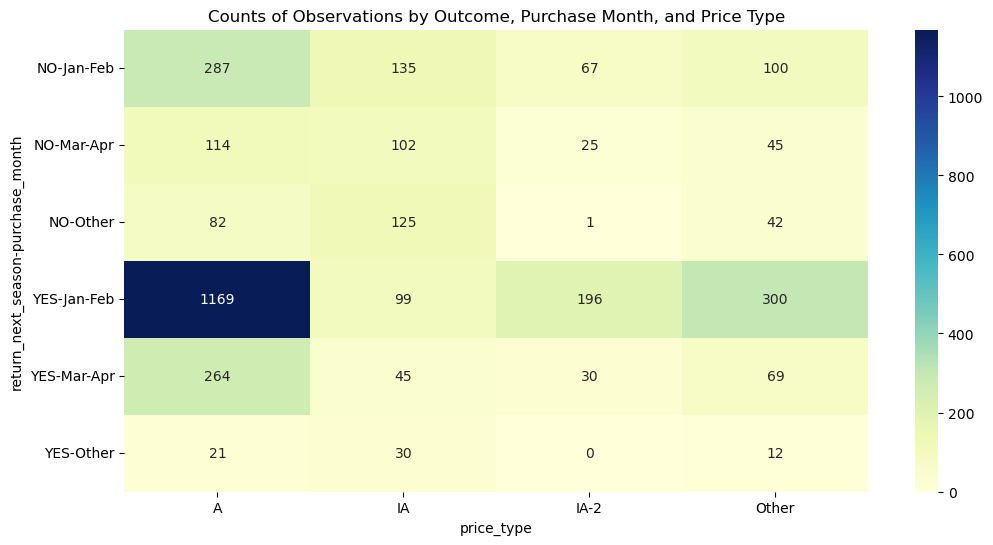

In [614]:
counts_purchase_month_price_type = df_athletics.groupby([outcome_column, 'purchase_month', 'price_type']).size().reset_index(name='count')

pivot_purchase_month_price_type = counts_purchase_month_price_type.pivot_table(index=[outcome_column, 'purchase_month'], columns='price_type', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_purchase_month_price_type, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Purchase Month, and Price Type')
plt.show()

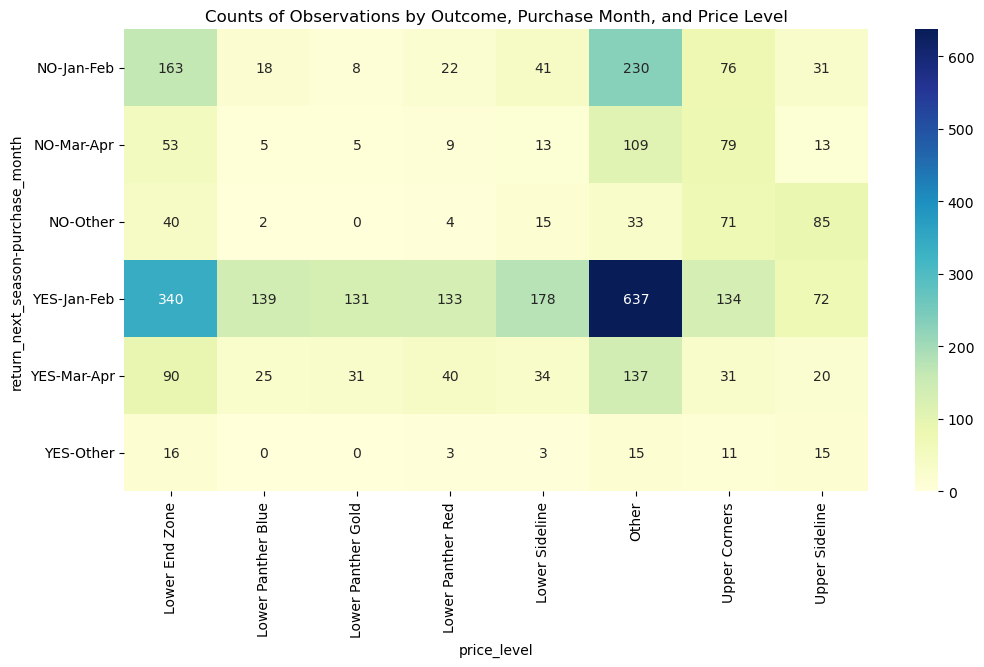

In [615]:
counts_purchase_month_price_level = df_athletics.groupby([outcome_column, 'purchase_month', 'price_level']).size().reset_index(name='count')

pivot_purchase_month_price_level = counts_purchase_month_price_level.pivot_table(index=[outcome_column, 'purchase_month'], columns='price_level', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_purchase_month_price_level, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Purchase Month, and Price Level')
plt.show()

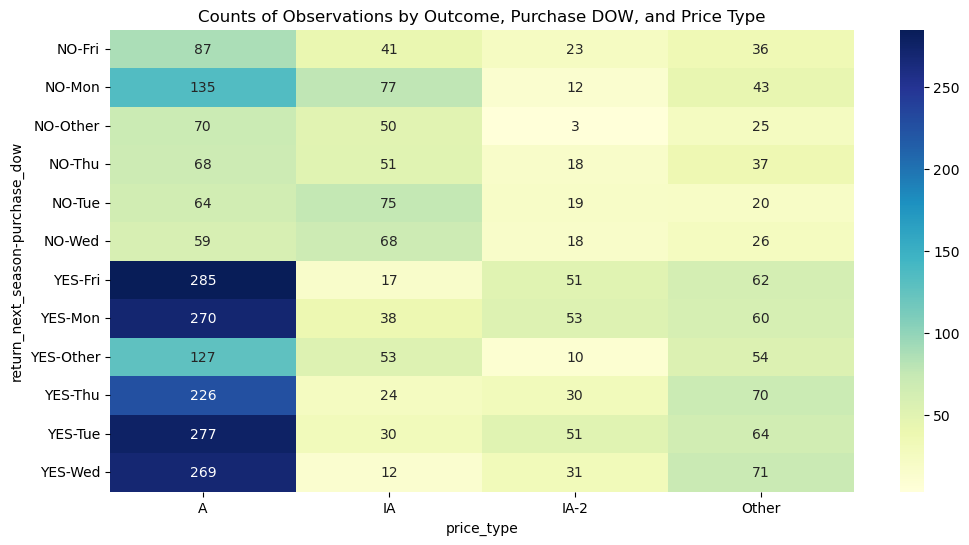

In [616]:
counts_purchase_dow_price_type = df_athletics.groupby([outcome_column, 'purchase_dow', 'price_type']).size().reset_index(name='count')

pivot_purchase_dow_price_type = counts_purchase_dow_price_type.pivot_table(index=[outcome_column, 'purchase_dow'], columns='price_type', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_purchase_dow_price_type, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Purchase DOW, and Price Type')
plt.show()

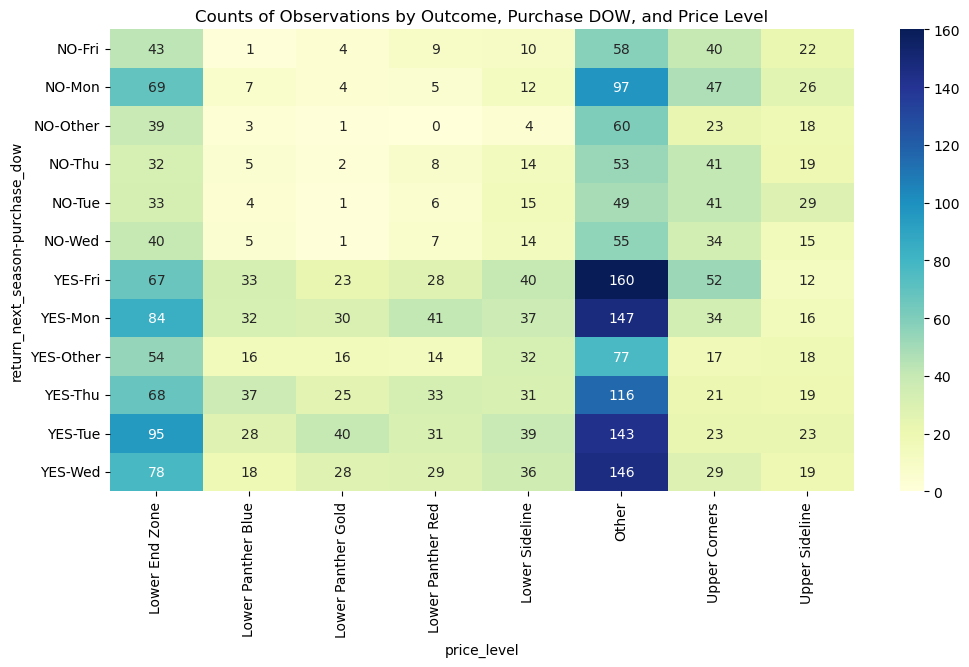

In [617]:
counts_purchase_dow_price_level = df_athletics.groupby([outcome_column, 'purchase_dow', 'price_level']).size().reset_index(name='count')

pivot_purchase_dow_price_level = counts_purchase_dow_price_level.pivot_table(index=[outcome_column, 'purchase_dow'], columns='price_level', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_purchase_dow_price_level, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Purchase DOW, and Price Level')
plt.show()

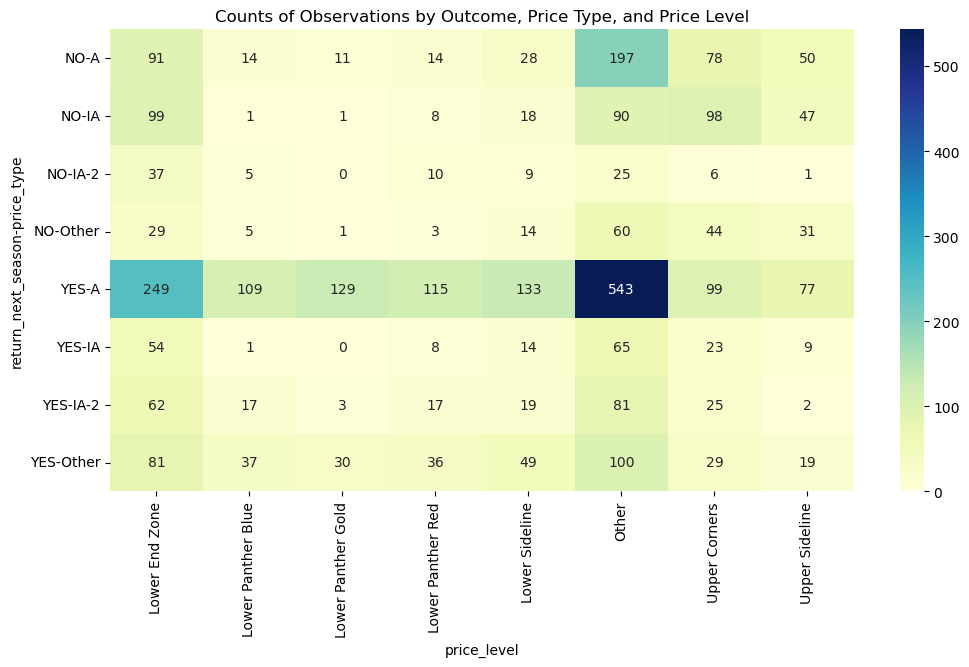

In [618]:
counts_price_type_price_level = df_athletics.groupby([outcome_column, 'price_type', 'price_level']).size().reset_index(name='count')

pivot_price_type_price_level = counts_price_type_price_level.pivot_table(index=[outcome_column, 'price_type'], columns='price_level', values='count', fill_value=0, aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_price_type_price_level, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Counts of Observations by Outcome, Price Type, and Price Level')
plt.show()

## Visualizing response variables

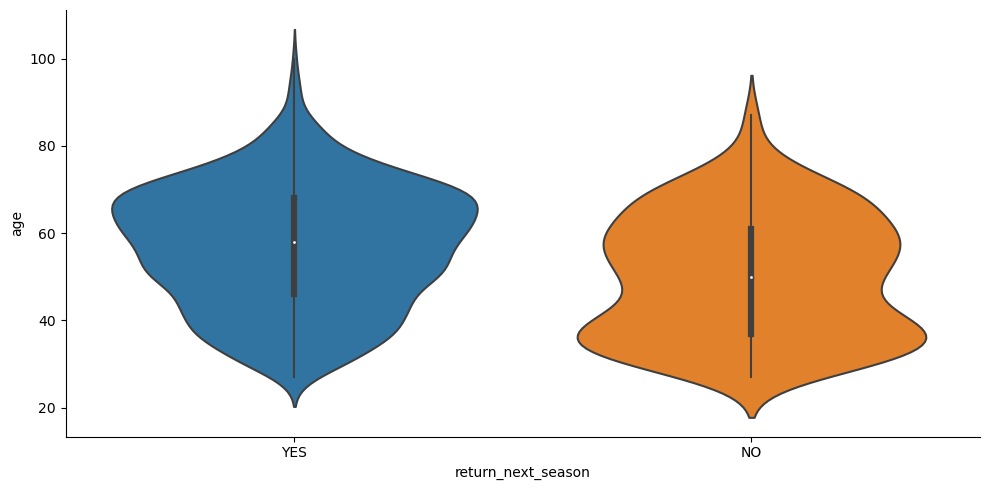

In [619]:
sns.catplot(data = df_athletics, x = 'return_next_season', y = 'age', kind = 'violin', aspect = 2)
plt.show()

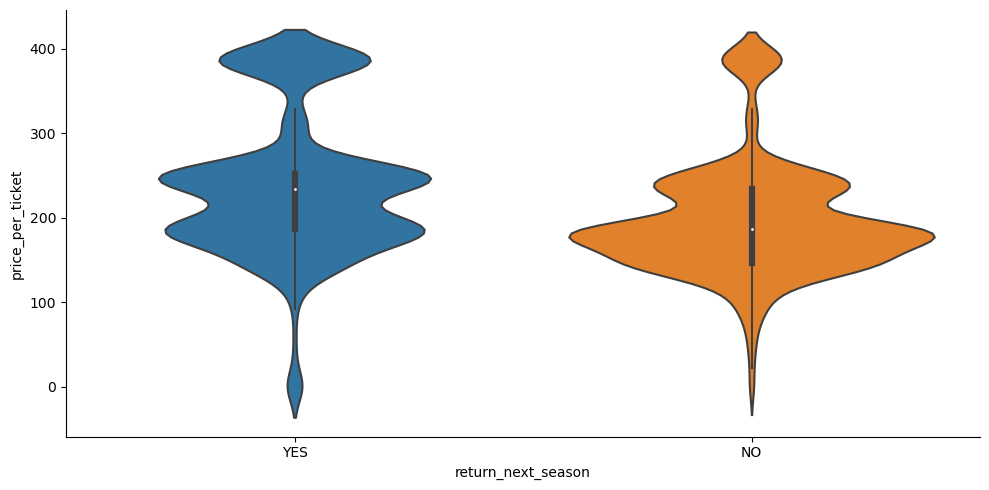

In [620]:
sns.catplot(data = df_athletics, x = 'return_next_season', y = 'price_per_ticket', kind = 'violin', aspect = 2)
plt.show()

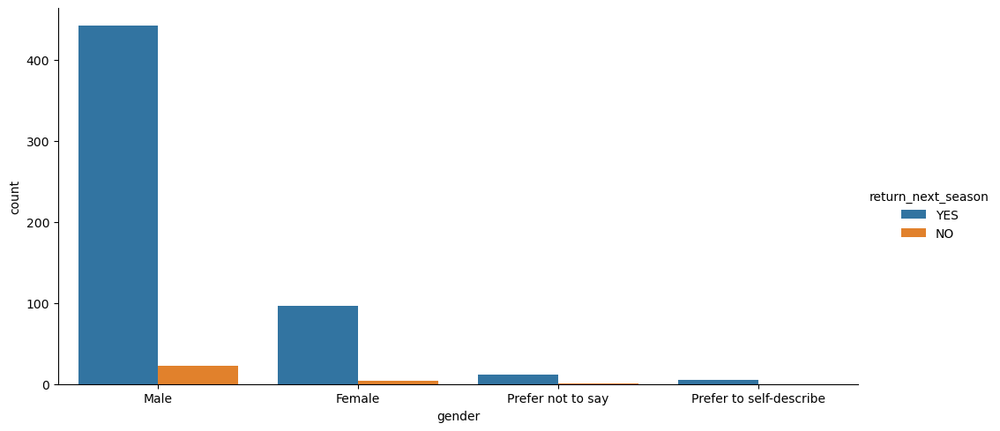

In [621]:
sns.catplot(data = df_athletics, x = 'gender', kind = 'count', hue = 'return_next_season', aspect =2)
plt.show()

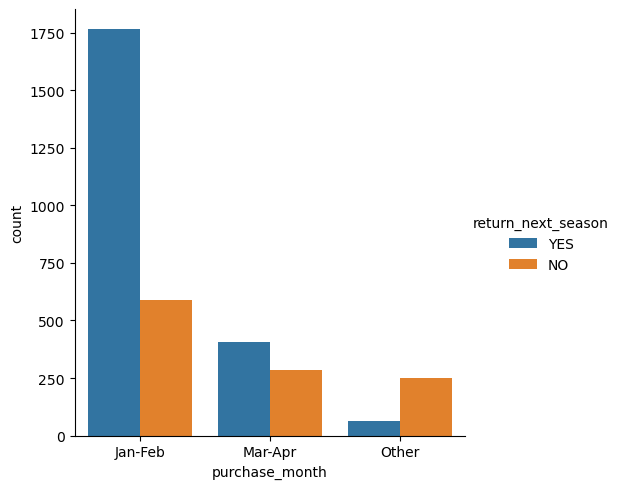

In [622]:
# This might be important to focus on as I have noticed a strong correlation in the month purchased
sns.catplot(data = df_athletics, x = 'purchase_month', kind = 'count', hue = 'return_next_season')
plt.show()

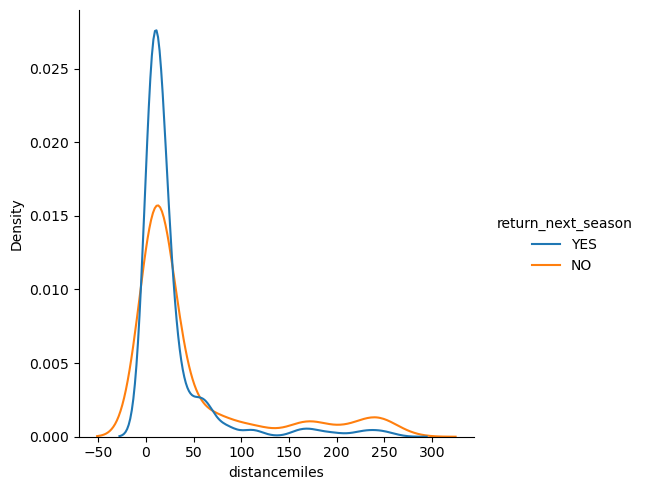

In [623]:
sns.displot(data=df_athletics, x='distancemiles', 
            hue='return_next_season', 
            kind='kde',
           common_norm=False,)
plt.show()

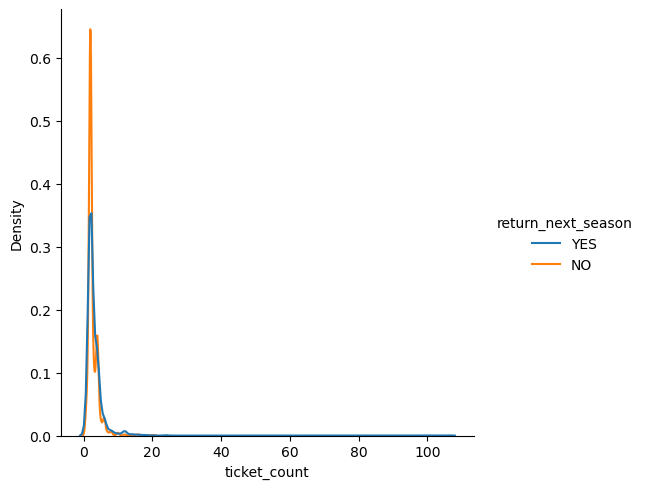

In [624]:
sns.displot(data=df_athletics, x='ticket_count', 
            hue='return_next_season', 
            kind='kde',
           common_norm=False,)
plt.show()

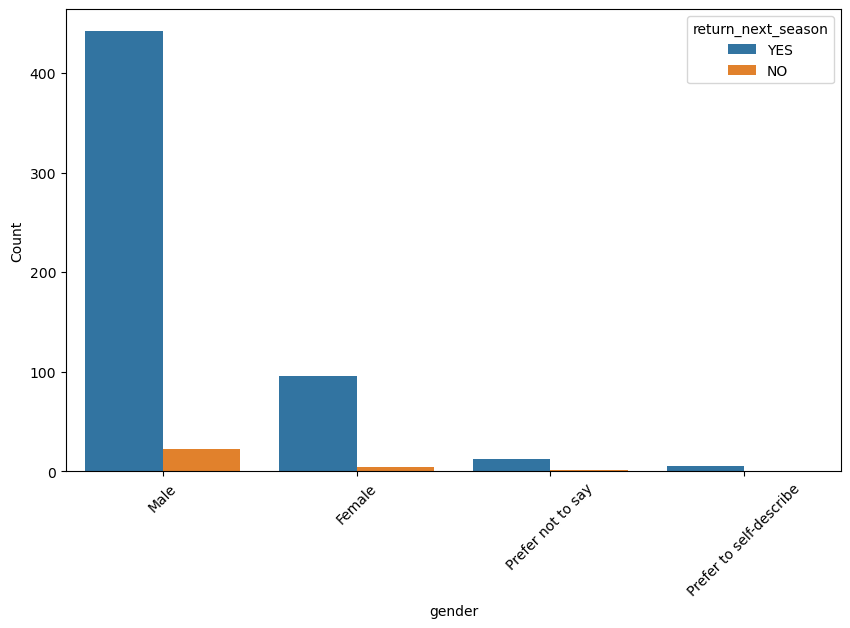

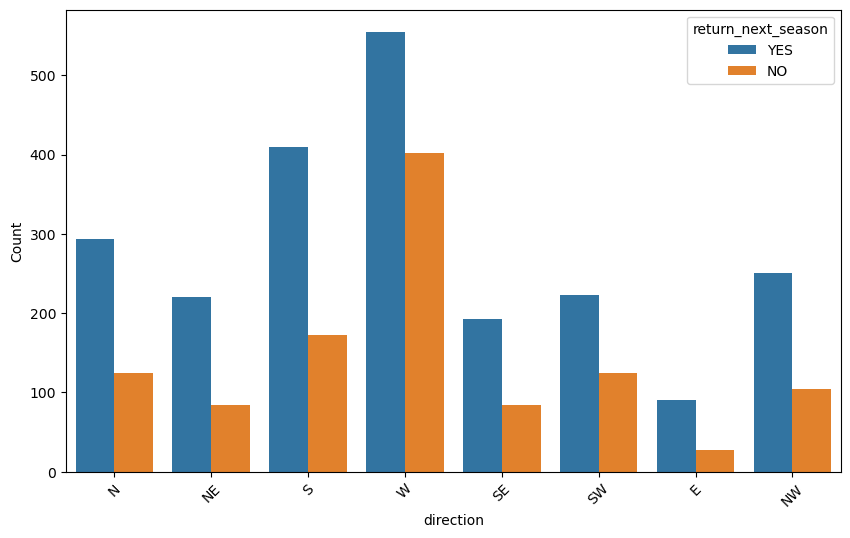

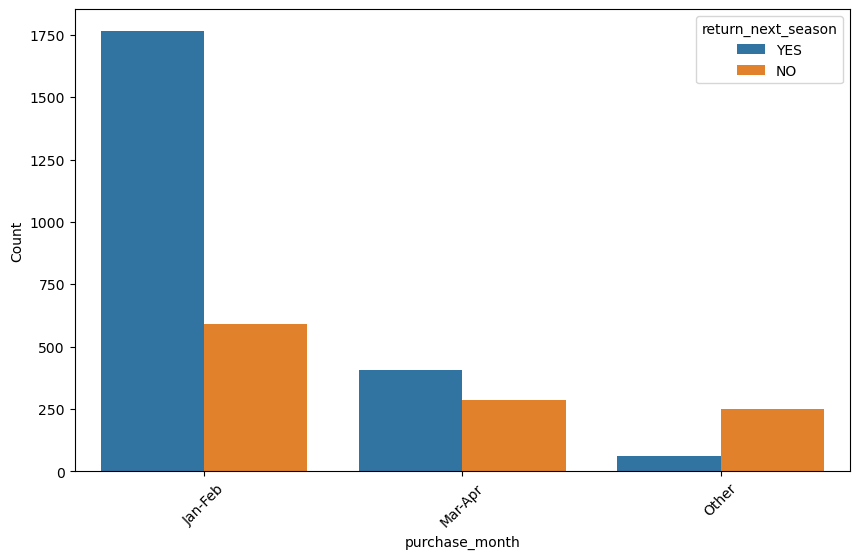

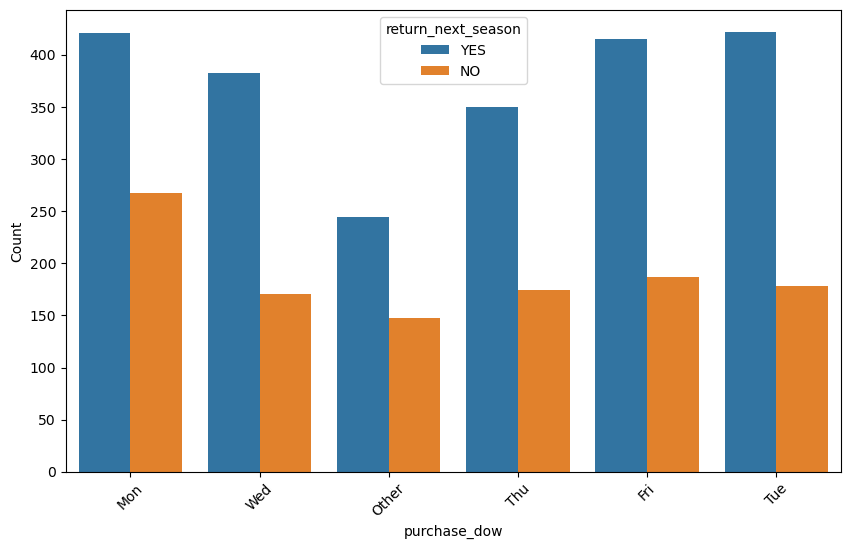

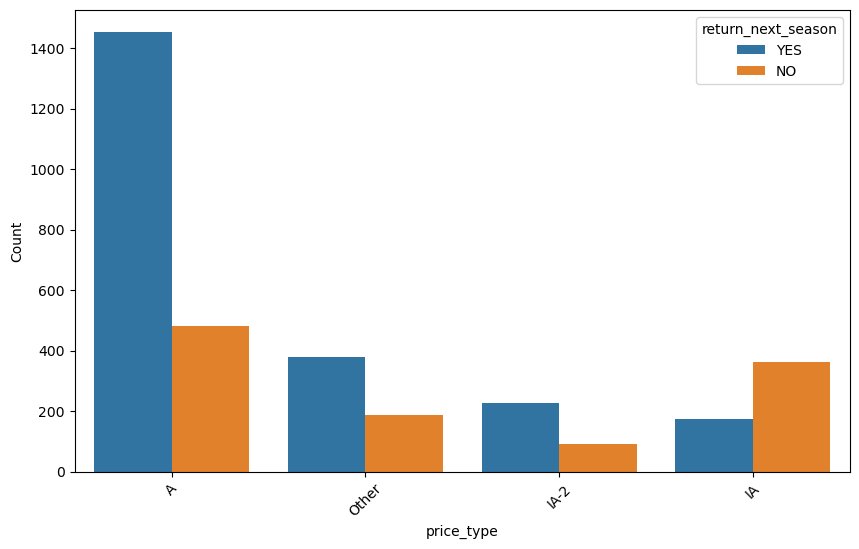

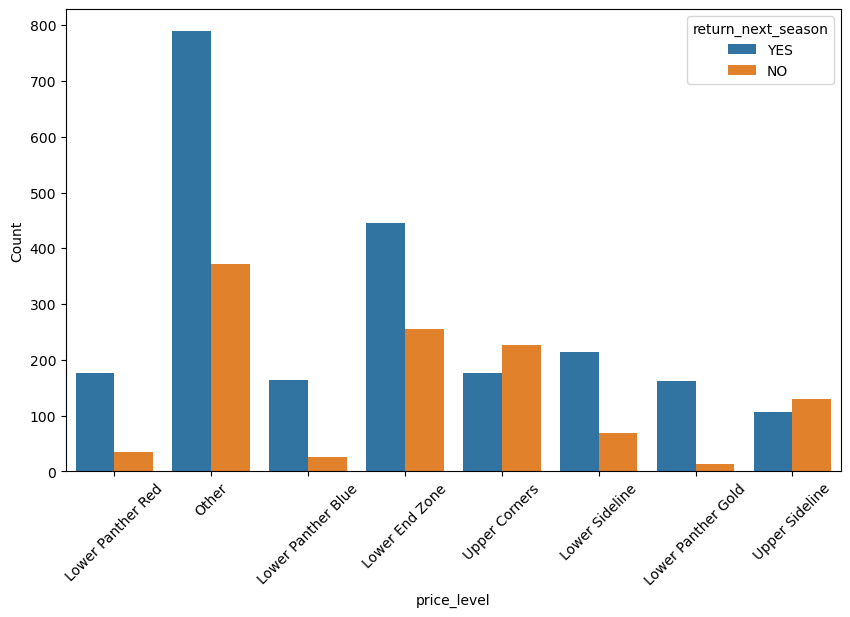

In [625]:
categorical_vars = ['gender', 'direction', 'purchase_month', 'purchase_dow', 'price_type', 'price_level']
for var in categorical_vars:
    if var in df_athletics.columns:
        plt.figure(figsize=(10, 6))
        sns.countplot(x=var, hue='return_next_season', data=df_athletics)
        plt.xlabel(var)
        plt.ylabel('Count')
        plt.xticks(rotation=45)
        plt.show()

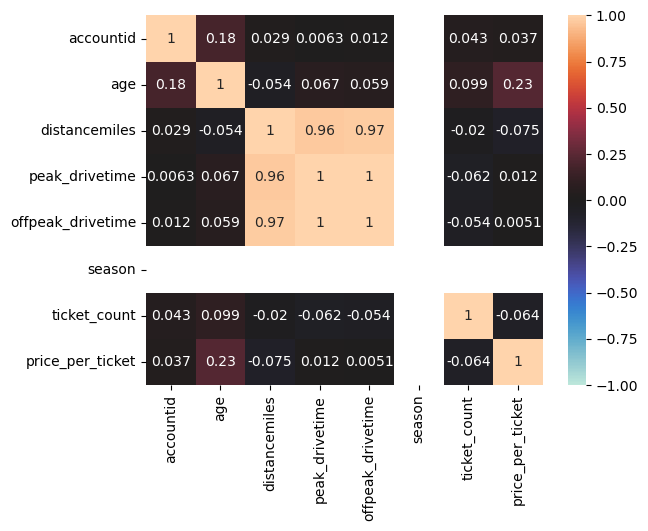

In [626]:
fig, ax = plt.subplots()
sns.heatmap(data = df_athletics.corr(numeric_only = True),
            vmin=-1, vmax=1, center = 0,
            annot=True, annot_kws={'size': 10},
            ax=ax)
plt.show()

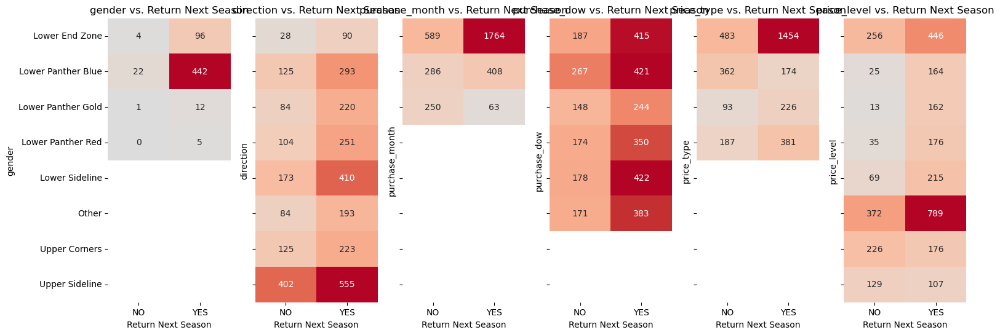

In [627]:
fig, axs = plt.subplots(1, len(categorical_vars), figsize=(18, 6), sharex=True, sharey=True)
for ix, var in enumerate(categorical_vars):
    if var in df_athletics.columns:
        crosstab = pd.crosstab(df_athletics[var], df_athletics['return_next_season'])
        sns.heatmap(crosstab, vmin=0, vmax=crosstab.values.max(), center=0, cmap='coolwarm', cbar=False, annot=True, fmt='d', annot_kws={'size': 10}, ax=axs[ix])
        axs[ix].set_title(f'{var} vs. Return Next Season')
        axs[ix].set_xlabel('Return Next Season')
        axs[ix].set_ylabel(var)
plt.show()

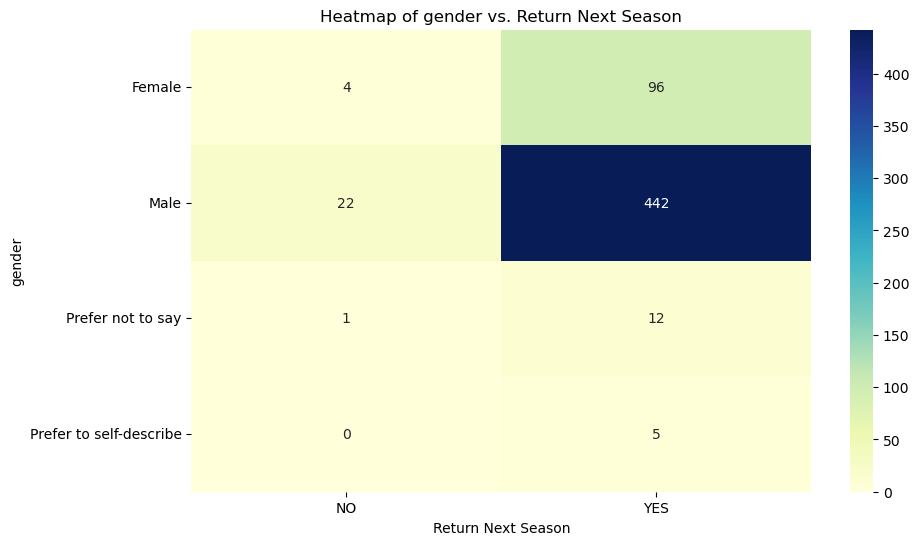

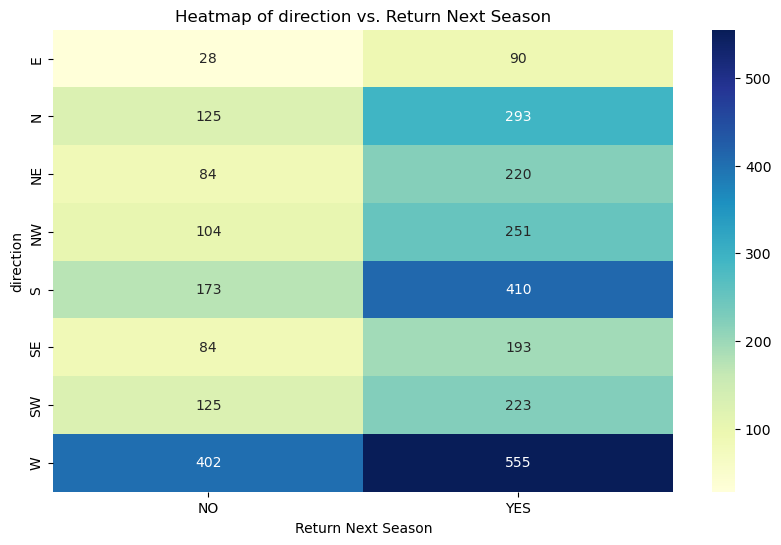

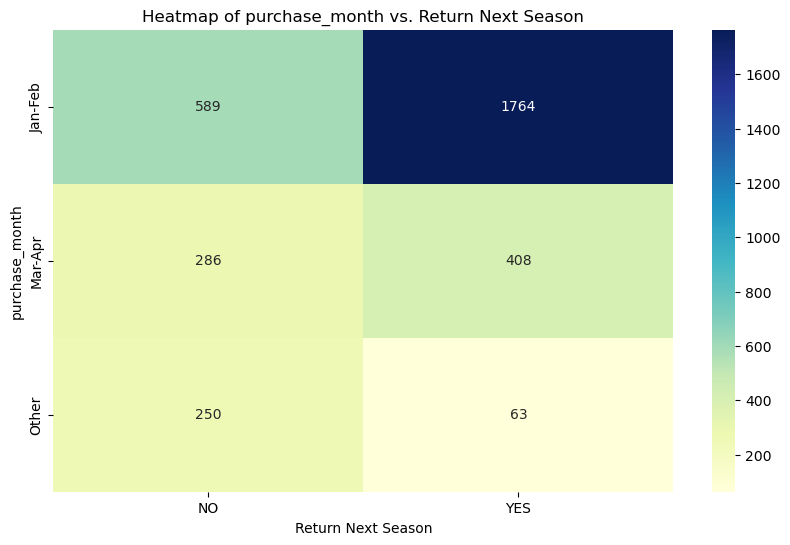

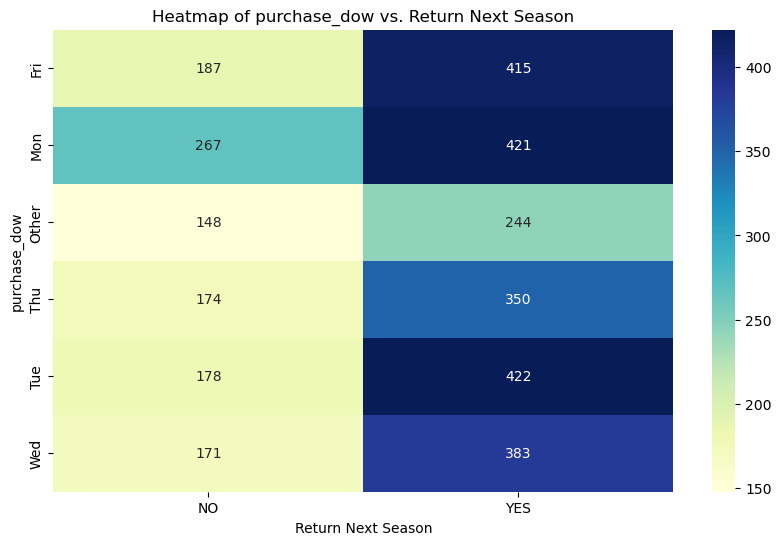

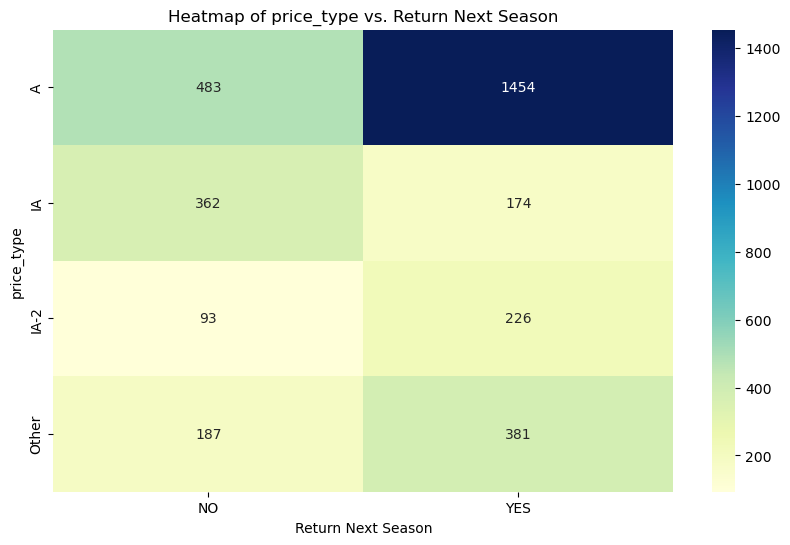

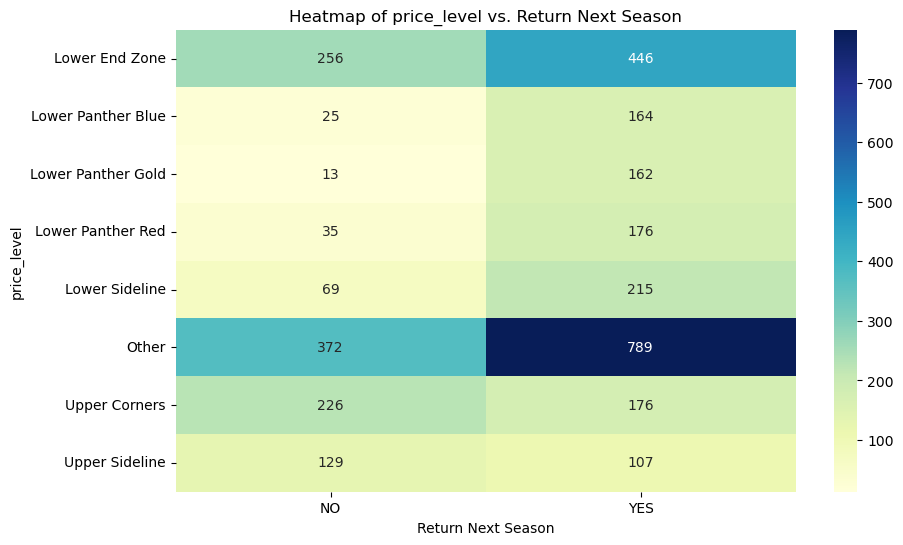

In [628]:
for var in categorical_vars:
    if var in df_athletics.columns:
        crosstab = pd.crosstab(df_athletics[var], df_athletics['return_next_season'])
        plt.figure(figsize=(10, 6))
        sns.heatmap(crosstab, annot=True, fmt='d', cmap='YlGnBu')
        plt.title(f'Heatmap of {var} vs. Return Next Season')
        plt.xlabel('Return Next Season')
        plt.ylabel(var)
        plt.show()

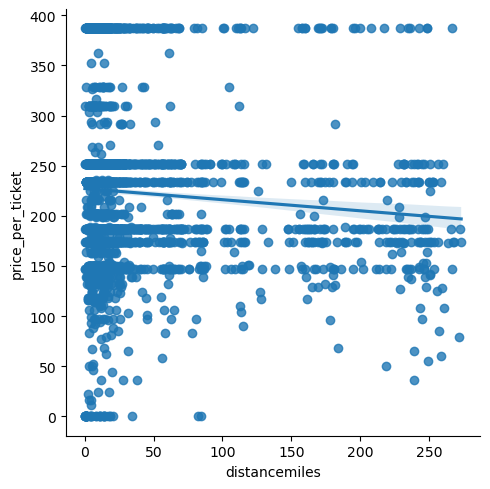

In [629]:
sns.lmplot(data = df_athletics, x ='distancemiles', y='price_per_ticket')
plt.show()

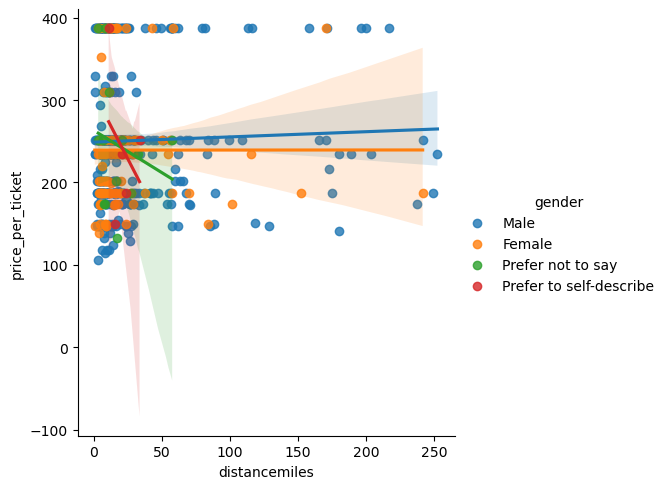

In [630]:
sns.lmplot(data = df_athletics, x ='distancemiles', y='price_per_ticket', hue='gender')
plt.show()

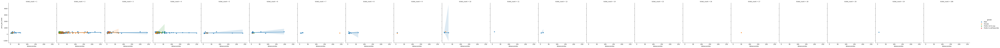

In [631]:
sns.lmplot(data = df_athletics, x ='distancemiles', y='price_per_ticket', hue='gender', col='ticket_count')
plt.show()

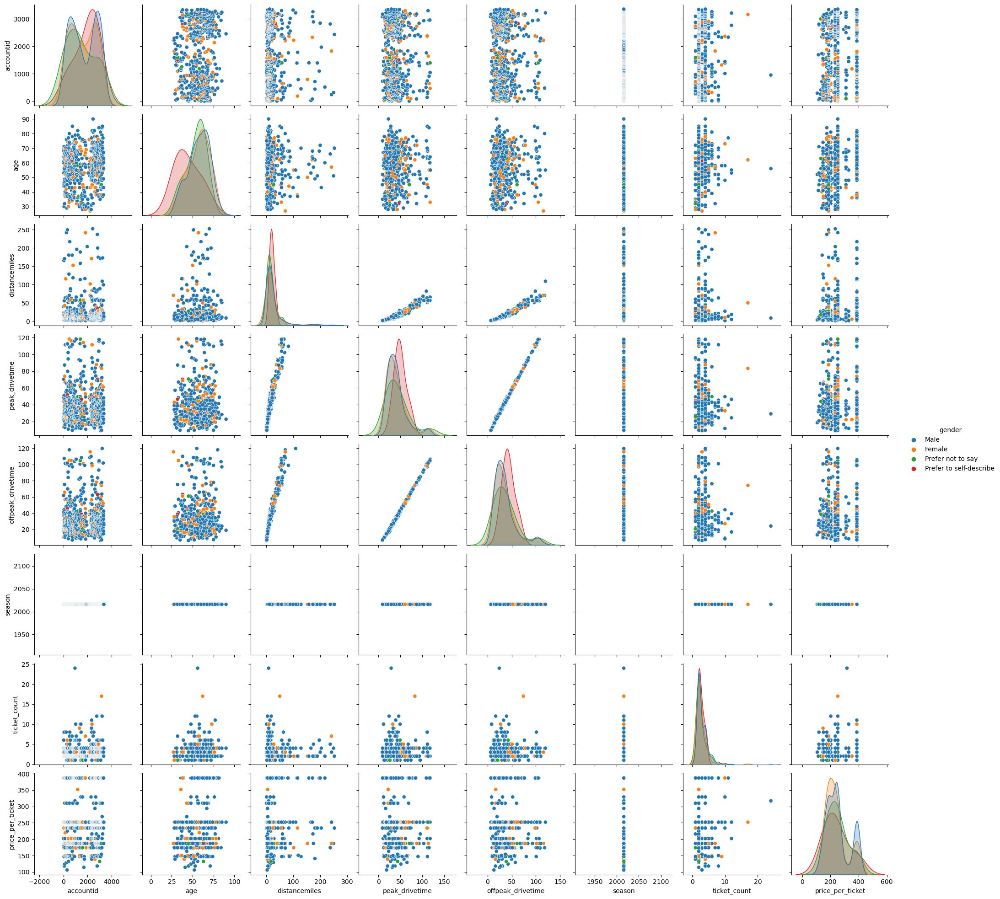

In [632]:
sns.pairplot(data=df_athletics, hue='gender', diag_kws={'common_norm': False})
plt.show()

## Filling in the missing data

In [633]:
from sklearn.cluster import KMeans

Let's see how many missing values we have in our data

In [634]:
df_athletics.isna().sum()

accountid                0
age                   1793
gender                2778
distancemiles            0
direction                0
peak_drivetime         402
offpeak_drivetime      364
season                   0
purchase_month           0
purchase_dow             0
price_type               0
price_level              0
ticket_count             0
price_per_ticket         0
return_next_season       0
dtype: int64

In [635]:
df_athletics.gender.value_counts(dropna=False)

gender
NaN                        2778
Male                        464
Female                      100
Prefer not to say            13
Prefer to self-describe       5
Name: count, dtype: int64

In [636]:
df_athletics_2=df_athletics.copy()

We can not just drop the NaN as that would result in too many dropped values which could skew our analysis, so instead we will fill it with missing.

In [637]:
# Make sure age only has numeric values
df_athletics['age'] = pd.to_numeric(df_athletics['age'], errors='coerce')

In [638]:
# fill missing values for 'gender'
df_athletics_2['gender'].fillna(value='(MISSING)', inplace=True)

Let's bin the age so we can distinguish it better and add missing

In [639]:
# Define age bins
age_bins = [0, 18, 25, 35, 45, 55, 65, 75, 85, 100]
age_labels = ['0-18', '19-25', '26-35', '36-45', '46-55', '56-65', '66-75', '76-85', '86-100']

In [640]:
# Bin the age and convert to object
df_athletics_2['bin_age'] = pd.cut(df_athletics_2['age'], bins=age_bins, labels=age_labels, include_lowest=True, ordered=False).astype('object')

In [641]:
# Fill missing values for 'bin_age' 
df_athletics_2['bin_age'].fillna(value='(MISSING)', inplace=True)


Now I need to drop the other missing values because I had mentioned earlier that I will not be using the peak_drive and offpeak_drivetime as they have too many missing values and we have distancemiles and direction to help account for them.

In [642]:
df_athletics_cleaned = df_athletics_2.drop(columns=['offpeak_drivetime', 'peak_drivetime']).dropna()

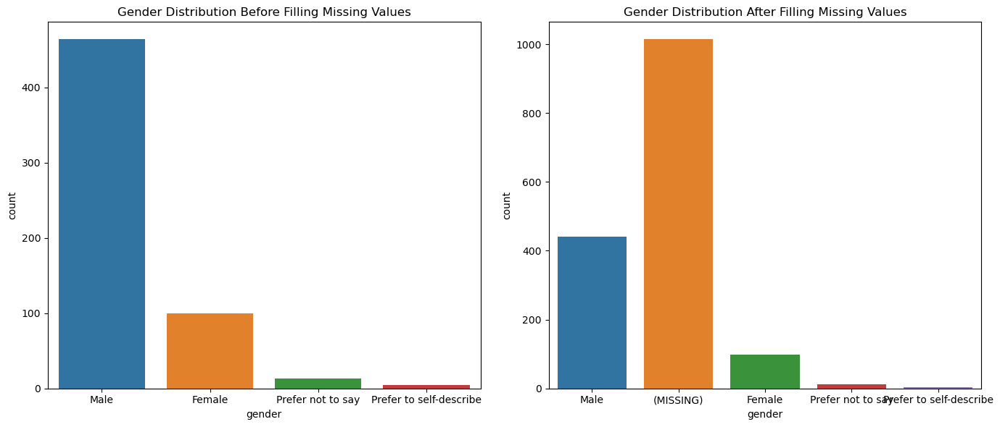

In [643]:
# distributions before and after filling missing values for 'gender'
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.countplot(x='gender', data=df_athletics)
plt.title('Gender Distribution Before Filling Missing Values')
plt.subplot(1, 2, 2)
sns.countplot(x='gender', data=df_athletics_cleaned)
plt.title('Gender Distribution After Filling Missing Values')
plt.tight_layout()
plt.show()


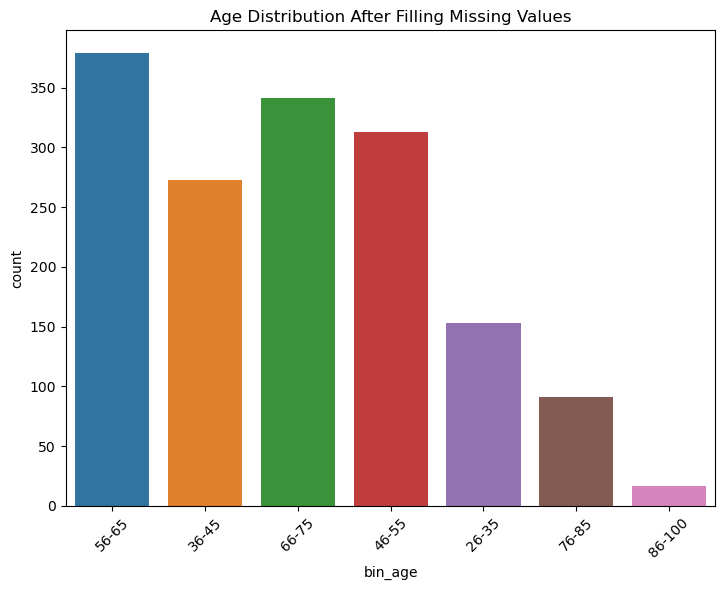

In [644]:
# Plot the distributions before and after filling missing values for 'bin_age'
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 2)
sns.countplot(x='bin_age', data=df_athletics_cleaned)
plt.title('Age Distribution After Filling Missing Values')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [645]:
from sklearn.preprocessing import StandardScaler

In [646]:
athletics_cleaned = df_athletics_cleaned.select_dtypes('number').copy()

In [647]:
x = StandardScaler().fit_transform(athletics_cleaned)

In [648]:
x.shape

(1567, 6)

In [649]:
x.shape == athletics_cleaned.shape

True

## Changing original variable to derived variable as input

In [650]:
df_athletics_final = df_athletics_2.drop(columns=['age', 'offpeak_drivetime', 'peak_drivetime'])

df_athletics_final = df_athletics_final.rename(columns={'bin_age': 'age', 'gender': 'gender_filled'})

In [651]:
df_athletics_final.head()

,accountid,gender_filled,distancemiles,direction,season,purchase_month,purchase_dow,price_type,price_level,ticket_count,price_per_ticket,return_next_season,age
0,1,(MISSING),10.816739,N,2016,Jan-Feb,Mon,A,Lower Panther Red,3,252.0,YES,(MISSING)
1,2,(MISSING),8.140205,NE,2016,Jan-Feb,Wed,A,Other,2,387.0,YES,(MISSING)
2,3,Male,39.413746,S,2016,Mar-Apr,Other,A,Lower Panther Blue,2,252.0,YES,56-65
3,4,(MISSING),18.678836,W,2016,Jan-Feb,Other,A,Lower Panther Red,5,252.0,YES,36-45
4,5,(MISSING),16.487613,W,2016,Jan-Feb,Wed,A,Lower Panther Blue,2,252.0,NO,(MISSING)


## Exploring relationships betwen missing entries (binned age and filled missing gender) with numeric variables

In [652]:
numeric_vars = ['price_per_ticket', 'distancemiles', 'ticket_count']

In [653]:
df_visualization = df_athletics_final.copy()

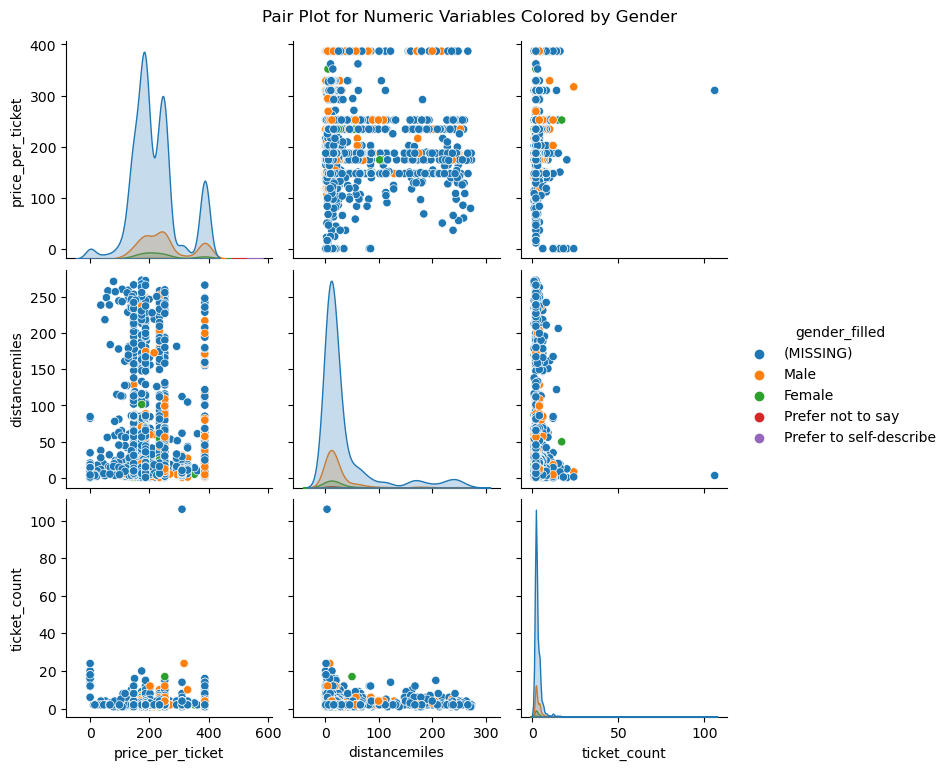

In [654]:
sns.pairplot(df_visualization, hue='gender_filled', vars=numeric_vars)
plt.suptitle('Pair Plot for Numeric Variables Colored by Gender', y=1.02)
plt.show()

We can see that the missing values have helped fill a lot of the missing gaps, making our analysis a bit easier to read. We can also see that males and missing dominate a lot of these plots, which makes it difficult to see the inlfuence of the other gender categories. When looking at all the missing entries on the plot, it is evident to see why dropping the missings would have skewed the results greatly. 

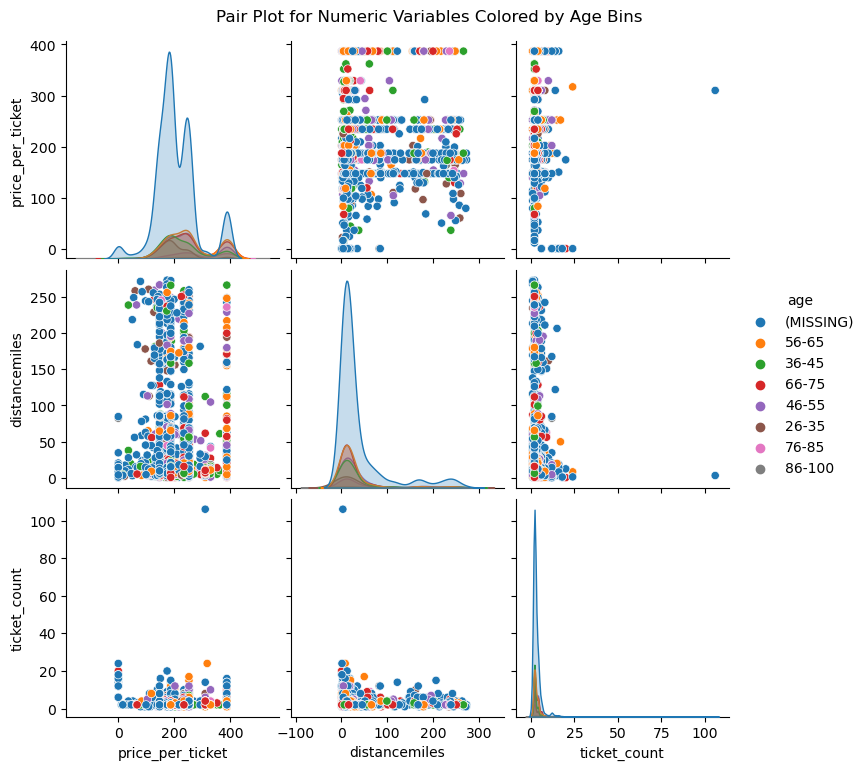

In [655]:
sns.pairplot(df_visualization, hue='age', vars=numeric_vars)
plt.suptitle('Pair Plot for Numeric Variables Colored by Age Bins', y=1.02)
plt.show()

There is no clear pattern in clustering of age bins as we can see the missing values still take up quite a large proportion. But the even spread of age bins shows that it may not be as big of an impact on the numeric variables we are comparing it against. 

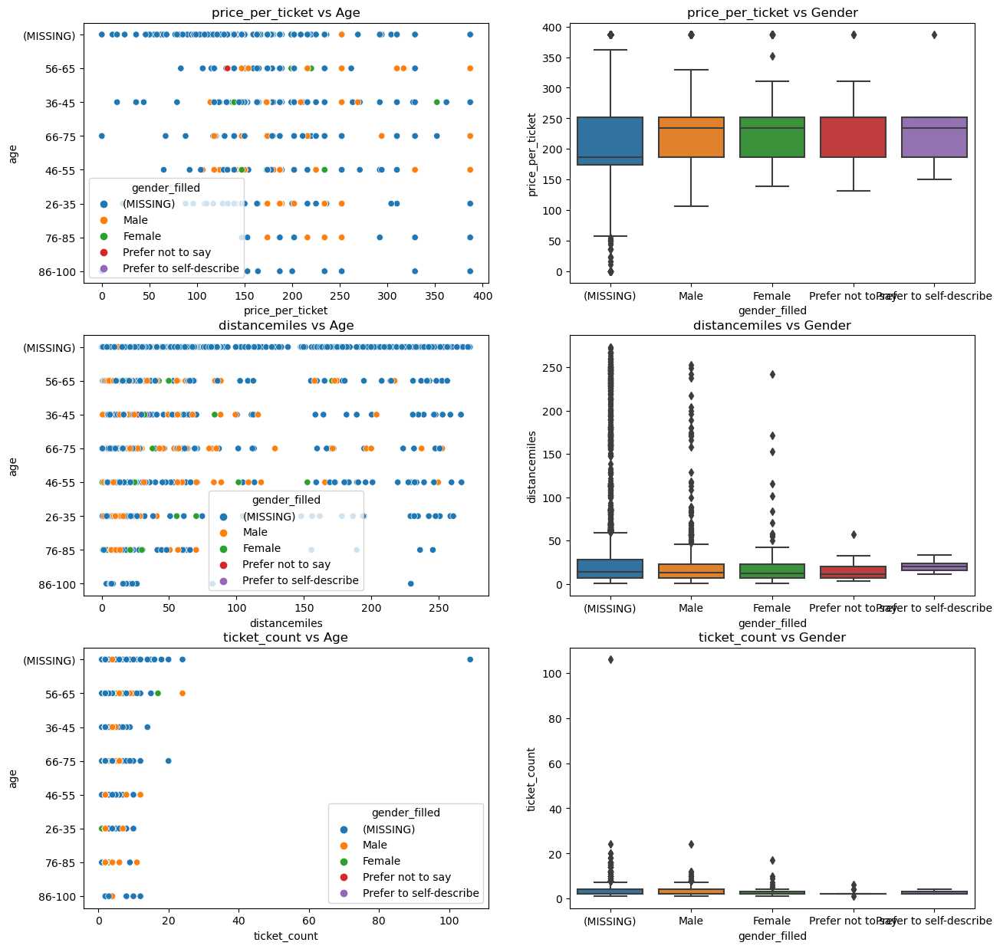

In [656]:
fig, axes = plt.subplots(len(numeric_vars), 2, figsize=(15, 5 * len(numeric_vars)))

for i, var in enumerate(numeric_vars):
    # Scatter plot with age
    sns.scatterplot(data=df_visualization, x=var, y='age', hue='gender_filled', ax=axes[i, 0])
    axes[i, 0].set_title(f'{var} vs Age')
    
    # Scatter plot with gender
    sns.boxplot(data=df_visualization, x='gender_filled', y=var, ax=axes[i, 1])
    axes[i, 1].set_title(f'{var} vs Gender')

plt.show()

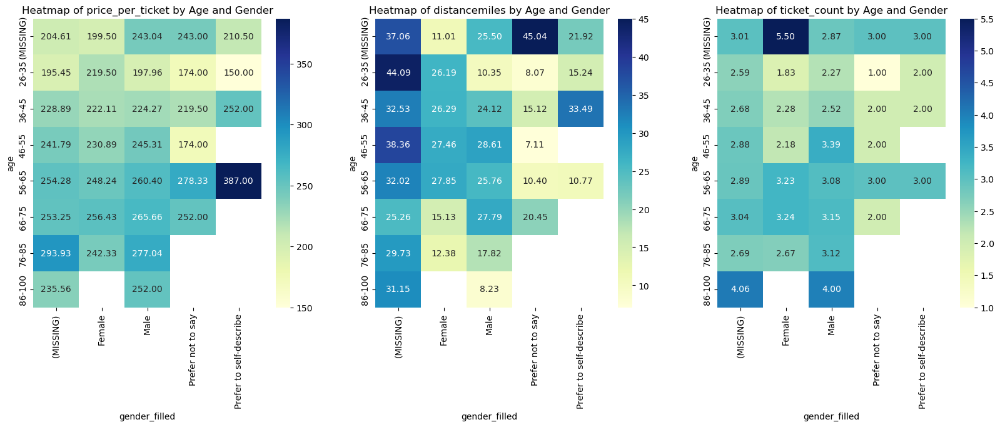

In [657]:
fig, axes = plt.subplots(1, len(numeric_vars), figsize=(20, 6))

for i, var in enumerate(numeric_vars):
    pivot_table = df_visualization.pivot_table(values=var, index='age', columns='gender_filled', aggfunc='mean')
    sns.heatmap(pivot_table, annot=True, fmt=".2f", ax=axes[i], cmap="YlGnBu")
    axes[i].set_title(f'Heatmap of {var} by Age and Gender')
plt.show()

These plots above signify how filling in missing data can change our models and how we view our analysis.

## *Section C- Clustering*

In [658]:
# We have to standardize our continuous variables 
continuous_vars = ['price_per_ticket', 'distancemiles', 'ticket_count']
scaler = StandardScaler()
df_continuous = pd.DataFrame(scaler.fit_transform(df_athletics_2[continuous_vars]), columns=continuous_vars)

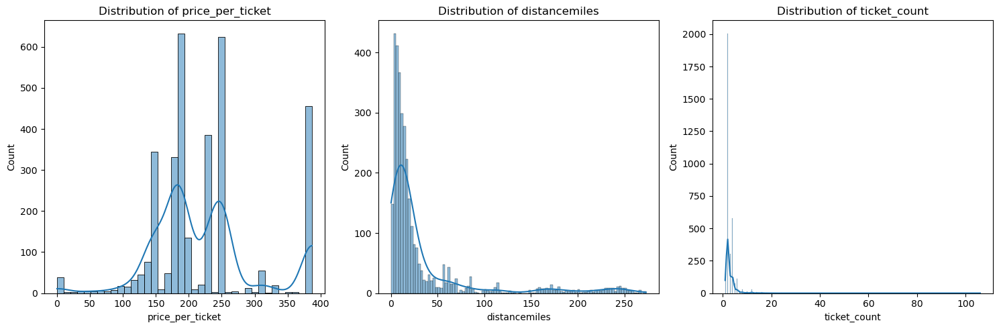

In [659]:
# We need to visualize to see if any continuous variables are gaussian like 
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, var in enumerate(continuous_vars):
    sns.histplot(df_athletics_2[var], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {var}')
plt.tight_layout()
plt.show()

* price_per_ticket shows distinct peaks within the group, so it can be standardized.
* distancemiles is very right skewed so it is not gaussian-like, so it needs log transformation.
* ticketcount is also very right skewed around 0, so it is also not gaussian-like, so it needs log transformation.

In [660]:
# log transformation for distancemiles and ticket_count
df_athletics_2['log_distancemiles'] = np.log1p(df_athletics_2['distancemiles'])
df_athletics_2['log_ticket_count'] = np.log1p(df_athletics_2['ticket_count'])

In [661]:
continuous_vars = ['price_per_ticket', 'log_distancemiles', 'log_ticket_count']

In [662]:
df_continuous_transformed = pd.DataFrame(scaler.fit_transform(df_athletics_2[continuous_vars]), columns=continuous_vars)

#### The new continuous variables after being transformed/standardized

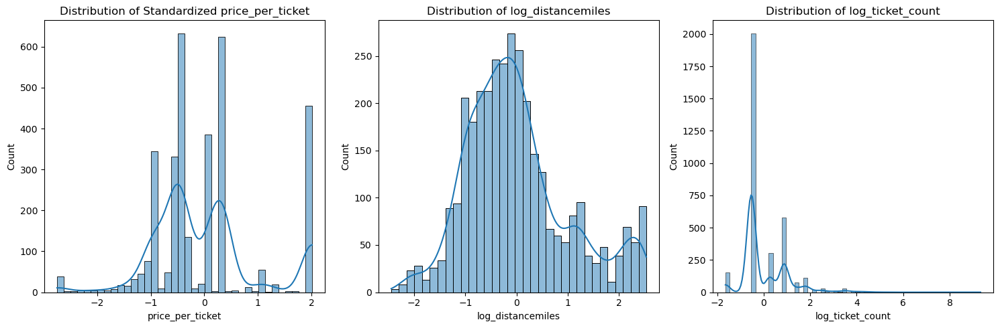

In [663]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
sns.histplot(df_continuous_transformed['price_per_ticket'], kde=True, ax=axes[0])
axes[0].set_title('Distribution of Standardized price_per_ticket')
sns.histplot(df_continuous_transformed['log_distancemiles'], kde=True, ax=axes[1])
axes[1].set_title('Distribution of log_distancemiles')
sns.histplot(df_continuous_transformed['log_ticket_count'], kde=True, ax=axes[2])
axes[2].set_title('Distribution of log_ticket_count')
plt.tight_layout()
plt.show()

### Identifying the optimal number of clusters

In [664]:
from sklearn.cluster import KMeans

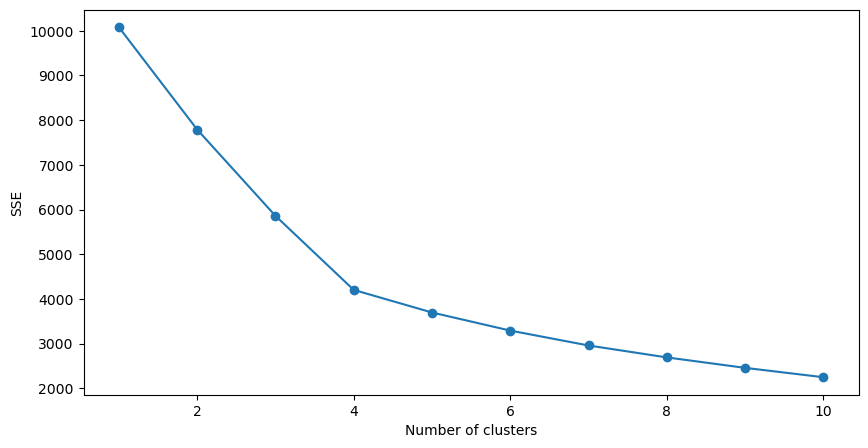

In [665]:
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=121, n_init=25, max_iter=500)
    kmeans.fit(df_continuous_transformed)
    sse.append(kmeans.inertia_)

plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.show()

The optimal number of clusters(elbow) seem to be at 4.

In [666]:
optimal_clusters = 4
kmeans = KMeans(n_clusters=optimal_clusters, random_state=121, n_init=25, max_iter=500)
df_athletics_2['cluster'] = kmeans.fit_predict(df_continuous_transformed)

In [667]:
categorical_vars = ['gender_filled', 'bin_age']
# making sure the gender_filled column is correctly named in the dataframe
if 'gender_filled' not in df_athletics_2.columns:
    df_athletics_2['gender_filled'] = df_athletics_2['gender'].fillna('(MISSING)')

### Comparing clusters with the categorical variables

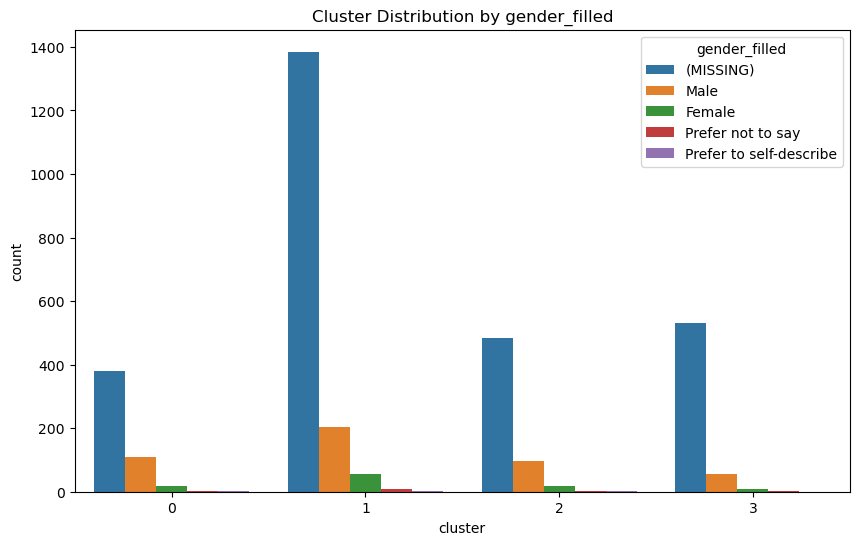

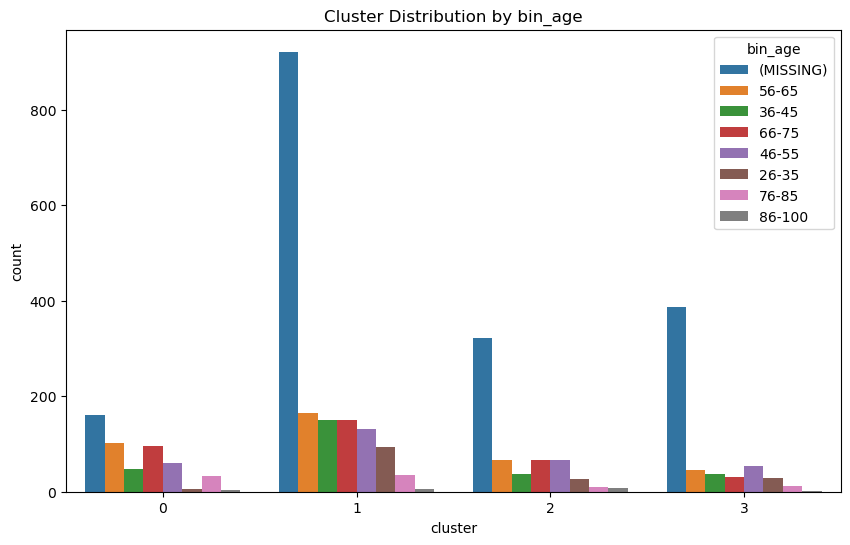

In [668]:
for var in categorical_vars:
    plt.figure(figsize=(10, 6))
    sns.countplot(x='cluster', hue=var, data=df_athletics_2)
    plt.title(f'Cluster Distribution by {var}')
    plt.show()

### Summarizing the continuous inputs associated with each cluster

In [669]:
for cluster in df_athletics_2['cluster'].unique():
    print(f"Cluster {cluster} summary:")
    print(df_athletics_2[df_athletics_2['cluster'] == cluster][continuous_vars].describe())

Cluster 1 summary:
       price_per_ticket  log_distancemiles  log_ticket_count
count       1654.000000        1654.000000       1654.000000
mean         197.209915           2.401388          1.106883
std           43.604255           0.636979          0.145550
min           11.200000           0.357566          0.693147
25%          174.000000           1.932965          1.098612
50%          187.000000           2.453409          1.098612
75%          234.000000           2.894041          1.098612
max          294.000000           3.781259          1.386294
Cluster 0 summary:
       price_per_ticket  log_distancemiles  log_ticket_count
count        509.000000         509.000000        509.000000
mean         375.563851           2.616556          1.279736
std           27.111507           0.888930          0.298063
min          292.000000           0.458219          0.693147
25%          387.000000           2.078265          1.098612
50%          387.000000           2.525450     

### Visualizing the continuous variables by cluster through Boxplots

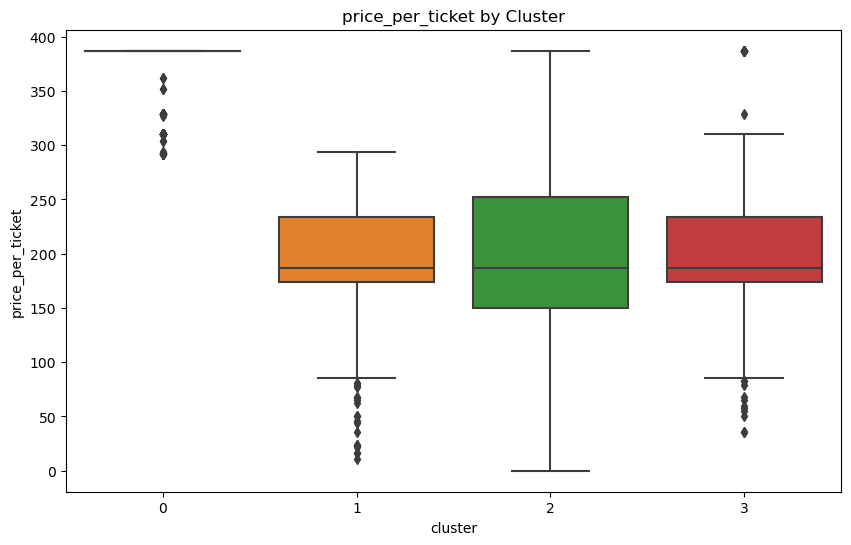

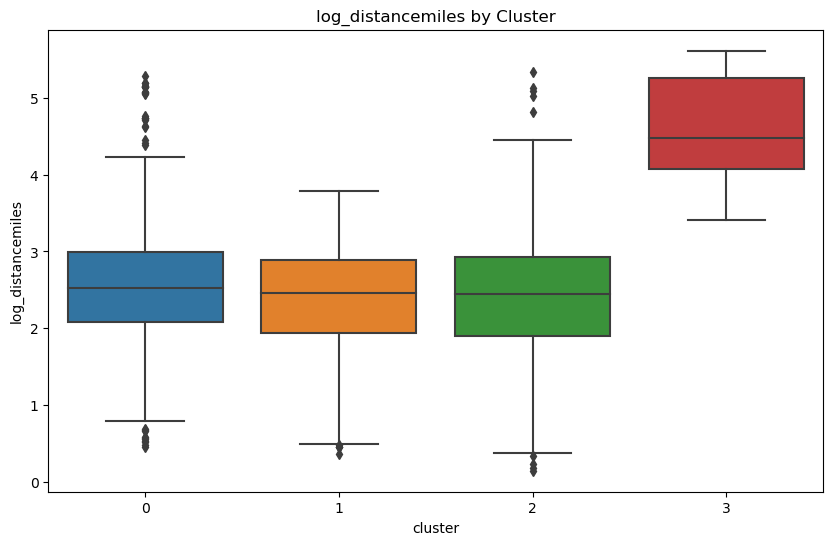

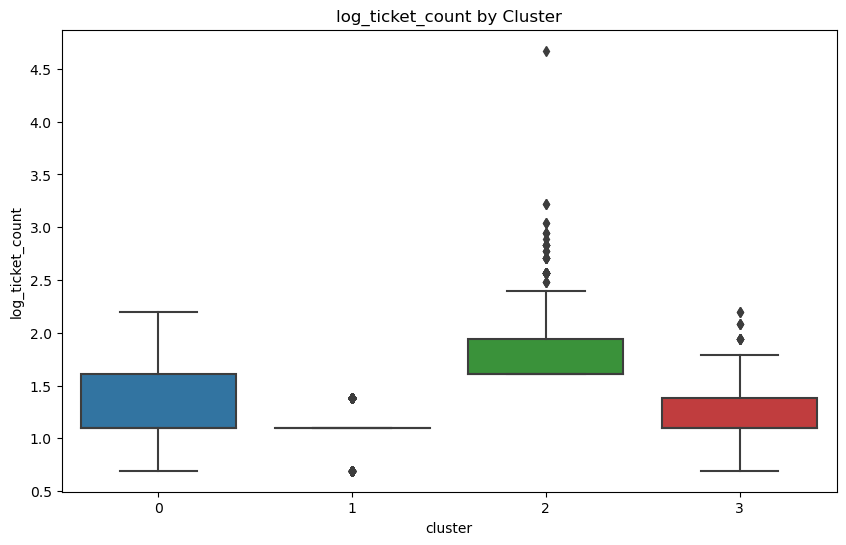

In [670]:
for var in continuous_vars:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='cluster', y=var, data=df_athletics_2)
    plt.title(f'{var} by Cluster')
    plt.show()

### Analyzing the cluster results
#### `Price_per_ticket`:
* Cluster 0 shows the highest price per ticket with very little variance, which means this shows people in this cluster pay the most for their ticket.
* Cluster 1 shows a bit lower ticket price with moderate variance, similar to Cluster 3, but Cluster 3 is slightly more expensive. 
* Cluster 2 shows a mix of both high and low prices. 
#### `log_distancemiles`:
* Cluster 0 people live closest to the stadium and Cluster 1 people live pretty close as well but still a bit further than Cluster 0.
* Cluster 2 people have a good mix of living close to and far from the stadium. 
* Cluster 3 people live the furthest away from the stadium.
#### `log_ticket_count`:
* Cluster 1 shows the least tickets purchased with little variance and CLuster 0 shows few tickets purchased. 
* Cluster 2 shows the most tickets purchased with a lot of variance while cluster 3 shows a medium amount of ticket purchased with less variance than Cluster 2.
#### This shows us that Cluster 0 people pay the most and live closest the stadium while buying fewer number of tickets. 
#### Cluster 1 people pay less for their tickets, live relatively close to the stadium, and buy the least amount of tickets. 
#### Cluster 2 people have a wide variety of how much they pay and how far they live from the stadium, but somehow also purchase the most number of tickets.
#### Cluster 3 people live the furthest and pay middle prices for tickets as well as buying an average number of tickets. 

### Comparing cluster assignments to outcome unique values

Contingency Table:
return_next_season   NO   YES
cluster                      
0                    80   429
1                   580  1074
2                   171   429
3                   294   303


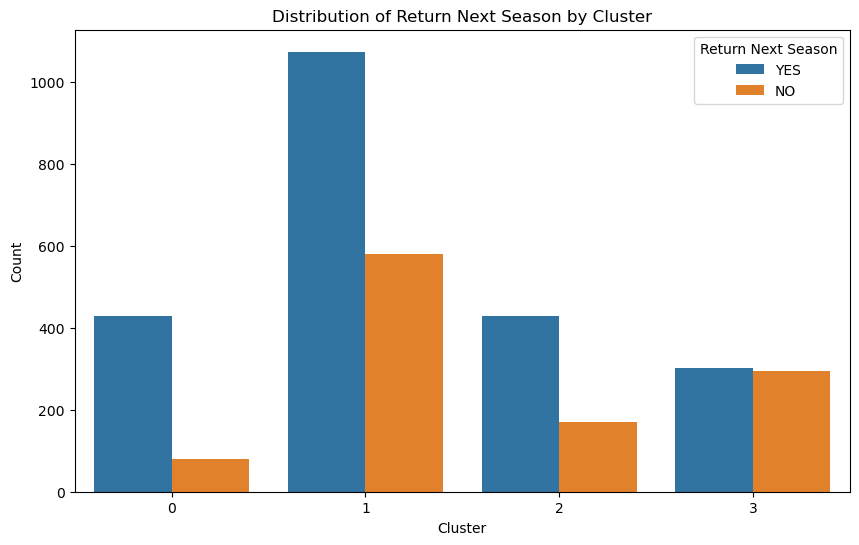

In [671]:
contingency_table = pd.crosstab(df_athletics_2['cluster'], df_athletics_2['return_next_season'])
print("Contingency Table:")
print(contingency_table)

plt.figure(figsize=(10, 6))
sns.countplot(x='cluster', hue='return_next_season', data=df_athletics_2)
plt.title('Distribution of Return Next Season by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Return Next Season', loc='upper right')
plt.show()

### Even though Cluster 1 has the most returning, it still has a large amount of people that chose not to return. But cluster 0 and 2 people seem to be more loyal as it looks like majority of them are returning next season. Cluster 3 seems the most uncertain when it comes to renewing their season tickets. 

### PCA and Cluster

In [672]:
from sklearn.decomposition import PCA

In [673]:
pca = PCA(n_components=2)
pca_scores = pca.fit_transform(df_continuous_transformed)

kmeans_pca = KMeans(n_clusters=optimal_clusters, random_state=121, n_init=25, max_iter=500)
df_athletics_2['cluster_pca'] = kmeans_pca.fit_predict(pca_scores)

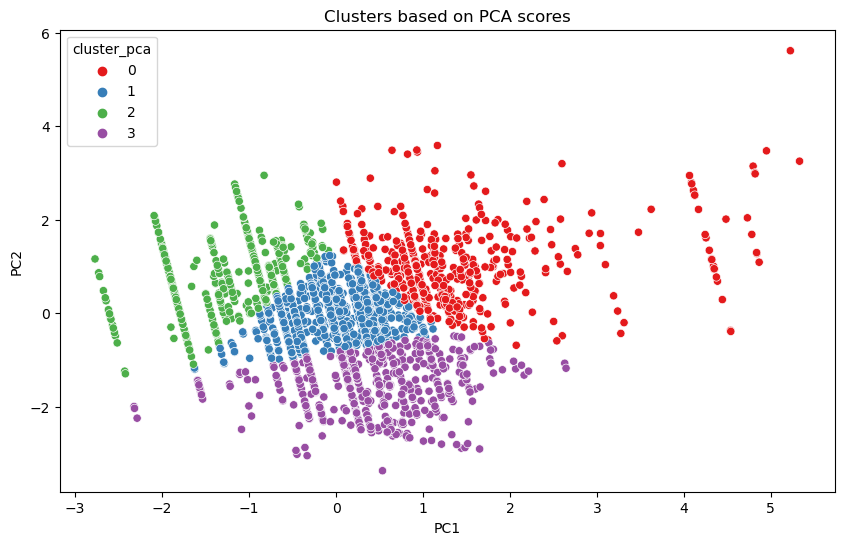

In [674]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_scores[:, 0], y=pca_scores[:, 1], hue=df_athletics_2['cluster_pca'], palette='Set1')
plt.title('Clusters based on PCA scores')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

Since the clusters got more separated, we can see that the PCA has transformed the dimensions while also allowing us to preserve the data, making it easier to analyze/visualize. 

In [675]:
contingency_table = pd.crosstab(df_athletics_2['cluster'], df_athletics_2['cluster_pca'])
contingency_table

cluster_pca,0,1,2,3
cluster,,,,
0,3,53,444,9
1,45,1339,187,83
2,492,106,1,1
3,0,59,0,538


#### This show that Cluster 1 had the most commonalities when doing both methods, which shows that they are consistent and not that easily infuenced. Cluster 3 also shows more consistency from both methods as well. Clusters 0 and 2 are the more variable ones, which means that PCA might have influenced them. 
#### The cluster assignments changed as the ones from the PCA do not match the ones from the original. We see that Cluster 0 and 2 have algined with each other mostly and we see a lot of cluster 1 in cluster 2.

## *Section D. Models: Fitting and Interpretation*

In [676]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [677]:
df_athletics_2['log_distancemiles'] = np.log1p(df_athletics_2['distancemiles'])
df_athletics_2['log_ticket_count'] = np.log1p(df_athletics_2['ticket_count'])

# Standardizing continuous variables
scaler = StandardScaler()
df_athletics_2[['price_per_ticket', 'log_distancemiles', 'log_ticket_count']] = scaler.fit_transform(
    df_athletics_2[['price_per_ticket', 'log_distancemiles', 'log_ticket_count']]
)

# Making sure 'return_next_season' is a numeric column
df_athletics_2['return_next_season'] = df_athletics_2['return_next_season'].astype('category').cat.codes

In [678]:
# Fit the intercept-only model
model_1 = smf.logit('return_next_season ~ 1', data=df_athletics_2).fit(maxiter=1000, tol=1e-6)
print(model_1.summary())

Optimization terminated successfully.
         Current function value: 0.637541
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:     return_next_season   No. Observations:                 3360
Model:                          Logit   Df Residuals:                     3359
Method:                           MLE   Df Model:                            0
Date:                Sat, 03 Aug 2024   Pseudo R-squ.:               7.479e-11
Time:                        18:35:50   Log-Likelihood:                -2142.1
converged:                       True   LL-Null:                       -2142.1
Covariance Type:            nonrobust   LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.6865      0.037     18.778      0.000       0.615       0.758


How many coefficients were estimated?

* 1 coeffient was estimated (intercept)

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

* 1 coefficent (the intercept) is statistically significant because the p value is 0.000

WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

* Intercept is positive (0.6865) and statistically significant with a p-value of 0.000

Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

* Since there is only one coefficent, the intercept has the highest magnitude

In [679]:
# Fitting the categorical inputs with additive features model
model_2 = smf.logit('return_next_season ~ gender_filled + bin_age', data=df_athletics_2).fit(maxiter=1000, tol=1e-6)
print(model_2.summary())

         Current function value: 0.557682
         Iterations: 1000
                           Logit Regression Results                           
Dep. Variable:     return_next_season   No. Observations:                 3360
Model:                          Logit   Df Residuals:                     3348
Method:                           MLE   Df Model:                           11
Date:                Sat, 03 Aug 2024   Pseudo R-squ.:                  0.1253
Time:                        18:35:51   Log-Likelihood:                -1873.8
converged:                      False   LL-Null:                       -2142.1
Covariance Type:            nonrobust   LLR p-value:                4.851e-108
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
Intercept                                    0.0866      0.048      1.822      0.0

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


How many coefficients were estimated?

* 12 coeffients were estimated (intercept and 11 categorical variables)

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

* 9 coefficent are statistically significant using p value of 0.05

WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

* Intercept: Not significant (p=0.068)
* gender_filled[T.Female]: Positive (2.0963), significant (p=0.000)
* gender_filled[T.Male]: Positive (1.9389), significant (p=0.000)
* gender_filled[T.Prefer not to say]: Not significant (p=0.110)
* gender_filled[T.Prefer to self-describe]: Not significant (p=1.000)
* bin_age[T.26-35]: Not significant (p=0.536)
* bin_age[T.36-45]: Positive (0.7852), significant (p=0.000)
* bin_age[T.46-55]: Positive (1.0620), significant (p=0.000)
* bin_age[T.56-65]: Positive (1.0481), significant (p=0.000)
* bin_age[T.66-75]: Positive (1.4465), significant (p=0.000)
* bin_age[T.76-85]: Positive (2.6449), significant (p=0.000)
* bin_age[T.86-100]: Positive (1.8707), significant (p=0.013)

Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

* bin_age[T.76-85]: Coefficient = 2.6449
* gender_filled[T.Female]: Coefficient = 2.0963

In [680]:
# Fitting the continuous inputs with linear additive features model
model_3 = smf.logit('return_next_season ~ price_per_ticket + log_distancemiles + log_ticket_count', data=df_athletics_2).fit(maxiter=1000, tol=1e-6)
print(model_3.summary())

Optimization terminated successfully.
         Current function value: 0.592420
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:     return_next_season   No. Observations:                 3360
Model:                          Logit   Df Residuals:                     3356
Method:                           MLE   Df Model:                            3
Date:                Sat, 03 Aug 2024   Pseudo R-squ.:                 0.07077
Time:                        18:35:51   Log-Likelihood:                -1990.5
converged:                       True   LL-Null:                       -2142.1
Covariance Type:            nonrobust   LLR p-value:                 2.010e-65
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             0.7729      0.040     19.485      0.000       0.695       0.851
price_pe

How many coefficients were estimated?

* 4 coeffients were estimated (intercept and 3 continuous variables)

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

* ALl 4 coefficients are statistically significant using p value of 0.05

WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

* Intercept: Positive (0.7729), significant (p=0.000)
* price_per_ticket: Positive (0.6119), significant (p=0.000)
* log_distancemiles: Negative (-0.2799), significant (p=0.000)
* log_ticket_count: Positive (0.2546), significant (p=0.000)

Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

* Intercept: Coefficient = 0.7729
* price_per_ticket: Coefficient = 0.6119

In [681]:
# Fitting the all inputs with linear additive features model
model_4 = smf.logit('return_next_season ~ gender_filled + bin_age + price_per_ticket + log_distancemiles + log_ticket_count', data=df_athletics_2).fit(maxiter=1000, tol=1e-6)
print(model_4.summary())

         Current function value: 0.533493
         Iterations: 1000
                           Logit Regression Results                           
Dep. Variable:     return_next_season   No. Observations:                 3360
Model:                          Logit   Df Residuals:                     3345
Method:                           MLE   Df Model:                           14
Date:                Sat, 03 Aug 2024   Pseudo R-squ.:                  0.1632
Time:                        18:35:52   Log-Likelihood:                -1792.5
converged:                      False   LL-Null:                       -2142.1
Covariance Type:            nonrobust   LLR p-value:                3.824e-140
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
Intercept                                    0.2218      0.051      4.358      0.0

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


How many coefficients were estimated?

* 15 coeffients were estimated (intercept and 14 features)

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

* 13 coefficients are statistically significant using p value of 0.05

WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

* Intercept: Positive (0.2218), significant (p=0.000)
* gender_filled[T.Female]: Positive (2.1271), significant (p=0.000)
* gender_filled[T.Male]: Positive (1.8982), significant (p=0.000)
* bin_age[T.36-45]: Positive (0.7013), significant (p=0.000)
* bin_age[T.46-55]: Positive (0.9145), significant (p=0.000)
* bin_age[T.56-65]: Positive (0.8107), significant (p=0.000)
* bin_age[T.66-75]: Positive (1.1857), significant (p=0.000)
* bin_age[T.76-85]: Positive (2.3076), significant (p=0.000)
* bin_age[T.86-100]: Positive (1.6846), significant (p=0.030)
* price_per_ticket: Positive (0.4453), significant (p=0.000)
* log_distancemiles: Negative (-0.2504), significant (p=0.000)
* log_ticket_count: Positive (0.2345), significant (p=0.000)

Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

* gender_filled[T.Female]: Coefficient = 2.1271
* gender_filled[T.Male]: Coefficient = 1.8982

In [682]:
# Fitting the continuous inputs with linear main effect and pair-wise interactions model
model_5 = smf.logit('return_next_season ~ price_per_ticket * log_distancemiles * log_ticket_count', data=df_athletics_2).fit(maxiter=1000, tol=1e-6)
print(model_5.summary())

Optimization terminated successfully.
         Current function value: 0.588891
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:     return_next_season   No. Observations:                 3360
Model:                          Logit   Df Residuals:                     3352
Method:                           MLE   Df Model:                            7
Date:                Sat, 03 Aug 2024   Pseudo R-squ.:                 0.07631
Time:                        18:35:52   Log-Likelihood:                -1978.7
converged:                       True   LL-Null:                       -2142.1
Covariance Type:            nonrobust   LLR p-value:                 1.065e-66
                                                          coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------
Intercept                 

How many coefficients were estimated?

* 8 coeffients were estimated (intercept and 7 features)

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

* 5 coefficients are statistically significant using p value of 0.05

WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

* Intercept: Positive (0.7693), significant (p=0.000)
* price_per_ticket: Positive (0.6490), significant (p=0.000)
* log_distancemiles: Negative (-0.2300), significant (p=0.000)
* price_per_ticket:log_distancemiles: Positive (0.1472), significant (p=0.003)
* log_ticket_count: Positive (0.1930), significant (p=0.000)
* price_per_ticket:log_ticket_count Negative (-0.0867), significant (p=0.019)

Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

* Intercept: Coefficient = 0.7693
* price_per_ticket: Coefficient = 0.6490

In [683]:
# Fitting the interact the categorical inputs with the continuous inputs model
# simplified model since there were singular matrix issues so I had to remove some interactions
model_6_simplified = smf.logit('return_next_season ~ gender_filled + bin_age + price_per_ticket + log_distancemiles + log_ticket_count + gender_filled:price_per_ticket + bin_age:log_distancemiles', data=df_athletics_2).fit(maxiter=1000, tol=1e-6)
print(model_6_simplified.summary())

         Current function value: 0.531622
         Iterations: 1000
                           Logit Regression Results                           
Dep. Variable:     return_next_season   No. Observations:                 3360
Model:                          Logit   Df Residuals:                     3334
Method:                           MLE   Df Model:                           25
Date:                Sat, 03 Aug 2024   Pseudo R-squ.:                  0.1661
Time:                        18:35:53   Log-Likelihood:                -1786.2
converged:                      False   LL-Null:                       -2142.1
Covariance Type:            nonrobust   LLR p-value:                4.552e-134
                                                                coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------------
Intercept                                       

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


How many coefficients were estimated?

* 26 coeffients were estimated (intercept and 25 features)

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

* 13 coefficients are statistically significant using p value of 0.05

WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

* Intercept: Positive (0.2263), significant (p=0.000)
* gender_filled[T.Female]: Positive (2.7669), significant (p=0.002)
* gender_filled[T.Male]: Positive (1.9137), significant (p=0.000)
* bin_age[T.36-45]: Positive (0.7035), significant (p=0.000)
* bin_age[T.46-55]: Positive (0.8804), significant (p=0.000)
* bin_age[T.56-65]: Positive (0.8019), significant (p=0.000)
* bin_age[T.66-75]: Positive (1.1814), significant (p=0.000)
* bin_age[T.76-85]: Positive (2.4961), significant (p=0.000)
* bin_age[T.86-100]: Positive (1.6123), significant (p=0.036)
* price_per_ticket: Positive (0.4512), significant (p=0.000)
* log_distancemiles: Negative (-0.2950), significant (p=0.000)
* log_ticket_count: Positive (0.2354), significant (p=0.000)


Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

* gender_filled[T.Female]: Coefficient = 2.7669
* bin_age[T.76-85]: Coefficient = 2.4961

### Additional Formulations

In [684]:
# Trying a polynomial features model
df_athletics_2['price_per_ticket_squared'] = df_athletics_2['price_per_ticket'] ** 2
model_7 = smf.logit('return_next_season ~ gender_filled + bin_age + price_per_ticket + price_per_ticket_squared + log_distancemiles + log_ticket_count', data=df_athletics_2).fit(maxiter=1000, tol=1e-6)
print(model_7.summary())

         Current function value: 0.533449
         Iterations: 1000
                           Logit Regression Results                           
Dep. Variable:     return_next_season   No. Observations:                 3360
Model:                          Logit   Df Residuals:                     3344
Method:                           MLE   Df Model:                           15
Date:                Sat, 03 Aug 2024   Pseudo R-squ.:                  0.1633
Time:                        18:35:53   Log-Likelihood:                -1792.4
converged:                      False   LL-Null:                       -2142.1
Covariance Type:            nonrobust   LLR p-value:                2.382e-139
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
Intercept                                    0.2069      0.058      3.582      0.0

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


How many coefficients were estimated?

* 16 coeffients were estimated (intercept and 15 features)

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

* 12 coefficients are statistically significant using p value of 0.05

WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

* Intercept: Positive (0.2069), significant (p=0.000)
* gender_filled[T.Female]: Positive (2.1321), significant (p=0.000)
* gender_filled[T.Male]: Positive (1.9011), significant (p=0.000)
* bin_age[T.36-45]: Positive (0.7002), significant (p=0.000)
* bin_age[T.46-55]: Positive (0.9165), significant (p=0.000)
* bin_age[T.56-65]: Positive (0.8098), significant (p=0.000)
* bin_age[T.66-75]: Positive (1.1849), significant (p=0.000)
* bin_age[T.76-85]: Positive (2.3045), significant (p=0.000)
* bin_age[T.86-100]: Positive (1.6790), significant (p=0.030)
* price_per_ticket: Positive (0.4419), significant (p=0.000)
* log_distancemiles: Negative (-0.2484), significant (p=0.000)
* log_ticket_count: Positive (0.2275), significant (p=0.000)


Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

* gender_filled[T.Female]: Coefficient = 2.1321
* bin_age[T.76-85]: Coefficient = 2.3045

In [685]:
# Trying a SIN() function model 
# I had to remove several predictors and simplify this model because it was causing a singular matrix error
# had to create a sin_log_ticket_count variable
df_athletics_2['sin_log_ticket_count'] = np.sin(df_athletics_2['log_ticket_count'])

model_8_simplified = smf.logit('return_next_season ~ gender_filled + bin_age + sin_log_ticket_count + log_distancemiles', data=df_athletics_2).fit(maxiter=1000, tol=1e-6)
print(model_8_simplified.summary())

         Current function value: 0.550250
         Iterations: 1000
                           Logit Regression Results                           
Dep. Variable:     return_next_season   No. Observations:                 3360
Model:                          Logit   Df Residuals:                     3346
Method:                           MLE   Df Model:                           13
Date:                Sat, 03 Aug 2024   Pseudo R-squ.:                  0.1369
Time:                        18:35:54   Log-Likelihood:                -1848.8
converged:                      False   LL-Null:                       -2142.1
Covariance Type:            nonrobust   LLR p-value:                5.530e-117
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
Intercept                                    0.1320      0.049      2.669      0.0

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


How many coefficients were estimated?

* 13 coeffients were estimated (intercept and 12 features)

How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

* 11 coefficients are statistically significant using p value of 0.05

WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?

* Intercept: Positive (0.1320), significant (p=0.008)
* gender_filled[T.Female]: Positive (2.1104), significant (p=0.000)
* gender_filled[T.Male]: Positive (1.9208), significant (p=0.000)
* bin_age[T.36-45]: Positive (0.7647), significant (p=0.000)
* bin_age[T.46-55]: Positive (1.0663), significant (p=0.000)
* bin_age[T.56-65]: Positive (1.0242), significant (p=0.000)
* bin_age[T.66-75]: Positive (1.3824), significant (p=0.000)
* bin_age[T.76-85]: Positive (2.6271), significant (p=0.000)
* bin_age[T.86-100]: Positive (1.8523), significant (p=0.015)
* sin_log_ticket_count: Positive (0.1562), significant (p=0.022)
* log_distancemiles: Negative (-0.2607), significant (p=0.000)


Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

* bin_age[T.76-85]: Coefficient = 2.6271
* gender_filled[T.Female]: Coefficient = 2.1104

Now I will evaluate each model by examining confusion matrix, accuracy, sensitivity, specificity, FPR, ROC curve, AUC.

Confusion Matrix:
[[   0 1125]
 [   0 2235]]
Accuracy: 0.6652, Sensitivity: 1.0000, Specificity: 0.0000, AUC: 0.5000


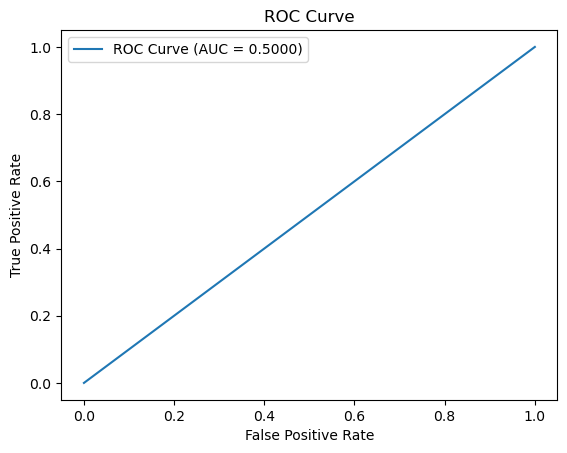

Evaluating Model: Intercept-Only
Confusion Matrix:
[[   0 1125]
 [   0 2235]]
Accuracy: 0.6652, Sensitivity: 1.0000, Specificity: 0.0000, AUC: 0.5000


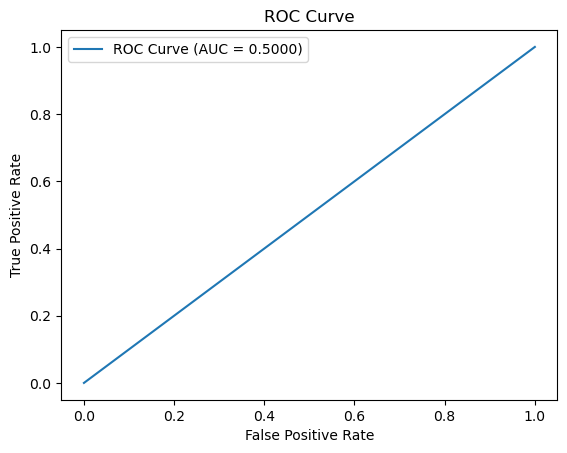



Evaluating Model: Categorical Inputs
Confusion Matrix:
[[   0 1125]
 [   0 2235]]
Accuracy: 0.6652, Sensitivity: 1.0000, Specificity: 0.0000, AUC: 0.7048


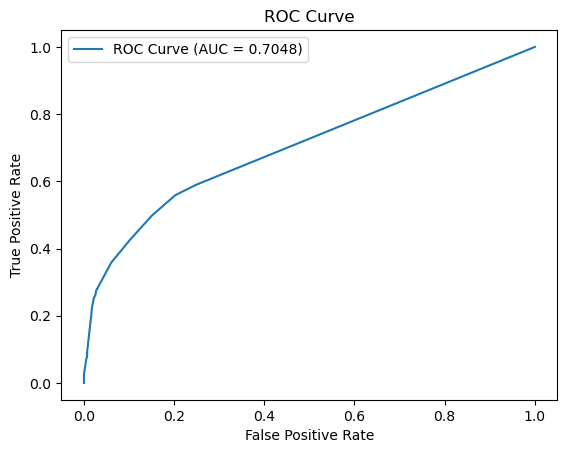



Evaluating Model: Continuous Inputs
Confusion Matrix:
[[ 220  905]
 [ 140 2095]]
Accuracy: 0.6890, Sensitivity: 0.9374, Specificity: 0.1956, AUC: 0.6819


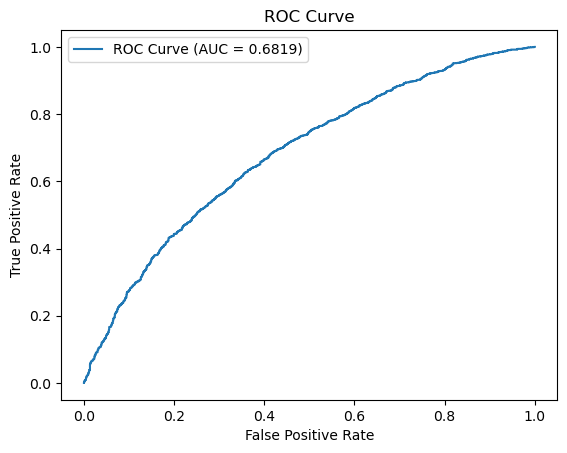



Evaluating Model: All Inputs
Confusion Matrix:
[[ 507  618]
 [ 367 1868]]
Accuracy: 0.7068, Sensitivity: 0.8358, Specificity: 0.4507, AUC: 0.7624


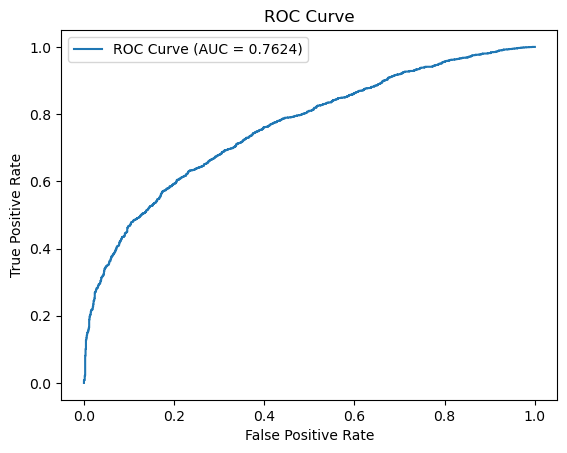



Evaluating Model: Interactions Continuous
Confusion Matrix:
[[ 253  872]
 [ 156 2079]]
Accuracy: 0.6940, Sensitivity: 0.9302, Specificity: 0.2249, AUC: 0.6876


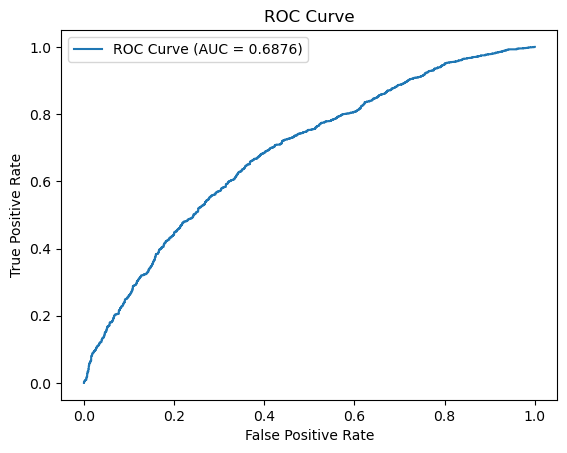



Evaluating Model: Interactions Categorical & Continuous
Confusion Matrix:
[[ 500  625]
 [ 363 1872]]
Accuracy: 0.7060, Sensitivity: 0.8376, Specificity: 0.4444, AUC: 0.7627


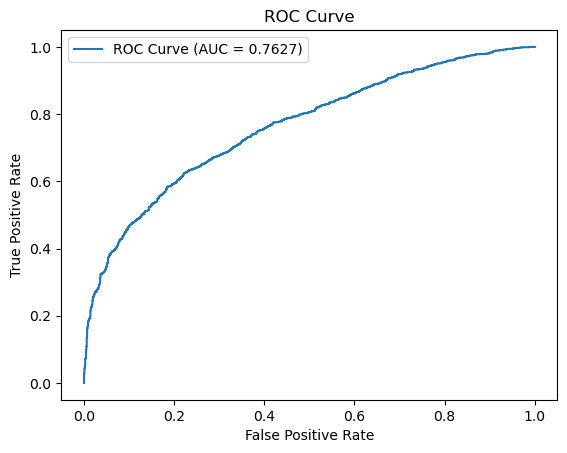



Evaluating Model: Polynomial Features
Confusion Matrix:
[[ 508  617]
 [ 366 1869]]
Accuracy: 0.7074, Sensitivity: 0.8362, Specificity: 0.4516, AUC: 0.7629


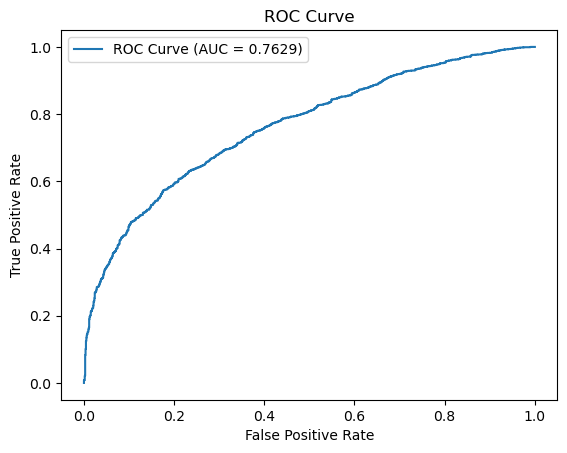



Evaluating Model: Cyclical Features
Confusion Matrix:
[[ 325  800]
 [ 264 1971]]
Accuracy: 0.6833, Sensitivity: 0.8819, Specificity: 0.2889, AUC: 0.7318


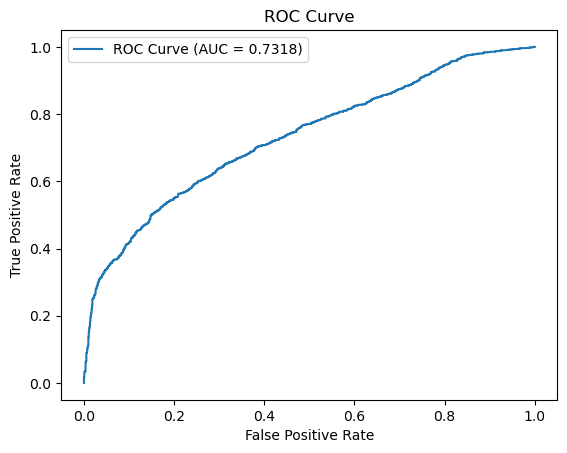

In [686]:
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score, accuracy_score
import matplotlib.pyplot as plt

def evaluate_model(result, X, y):
    y_pred_prob = result.predict(sm.add_constant(X))
    y_pred = (y_pred_prob >= 0.5).astype(int)
    cm = confusion_matrix(y, y_pred)
    fpr, tpr, thresholds = roc_curve(y, y_pred_prob)
    auc = roc_auc_score(y, y_pred_prob)
    accuracy = accuracy_score(y, y_pred)
    sensitivity = cm[1, 1] / (cm[1, 1] + cm[1, 0])
    specificity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
    print(f"Confusion Matrix:\n{cm}")
    print(f"Accuracy: {accuracy:.4f}, Sensitivity: {sensitivity:.4f}, Specificity: {specificity:.4f}, AUC: {auc:.4f}")
    plt.figure()
    plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {auc:.4f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.show()

# Example evaluation for one of the models
evaluate_model(model_1, df_athletics_2, df_athletics_2['return_next_season'])

# Evaluate all models
models = [model_1, model_2, model_3, model_4, model_5, model_6_simplified, model_7, model_8_simplified]
model_names = ['Intercept-Only', 'Categorical Inputs', 'Continuous Inputs', 'All Inputs', 'Interactions Continuous', 'Interactions Categorical & Continuous', 'Polynomial Features', 'Cyclical Features']

for model, name in zip(models, model_names):
    print(f"Evaluating Model: {name}")
    evaluate_model(model, df_athletics_2, df_athletics_2['return_next_season'])
    print("\n")

### `Model 7: Interacting categorical inputs with linear and polynomial features` has the best performance on the training set because it has the highest ROC AUC (0.7586) . When considering Accuracy vs ROC AUC, the best model is still Model 7 beucase its accuracy is 0.7074, which is the highest of all the models. Model 7 is much better than the intercept only model because it has a higher accuracy and a higher ROC AUC value.The number of coefficients in Model 7 is 15.

## *Section E. Models: Predictions*

Model with all inputs and linear additive features: Model 4 

Best model on the training set: Model 7 (as explained above)

The 3 most important inputs:
* Continuous Input: price_per_ticket
* Categorical Input: gender_filled
* Categorical Input: bin_age

In [687]:
df_athletics_2['gender_filled'] = df_athletics_2['gender_filled'].astype('category')
df_athletics_2['bin_age'] = df_athletics_2['bin_age'].astype('category')

# grid for visualization
price_per_ticket_range = np.linspace(df_athletics_2['price_per_ticket'].min(), df_athletics_2['price_per_ticket'].max(), 101)
gender_filled_values = df_athletics_2['gender_filled'].cat.categories
bin_age_values = df_athletics_2['bin_age'].cat.categories

In [688]:
log_distancemiles_mean = df_athletics_2['log_distancemiles'].mean()
log_ticket_count_mean = df_athletics_2['log_ticket_count'].mean()

In [689]:
#new dataset for visualizing
visualization_grid = pd.DataFrame([
    (price, gender, age, log_distancemiles_mean, log_ticket_count_mean)
    for price in price_per_ticket_range
    for gender in gender_filled_values
    for age in bin_age_values
], columns=['price_per_ticket', 'gender_filled', 'bin_age', 'log_distancemiles', 'log_ticket_count'])

In [690]:
# squared term so we can make sure its compatible with the model formula
visualization_grid['price_per_ticket_squared'] = visualization_grid['price_per_ticket'] ** 2

# predictions
visualization_grid['event_prob_model_4'] = model_4.predict(visualization_grid)
visualization_grid['event_prob_model_7'] = model_7.predict(visualization_grid)


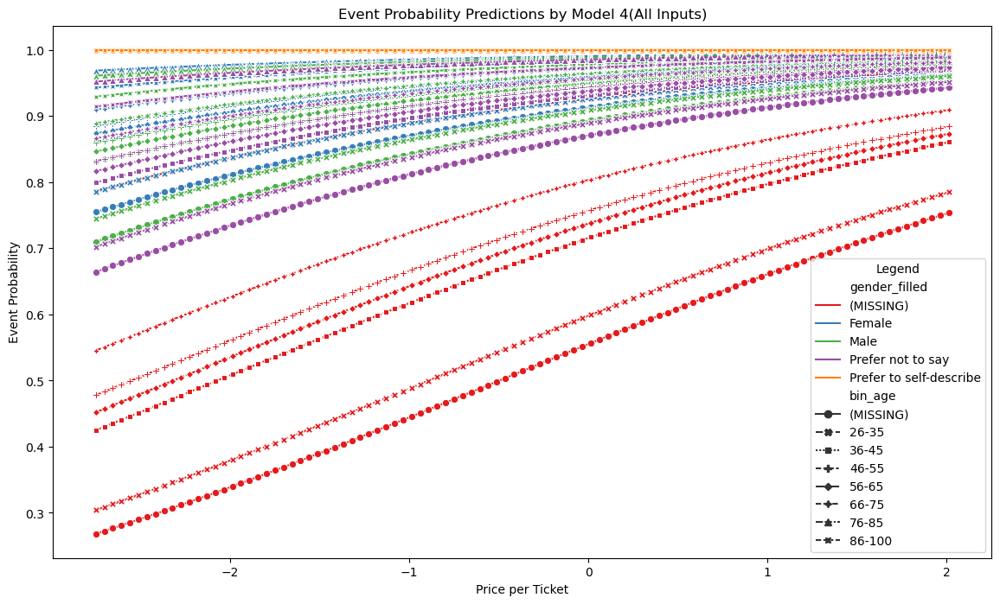

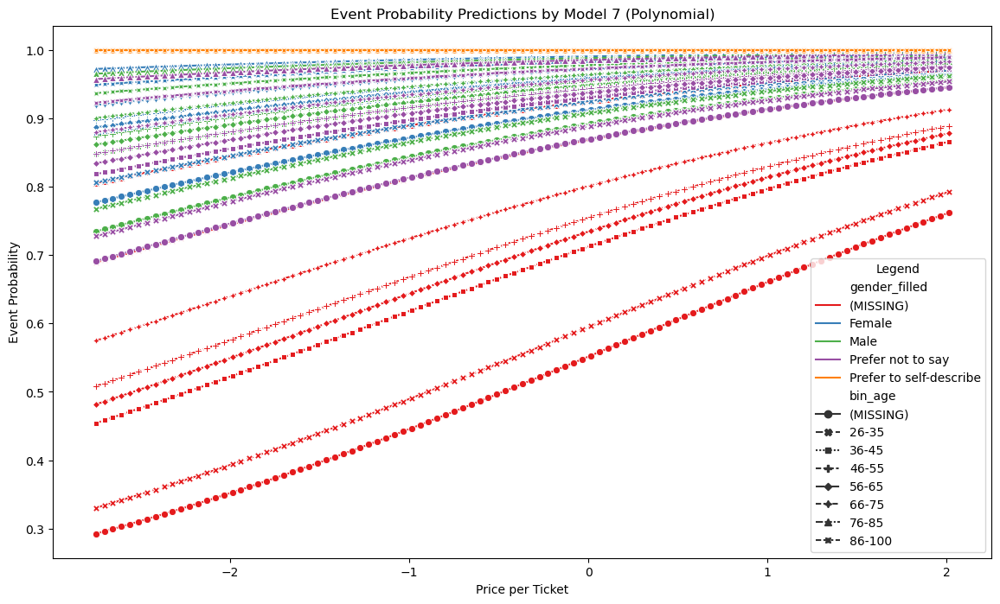

In [691]:
plt.figure(figsize=(14, 8))
sns.lineplot(data=visualization_grid, x='price_per_ticket', y='event_prob_model_4', hue='gender_filled', style='bin_age', palette='Set1', markers=True)
plt.title('Event Probability Predictions by Model 4(All Inputs)')
plt.xlabel('Price per Ticket')
plt.ylabel('Event Probability')
plt.legend(title='Legend')
plt.show()

plt.figure(figsize=(14, 8))
sns.lineplot(data=visualization_grid, x='price_per_ticket', y='event_prob_model_7', hue='gender_filled', style='bin_age', palette='Set1', markers=True)
plt.title('Event Probability Predictions by Model 7 (Polynomial)')
plt.xlabel('Price per Ticket')
plt.ylabel('Event Probability')
plt.legend(title='Legend')
plt.show()

### Trends in Model 4: All Inputs and Linear Additive Features:
* Event probability increases with the price_per_ticket across gender_filled and bin_age
* Higher prices are associated with higher probabilities of returning next season
* Probabilities are higher for male and females compared to prefer not to say/prefer to self-describe
* Male and females are showing similat trends
* Younger age groups are showing slightly lower probabilities compared to older age groups
### Trends in Model 7: Polynomial Features:
* This polynomial model shows a slight curve, but it still follows the general increasing trend 
* Event probability increases with the price_per_ticket across gender_filled and bin_age
* Older age groups show a higher chance of returning next season
* There is a consistency acros all age groups, but with minor variations 

#### Both models show that higher ticket prices are associated with higher probability of coming back next season. It also shows us that Model 4 does a good enough job to capture the trend compared to the best model (model 7). Older male and females also show a higher probability of returning. This could be related to maybe the people that can afford better seating(which increases price per ticket) and are more financially stable (middle aged/older vs. younger students) are more likely to spend money on purchasing season tickets. 

## *Section F. Models: Performance and Validation*

#### Models for cross validation:
* Best model: Model 7-Polynomial
* Simple model: Model 3-Continuous Inputs with Linear Additive Features
* Medium to High Complexity: Model 4-All Inputs

In [692]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

In [693]:
def cross_val_auc_sklearn(model, X, y, folds=5):
    kf = KFold(n_splits=folds, shuffle=True, random_state=42)
    auc_scores = cross_val_score(model, X, y, cv=kf, scoring='roc_auc', error_score='raise')
    return auc_scores

In [694]:
df_athletics_2 = df_athletics_2.apply(lambda x: x.replace('(MISSING)', np.nan) if x.dtype == 'object' else x)
X = df_athletics_2.drop(columns=['return_next_season'])
y = df_athletics_2['return_next_season']

In [695]:
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = X.select_dtypes(include=['category', 'object']).columns.tolist()

In [696]:
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore'))
])

In [697]:
preprocessor_all = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [698]:
preprocessor_numeric = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ])

In [699]:
# Defining models
models = {
    "Model 3 (Continuous Inputs)": Pipeline([
        ('preprocessor', preprocessor_numeric),
        ('logreg', LogisticRegression(max_iter=1000))
    ]),
    "Model 4 (All Inputs)": Pipeline([
        ('preprocessor', preprocessor_all),
        ('logreg', LogisticRegression(max_iter=1000))
    ]),
    "Model 7 (Polynomial Features)": Pipeline([
        ('preprocessor', preprocessor_all),
        ('poly', PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)),
        ('logreg', LogisticRegression(max_iter=1000))
    ])
}

In [700]:
# Performing cross-validation
results = {}

for model_name, model in models.items():
    try:
        auc_scores = cross_val_auc_sklearn(model, X, y)
        results[model_name] = auc_scores
    except Exception as e:
        print(f"Error in {model_name}: {e}")
        results[model_name] = np.array([np.nan])


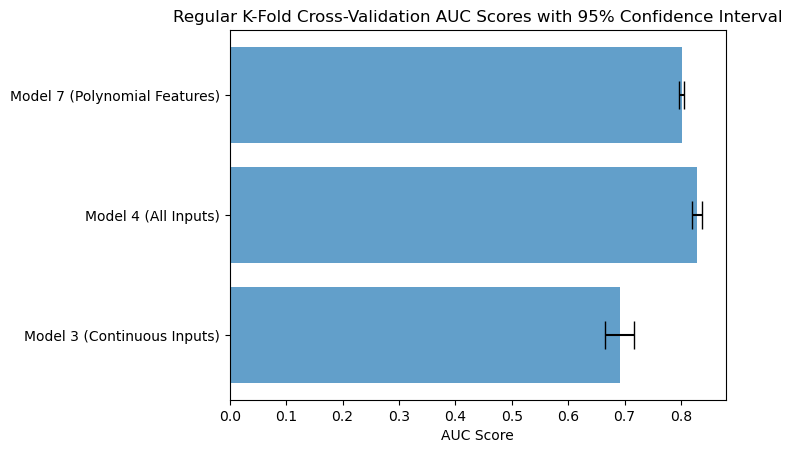

In [701]:
# Visualizing cross-validation results
fig, ax = plt.subplots()
model_names = list(results.keys())
auc_means = [np.nanmean(results[name]) for name in model_names]
auc_stds = [np.nanstd(results[name]) for name in model_names]

ax.barh(model_names, auc_means, xerr=auc_stds, align='center', alpha=0.7, ecolor='black', capsize=10)
ax.set_xlabel('AUC Score')
ax.set_title('Regular K-Fold Cross-Validation AUC Scores with 95% Confidence Interval')
plt.show()

### Additional cross-validation methods

#### Here I tried Stratified K-Fold Cross-Validation

In [702]:
def stratified_kfold_cv(model, X, y, folds=5):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)
    auc_scores = cross_val_score(model, X, y, cv=skf, scoring='roc_auc')
    return auc_scores

In [703]:
df_athletics_2 = df_athletics_2.apply(lambda x: x.replace('(MISSING)', np.nan) if x.dtype == 'object' else x)
X = df_athletics_2.drop(columns=['return_next_season'])
y = df_athletics_2['return_next_season']

In [704]:
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = X.select_dtypes(include=['category', 'object']).columns.tolist()

In [705]:
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore'))
])

# Preprocessor for all inputs
preprocessor_all = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [706]:
preprocessor_all = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [707]:
preprocessor_numeric = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ])

In [708]:
# Defining models
models = {
    "Model 3 (Continuous Inputs)": Pipeline([
        ('preprocessor', preprocessor_numeric),
        ('logreg', LogisticRegression(max_iter=1000))
    ]),
    "Model 4 (All Inputs)": Pipeline([
        ('preprocessor', preprocessor_all),
        ('logreg', LogisticRegression(max_iter=1000))
    ]),
    "Model 7 (Polynomial Features)": Pipeline([
        ('preprocessor', preprocessor_all),
        ('poly', PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)),
        ('logreg', LogisticRegression(max_iter=1000))
    ])
}

In [709]:
# Performing cross-validation
stratified_kfold_results = {}

for model_name, model in models.items():
    try:
        auc_scores = stratified_kfold_cv(model, X, y)
        stratified_kfold_results[model_name] = auc_scores
        print(f"{model_name} - Stratified K-Fold AUC Scores: {auc_scores}")
    except Exception as e:
        print(f"Error in {model_name}: {e}")

Model 3 (Continuous Inputs) - Stratified K-Fold AUC Scores: [0.71726572 0.69635595 0.68731792 0.67402436 0.67898583]
Model 4 (All Inputs) - Stratified K-Fold AUC Scores: [0.81481481 0.83152871 0.84857072 0.82177479 0.82703455]
Model 7 (Polynomial Features) - Stratified K-Fold AUC Scores: [0.79409396 0.79454139 0.82487696 0.78917226 0.79582401]


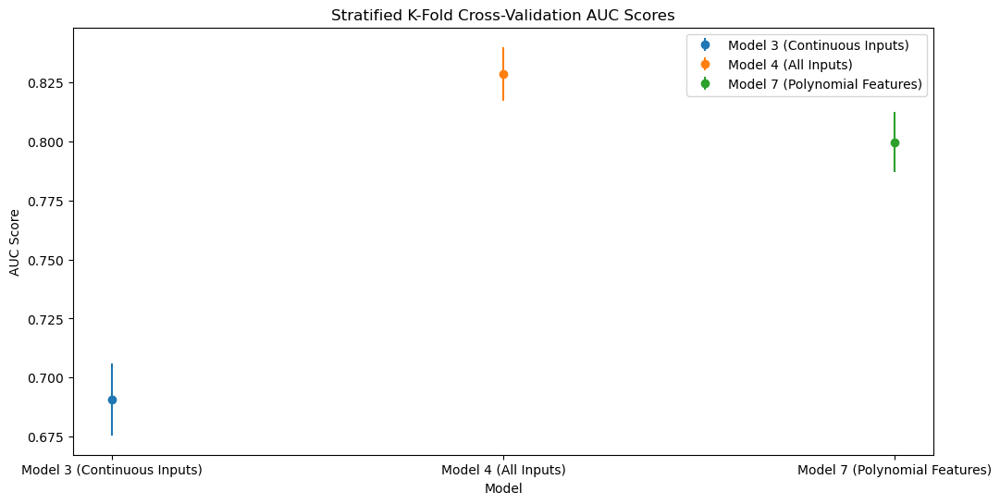

In [710]:
# Visualizing cross-validation 
plt.figure(figsize=(12, 6))
for model_name, auc_scores in stratified_kfold_results.items():
    plt.errorbar(model_name, np.mean(auc_scores), yerr=np.std(auc_scores), fmt='o', label=model_name)
plt.title('Stratified K-Fold Cross-Validation AUC Scores')
plt.xlabel('Model')
plt.ylabel('AUC Score')
plt.legend()
plt.show()

#### Here I tried Repeated Stratified K-Fold Cross-Validation

In [711]:
def repeated_stratified_kfold_cv(model, X, y, folds=5, repeats=10):
    rskf = RepeatedStratifiedKFold(n_splits=folds, n_repeats=repeats, random_state=42)
    auc_scores = cross_val_score(model, X, y, cv=rskf, scoring='roc_auc')
    return auc_scores

In [712]:
df_athletics_2 = df_athletics_2.apply(lambda x: x.replace('(MISSING)', np.nan) if x.dtype == 'object' else x)
X = df_athletics_2.drop(columns=['return_next_season'])
y = df_athletics_2['return_next_season']

In [713]:
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = X.select_dtypes(include=['category', 'object']).columns.tolist()

In [714]:
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

In [715]:
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore'))
])

In [716]:
preprocessor_all = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [717]:
# Defining models
models = {
    "Model 3 (Continuous Inputs)": Pipeline([
        ('preprocessor', preprocessor_numeric),
        ('logreg', LogisticRegression(max_iter=1000))
    ]),
    "Model 4 (All Inputs)": Pipeline([
        ('preprocessor', preprocessor_all),
        ('logreg', LogisticRegression(max_iter=1000))
    ]),
    "Model 7 (Polynomial Features)": Pipeline([
        ('preprocessor', preprocessor_all),
        ('poly', PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)),
        ('logreg', LogisticRegression(max_iter=1000))
    ])
}

In [718]:
# Performing cross-validation
repeated_stratified_kfold_results = {}

for model_name, model in models.items():
    try:
        auc_scores = repeated_stratified_kfold_cv(model, X, y)
        repeated_stratified_kfold_results[model_name] = auc_scores
        print(f"{model_name} - Repeated Stratified K-Fold AUC Scores: {auc_scores}")
    except Exception as e:
        print(f"Error in {model_name}: {e}")

Model 3 (Continuous Inputs) - Repeated Stratified K-Fold AUC Scores: [0.71726572 0.69635595 0.68731792 0.67402436 0.67898583 0.67204574
 0.72200845 0.71933383 0.67562516 0.66861546 0.67314939 0.67460104
 0.6833209  0.70087994 0.71250311 0.67319911 0.69754909 0.68198857
 0.69765846 0.69326373 0.66317673 0.70747204 0.68304251 0.69128511
 0.71195625 0.72846135 0.70126771 0.70825752 0.63685807 0.69263734
 0.66783992 0.69316431 0.71555556 0.69556053 0.68785483 0.70153617
 0.7105742  0.67573453 0.68220731 0.68704947 0.6944171  0.71264231
 0.70619935 0.66048223 0.68692021 0.65572956 0.67963212 0.7048173
 0.71609247 0.69521253]
Model 4 (All Inputs) - Repeated Stratified K-Fold AUC Scores: [0.81481481 0.83152871 0.84857072 0.82177479 0.82703455 0.82820781
 0.84667164 0.84235645 0.81352225 0.81138454 0.81764852 0.84477256
 0.82673627 0.80719861 0.83780263 0.8145563  0.84001989 0.83240368
 0.81181208 0.83977131 0.83311956 0.83494904 0.82054188 0.82179468
 0.83915486 0.8483122  0.85002237 0.834640

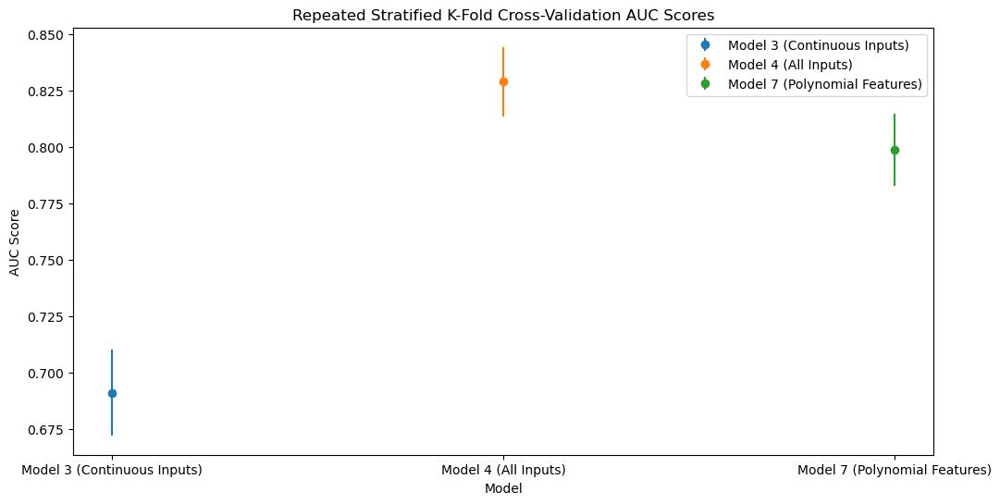

In [719]:
# Visualizing cross-validation results
plt.figure(figsize=(12, 6))
for model_name, auc_scores in repeated_stratified_kfold_results.items():
    plt.errorbar(model_name, np.mean(auc_scores), yerr=np.std(auc_scores), fmt='o', label=model_name)
plt.title('Repeated Stratified K-Fold Cross-Validation AUC Scores')
plt.xlabel('Model')
plt.ylabel('AUC Score')
plt.legend()
plt.show()

#### According to cross validation, `Model 4: All Inputs` is best because it shows the highest AUC scores across all the cross validation techniques I tried. 
* The best model from the training set had been identified as Model 7: Polynomial functions, but model 4 was one of the best from the training set as well. 
* How many regression coefficients are associated with Model 4?
  * 16 coefficients 
    * Intercept
    * Gender Filled (Female, Male, Prefer not to say, Prefer to self-describe)
    * Age Bins (26-35, 36-45, 46-55, 56-65, 66-75, 76-85, 86-100
    * Price per ticket
    * Log-transformed distance miles
    * Log-transformed ticket count

This means that model 4 is able to perform consistently across all of the data. Since it uses all of the inputs, it shows that using all of the features will show the best predictive performance, especailly since it is also a complex model. 

## Ridge

In [720]:
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import GridSearchCV
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

In [750]:
def ridge_model_cv(X, y):
    numeric_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
    categorical_features = X.select_dtypes(include=['category', 'object']).columns.tolist()

    # Preprocessing 
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])
    
    categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore'))
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
        ]
    )
    
    # model pipeline
    ridge_pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('poly', PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)),
        ('ridge', RidgeClassifier())
    ])
    
    param_grid = {
        'ridge__alpha': np.logspace(-6, 6, 13)
    }
    
    # GridSearchCV to find best alpha
    grid_search = GridSearchCV(ridge_pipeline, param_grid, cv=5, scoring='roc_auc', n_jobs=-1)
    grid_search.fit(X, y)

    best_model = grid_search.best_estimator_
    
    return best_model, grid_search

In [722]:
df_athletics_2 = df_athletics_2.apply(lambda x: x.replace('(MISSING)', np.nan) if x.dtype == 'object' else x)
X = df_athletics_2.drop(columns=['return_next_season'])
y = df_athletics_2['return_next_season']

In [723]:
best_ridge_model, grid_search = ridge_model_cv(X, y)

In [724]:
print("Best alpha:", grid_search.best_params_['ridge__alpha'])

Best alpha: 100.0


In [725]:
preprocessor = best_ridge_model.named_steps['preprocessor']
poly = best_ridge_model.named_steps['poly']

In [726]:
X_preprocessed = preprocessor.fit_transform(X)
poly_feature_names = poly.get_feature_names_out(input_features=numeric_features + list(preprocessor.named_transformers_['cat'].named_steps['onehot'].get_feature_names_out(categorical_features)))

In [727]:
coefficients = best_ridge_model.named_steps['ridge'].coef_
coef_df = pd.DataFrame(coefficients, columns=poly_feature_names)

In [728]:
print("Ridge Coefficients:")
print(coef_df)

Ridge Coefficients:
   accountid       age  distancemiles  peak_drivetime  offpeak_drivetime  \
0  -0.009507  0.031399      -0.023326        0.007053          -0.001925   

   season  ticket_count  price_per_ticket  log_distancemiles  \
0     0.0      0.031021          0.103243          -0.032368   

   log_ticket_count  ...  bin_age_86-100 gender_filled_Female  \
0          0.057533  ...                                  0.0   

   bin_age_86-100 gender_filled_Male  \
0                            0.00076   

   bin_age_86-100 gender_filled_Prefer not to say  \
0                                             0.0   

   bin_age_86-100 gender_filled_Prefer to self-describe  \
0                                                0.0      

   gender_filled_Female gender_filled_Male  \
0                                      0.0   

   gender_filled_Female gender_filled_Prefer not to say  \
0                                                0.0      

   gender_filled_Female gender_filled_Prefer to 

Most of the coefficients for each feature are relatively close to 0 and the regularization strength is 100, so it means that it reduced the influence of the features that were not as significant. This means that not all interactions and polynomial features are important, so it does not improve the prediction performance. This shows us that Model 4(all inputs) is still the best model even if model 7(polynomial) was the most complex. 

## Lasso

In [729]:
from sklearn.linear_model import LassoCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder
from sklearn.impute import SimpleImputer

In [730]:
#preprocessing
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore'))
])

In [731]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [732]:
model_lasso = Pipeline([
    ('preprocessor', preprocessor),
    ('poly', PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)),
    ('lasso', LassoCV(cv=5, random_state=121))
])

In [733]:
model_lasso.fit(X, y)

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.07169667183825368, tolerance: 0.06162823660714293
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0845144933362576, tolerance: 0.06162823660714293
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.16703175091481626, tolerance: 0.06162823660714293
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/cmpinf2100/lib/

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.25723606181895775, tolerance: 0.06322198660714289
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.38110340400862697, tolerance: 0.06322198660714289
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:614: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.4238701591185645, tolerance: 0.06322198660714289
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/cmpinf2100/lib/

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['accountid', 'age',
                                                   'distancemiles',
                                                   'peak_drivetime',
                                                   'offpeak_drivetime',
                                                   'season', 'ticket_count',
                                                   'price_per_ticket',
                                                   'log_distancemiles',
                                                   'log_ticket_count',
                                                   'price_per_ticket_squared',
                                                   'sin_lo...
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  ['gender', 'direction',
                                                   'purchase_month',
                                                   'purchase_dow', 'price_type',
                                                   'price_level', 'bin_age',
                                                   'gender_filled'])])),
                ('poly',
                 PolynomialFeatures(include_bias=False, interaction_only=True)),
                ('lasso', LassoCV(cv=5, random_state=121))])

In [734]:
best_alpha_lasso = model_lasso.named_steps['lasso'].alpha_
print(f"Best alpha for Lasso: {best_alpha_lasso}")

Best alpha for Lasso: 0.0020908672744129387


In [735]:
lasso_coefficients = model_lasso.named_steps['lasso'].coef_

In [736]:
best_alpha_lasso = model_lasso.named_steps['lasso'].alpha_
print(f"Best alpha for Lasso: {best_alpha_lasso}")

Best alpha for Lasso: 0.0020908672744129387


In [737]:
zero_coefficients = (lasso_coefficients == 0).sum()
total_coefficients = len(lasso_coefficients)

print(f"Number of coefficients: {total_coefficients}")
print(f"Number of zero coefficients: {zero_coefficients}")

Number of coefficients: 1275
Number of zero coefficients: 1137


In [738]:
preprocessor.fit(X)
X_transformed = preprocessor.transform(X)
feature_names = numeric_features + list(preprocessor.transformers_[1][1]['onehot'].get_feature_names_out(categorical_features))

In [739]:
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
poly.fit(X_transformed)
poly_feature_names = poly.get_feature_names_out(feature_names)

In [740]:
coefficients_df = pd.DataFrame({
    'Feature': poly_feature_names,
    'Coefficient': lasso_coefficients
})
coefficients_df = coefficients_df.sort_values(by='Coefficient', ascending=False)
print(coefficients_df)

                                        Feature  Coefficient
47                           gender_filled_Male     0.162160
401  price_per_ticket price_level_Upper Corners     0.122220
41                                bin_age_46-55     0.092799
42                                bin_age_56-65     0.086376
140                           age bin_age_66-75     0.078628
..                                          ...          ...
883               direction_W price_level_Other    -0.085479
595               gender_Male price_level_Other    -0.100726
597      gender_Male price_level_Upper Sideline    -0.102848
588                   gender_Male price_type_IA    -0.224412
582            gender_Male purchase_month_Other    -0.325784

[1275 rows x 2 columns]


There are 1137 zero coefficients. Based on what was derived gender_filled_Male, price_per_ticket price_level_Upper Corners, bin_age_46-55, bin_age_56-65, and age bin_age_66-75 are all positive coefficients which influence the person to be more likely to repurchase next year. Versus gender_Male purchase_month_Other, gender_Male price_type_IA, gender_Male price_level_Upper Sideline, gender_Male price_level_Other, and direction_W price_level_Other are all negative coefficients so they negatively impact their likelihood of coming back to buy a ticket for the next season. 

## Elastic Net

In [749]:
from sklearn.linear_model import ElasticNetCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

In [742]:
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = X.select_dtypes(include=['category', 'object']).columns.tolist()

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [743]:
elastic_net_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('elasticnet', ElasticNetCV(cv=5, l1_ratio=[.1, .5, .7, .9, .95, .99, 1], alphas=np.logspace(-4, 1, 50), max_iter=1000))
])

In [744]:
elastic_net_pipeline.fit(X, y)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['accountid', 'age',
                                                   'distancemiles',
                                                   'peak_drivetime',
                                                   'offpeak_drivetime',
                                                   'season', 'ticket_count',
                                                   'price_per_ticket',
                                                   'log_distancemiles',
                                                   'log_ticket_count',
                                                   'price_per_ticket_squared',
                                                   'sin_lo...
       7.19685673e-02, 9.10298178e-02, 1.15139540e-01, 1.45634848e-01,
       1.84206997e-01, 2.32995181e-01, 2.94705170e-01, 3.72759372e-01,
       4.71486636e-01, 5.96362332e-01, 7.54312006e-01, 9.54095476e-01,
       1.20679264e+00, 1.52641797e+00, 1.93069773e+00, 2.44205309e+00,
       3.08884360e+00, 3.90693994e+00, 4.94171336e+00, 6.25055193e+00,
       7.90604321e+00, 1.00000000e+01]),
                              cv=5,
                              l1_ratio=[0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 1]))])

In [745]:
best_alpha = elastic_net_pipeline.named_steps['elasticnet'].alpha_
best_l1_ratio = elastic_net_pipeline.named_steps['elasticnet'].l1_ratio_

print(f"Best alpha for ElasticNet: {best_alpha}")
print(f"Best l1_ratio for ElasticNet: {best_l1_ratio}")


Best alpha for ElasticNet: 0.00020235896477251576
Best l1_ratio for ElasticNet: 1.0


In [746]:
elastic_net_coefs = elastic_net_pipeline.named_steps['elasticnet'].coef_

In [747]:
feature_names = preprocessor.get_feature_names_out()
elastic_net_coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': elastic_net_coefs})
elastic_net_coef_df = elastic_net_coef_df[elastic_net_coef_df['Coefficient'] != 0].sort_values(by='Coefficient', ascending=False)

In [748]:
num_zero_coefs = (elastic_net_coefs == 0).sum()
print(f"Number of zero coefficients: {num_zero_coefs}")
print(elastic_net_coef_df)

Number of zero coefficients: 8
                                Feature  Coefficient
41                   cat__bin_age_46-55     0.162969
47              cat__gender_filled_Male     0.160756
40                   cat__bin_age_36-45     0.158437
42                   cat__bin_age_56-65     0.119277
39                   cat__bin_age_26-35     0.116440
44                   cat__bin_age_76-85     0.116314
43                   cat__bin_age_66-75     0.108741
33  cat__price_level_Lower Panther Gold     0.090832
7                 num__price_per_ticket     0.078340
9                 num__log_ticket_count     0.052567
32  cat__price_level_Lower Panther Blue     0.039496
46            cat__gender_filled_Female     0.033257
1                              num__age     0.030861
27                cat__purchase_dow_Tue     0.030762
28                cat__purchase_dow_Wed     0.030715
34   cat__price_level_Lower Panther Red     0.027259
4                num__offpeak_drivetime     0.018648
10        num__

There are 8 zero coefficients. Since the L1ratio was 1.0, it means that it behaves more like a Lasso as it ofcuses on certain features and makes coeffieicnts zero. cat__bin_age_46-55, cat__gender_filled_Male, cat__bin_age_36-45, and cat__bin_age_56-65 have the highest positive coefficients, which means they are more likely to renew their season tickets. Versus cat__bin_age_46-55, cat__gender_filled_Male, cat__bin_age_36-45, and cat__bin_age_56-65 which have the highest negative coefficient, which means they are least likely to renew their season tickets.